# 37 — HINT and MAT Method Selection

**Origin:** Explicit post-pipeline scientific extension; Notebooks 01–36 remain frozen\
**Refactor status:** Finished\
**Validation status:** Finished\
**Completion gate passed:** Yes\
**Output root:** `outputs/37_hint_mat_method_selection/`\
**Depends on:** Notebooks 01, 02, 03, 04, 08, 13–17, 19–21, 27–30, and the governing evidence-coverage registry

## Purpose

Compare HINT and MAT on a predeclared paired pilot to select one additional learned inpainting method—or neither—for the planned expanded benchmark.

This notebook does not modify the completed three-method benchmark. It produces separately owned extension evidence and does not treat twelve cases as a full model evaluation.

## Approved evidence population

- 12 nonzero canonical cases;
- 5 paintings covering all broad visual categories;
- 3 cases for each canonical damage family;
- 2 methods per case;
- 24 restoration candidates;
- one separate zero-control identity check;
- painting as the independent unit;
- cases treated as observations nested within paintings.

Case selection was frozen before metric computation and cannot be changed using restoration results.

## Method contract

- HINT uses the official Places2 checkpoint.
- HINT first attempts 768 × 768 and may use the declared 512 adapter only after a recorded technical failure.
- MAT uses the official Places-512 FullData checkpoint and its required 512 adapter.
- MAT’s retained-pixel mask convention is converted from the canonical missing-pixel convention.
- Both methods return 768 × 768 RGB outputs.
- Exact compositing permits changes only inside the canonical missing-region mask.
- Seed `2026` is fixed wherever stochastic operations apply.

## Interpretation limits

- This is a method-selection pilot, not a fourth full benchmark.
- The sample supports paired descriptive comparison, not population-level inference.
- Neither model was trained specifically for painting conservation.
- Metric evidence does not establish historical correctness or conservation suitability.
- No combined quality, uncertainty, or trustworthiness score is constructed.
- The final choice is human-owned and may be HINT, MAT, or neither.

## Canonical outputs

- `data/selection_scope.csv`
- `data/candidates.csv`
- `images/restored/hint/`
- `images/restored/mat/`
- `metrics/metric_values.csv`
- `metrics/runtime_summary.csv`
- `metrics/decision_scorecard.csv`
- `figures/smoke_comparison.png`
- `figures/metric_comparison.png`
- `figures/selection_atlas.png`
- `reports/method_selection_report.html`
- `reports/selection_decision.json`
- `manifests/run_manifest.json`
- `manifests/artifacts.csv`
- `validation/checks.csv`

## Batch 1 — Contract, environment, and dependency preflight

This batch:

- discovers the repository without assuming the working directory;
- loads and validates the frozen N37 configuration;
- creates only the declared notebook-owned directories;
- verifies the refreshed inventory and governing documents;
- reconstructs the exact 12-case and 24-candidate contracts;
- confirms damage-family and visual-category coverage;
- verifies that the zero control is QA-only;
- audits external repositories, pinned revisions, checkpoints, licenses, and packages;
- checks CUDA availability without loading either model;
- records a preliminary validation table under `work/`;
- blocks later execution if any required external dependency is unavailable.

No restoration model is loaded and no inference is performed in this batch.

In [1]:
from __future__ import annotations

import json
import os
import platform
import sys
from importlib import metadata
from pathlib import Path

import pandas as pd
from IPython.display import display


def discover_project_root(start: Path | None = None) -> Path:
    current = (start or Path.cwd()).resolve()
    for candidate in (current, *current.parents):
        contract = candidate / "config" / "experiments" / "hint_mat_selection.yaml"
        if contract.is_file():
            return candidate
    raise FileNotFoundError(
        "Could not locate config/experiments/hint_mat_selection.yaml"
    )


PROJECT_ROOT = discover_project_root()
SRC_ROOT = PROJECT_ROOT / "src"

if str(SRC_ROOT) not in sys.path:
    sys.path.insert(0, str(SRC_ROOT))

from restoration_eval.hint_mat_selection import (
    CANDIDATE_COLUMNS,
    CONFIG_SCHEMA_VERSION,
    HELPER_NAME,
    HELPER_VERSION,
    SELECTION_SCOPE_COLUMNS,
    atomic_write_csv,
    build_candidate_plan,
    build_selection_scope,
    inspect_external_assets,
    load_selection_config,
    utc_now_iso,
    validate_candidate_table,
    validate_zero_control_qa,
)
from restoration_eval.schemas import (
    SCHEMAS_MODULE_VERSION,
    get_schema,
    validate_dataframe,
)
from restoration_eval.validation import ValidationCollector

print("Project root:", PROJECT_ROOT)
print("Python:", platform.python_version())
print("N37 helper:", HELPER_NAME, HELPER_VERSION)
print("Schema module:", SCHEMAS_MODULE_VERSION)

Project root: D:\Masters\FH\Thesis\painting-restoration-eval
Python: 3.12.6
N37 helper: restoration_eval.hint_mat_selection 1.0.1
Schema module: 1.18.0


In [2]:
CONFIG_PATH = (
    PROJECT_ROOT
    / "config"
    / "experiments"
    / "hint_mat_selection.yaml"
)
CONFIG = load_selection_config(CONFIG_PATH)

OUTPUT_ROOT = (
    PROJECT_ROOT / CONFIG["output"]["output_root"]
).resolve()

if PROJECT_ROOT not in OUTPUT_ROOT.parents:
    raise ValueError(
        f"Output root escaped the repository: {OUTPUT_ROOT}"
    )

OUTPUT_DIRECTORIES = (
    OUTPUT_ROOT / "data",
    OUTPUT_ROOT / "images" / "restored" / "hint",
    OUTPUT_ROOT / "images" / "restored" / "mat",
    OUTPUT_ROOT / "metrics",
    OUTPUT_ROOT / "figures",
    OUTPUT_ROOT / "reports",
    OUTPUT_ROOT / "manifests",
    OUTPUT_ROOT / "validation",
    OUTPUT_ROOT / "work",
)

for directory in OUTPUT_DIRECTORIES:
    directory.mkdir(parents=True, exist_ok=True)

RUN_STARTED_AT_UTC = utc_now_iso()
VALIDATION = ValidationCollector()

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="configuration_schema",
    check_description="N37 configuration uses the approved schema.",
    severity="blocking",
    expected=CONFIG_SCHEMA_VERSION,
    observed=CONFIG["config_schema_version"],
    passed=(
        CONFIG["config_schema_version"]
        == CONFIG_SCHEMA_VERSION
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="output_ownership",
    check_description="All N37 outputs remain inside its owned root.",
    severity="blocking",
    expected="inside outputs/37_hint_mat_method_selection",
    observed=str(OUTPUT_ROOT.relative_to(PROJECT_ROOT)),
    passed=PROJECT_ROOT in OUTPUT_ROOT.parents,
)

print("Configuration:", CONFIG_PATH.relative_to(PROJECT_ROOT))
print("Output root:", OUTPUT_ROOT.relative_to(PROJECT_ROOT))
print("Run started:", RUN_STARTED_AT_UTC)
print("Created/verified directories:", len(OUTPUT_DIRECTORIES))

Configuration: config\experiments\hint_mat_selection.yaml
Output root: outputs\37_hint_mat_method_selection
Run started: 2026-09-06T01:16:15.622007Z
Created/verified directories: 9


In [3]:
INPUT_PATHS = {
    key: (PROJECT_ROOT / value).resolve()
    for key, value in CONFIG["inputs"].items()
}

missing_inputs = [
    key
    for key, path in INPUT_PATHS.items()
    if not path.is_file()
]

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="declared_repository_inputs",
    check_description=(
        "Every repository-owned input declared by the "
        "N37 configuration exists."
    ),
    severity="blocking",
    expected="all declared files present",
    observed={
        "declared": len(INPUT_PATHS),
        "missing": missing_inputs,
    },
    passed=not missing_inputs,
)

inventory = pd.read_csv(INPUT_PATHS["inventory_path"])

with INPUT_PATHS["inventory_run_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    inventory_run = json.load(handle)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="inventory_status",
    check_description="The current inventory run completed.",
    severity="blocking",
    expected="completed",
    observed=inventory_run.get("status"),
    passed=inventory_run.get("status") == "completed",
)

read_error_rows = inventory.loc[
    pd.to_numeric(
        inventory["read_error_count"],
        errors="coerce",
    ).fillna(0).gt(0)
].copy()

known_inventory_exception = (
    set(read_error_rows["relative_path"].astype(str))
    <= {".devcontainer/devcontainer.json"}
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="inventory_read_errors",
    check_description=(
        "Inventory read warnings are absent or limited to "
        "the known JSONC devcontainer file."
    ),
    severity="blocking",
    expected="none or known devcontainer JSONC warning",
    observed=read_error_rows[
        ["relative_path", "read_errors_json"]
    ].to_dict(orient="records"),
    passed=known_inventory_exception,
)

governing_paths = {
    "implementation_guidelines":
        INPUT_PATHS["implementation_guidelines_path"],
    "notebook_roadmap":
        INPUT_PATHS["notebook_roadmap_path"],
    "evidence_audit":
        INPUT_PATHS["evidence_dependency_audit_path"],
    "evidence_coverage":
        INPUT_PATHS["evidence_coverage_path"],
}

governing_mentions = {
    key: (
        "37" in path.read_text(
            encoding="utf-8-sig"
        )
    )
    for key, path in governing_paths.items()
}

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="governing_contracts_updated",
    check_description=(
        "Every governing document records the "
        "approved Notebook 37 extension."
    ),
    severity="blocking",
    expected="all four governing files reference N37",
    observed=governing_mentions,
    passed=all(governing_mentions.values()),
)

print("Inventory run:", inventory_run["inventory_run_id"])
print("Inventory rows:", len(inventory))
print("Declared repository inputs:", len(INPUT_PATHS))
print("Known inventory warnings:", len(read_error_rows))

Inventory run: inventory_20260906T002259Z_af70df54
Inventory rows: 19180
Declared repository inputs: 14
Known inventory warnings: 1


In [4]:
case_registry = pd.read_csv(
    INPUT_PATHS["case_registry_path"]
)
artworks = pd.read_csv(
    INPUT_PATHS["artworks_path"]
)

SELECTION_SCOPE = build_selection_scope(
    case_registry,
    artworks,
    CONFIG,
)
ZERO_CONTROL_QA = validate_zero_control_qa(
    case_registry,
    CONFIG,
)
CANDIDATE_PLAN = build_candidate_plan(
    SELECTION_SCOPE,
    CONFIG,
)

scope_schema_result = validate_dataframe(
    SELECTION_SCOPE,
    get_schema("hint_mat_selection_scope"),
)
candidate_schema_result = validate_dataframe(
    CANDIDATE_PLAN,
    get_schema("hint_mat_candidates"),
)
validate_candidate_table(CANDIDATE_PLAN)

family_counts = (
    SELECTION_SCOPE["damage_type"]
    .value_counts()
    .sort_index()
    .to_dict()
)
category_counts = (
    SELECTION_SCOPE["category"]
    .value_counts()
    .sort_index()
    .to_dict()
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="selection_scope_schema",
    check_description=(
        "The selected case table satisfies its normalized schema."
    ),
    severity="blocking",
    expected="schema passed",
    observed=scope_schema_result.to_dict(),
    passed=scope_schema_result.passed,
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="candidate_plan_schema",
    check_description=(
        "The paired candidate plan satisfies its normalized schema."
    ),
    severity="blocking",
    expected="schema passed",
    observed=candidate_schema_result.to_dict(),
    passed=candidate_schema_result.passed,
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="exact_case_and_candidate_counts",
    check_description=(
        "The experiment has exactly 12 cases and "
        "24 paired candidates."
    ),
    severity="blocking",
    expected={"cases": 12, "candidates": 24},
    observed={
        "cases": len(SELECTION_SCOPE),
        "candidates": len(CANDIDATE_PLAN),
    },
    passed=(
        len(SELECTION_SCOPE) == 12
        and len(CANDIDATE_PLAN) == 24
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="damage_family_balance",
    check_description=(
        "Each canonical damage family has exactly three cases."
    ),
    severity="blocking",
    expected={
        "scratch_thin": 3,
        "loss_small": 3,
        "loss_large": 3,
        "mixed_damage": 3,
    },
    observed=family_counts,
    passed=(
        set(family_counts.values()) == {3}
        and len(family_counts) == 4
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="visual_category_coverage",
    check_description=(
        "All five visual categories have at least two cases."
    ),
    severity="blocking",
    expected="five categories, minimum two cases each",
    observed=category_counts,
    passed=(
        len(category_counts) == 5
        and min(category_counts.values()) >= 2
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="zero_control_qa_only",
    check_description=(
        "The zero-control identity case is excluded "
        "from the comparison population."
    ),
    severity="blocking",
    expected="QA case absent from 12-case scope",
    observed=ZERO_CONTROL_QA["case_id"],
    passed=(
        ZERO_CONTROL_QA["case_id"]
        not in set(SELECTION_SCOPE["case_id"])
    ),
)

scope_display = SELECTION_SCOPE[
    [
        "selection_rank",
        "case_id",
        "painting_id",
        "category",
        "damage_type",
        "realized_damage_fraction",
    ]
].copy()

scope_display["realized_damage_pct"] = (
    scope_display.pop("realized_damage_fraction") * 100
).round(2)

display(scope_display)

print("Damage-family counts:", family_counts)
print("Visual-category counts:", category_counts)
print("Zero-control QA:", ZERO_CONTROL_QA["case_id"])
print("Paired candidates:", len(CANDIDATE_PLAN))

,selection_rank,case_id,painting_id,category,damage_type,realized_damage_pct
0,1,canonical__p001__loss_large,p001,portrait_figure,loss_large,13.90
1,2,canonical__p001__mixed_damage,p001,portrait_figure,mixed_damage,9.43
2,3,canonical__p018__loss_small,p018,landscape_natural,loss_small,4.83
3,4,canonical__p018__mixed_damage,p018,landscape_natural,mixed_damage,9.36
4,5,canonical__p026__scratch_thin,p026,architecture_structured,scratch_thin,2.35
5,6,canonical__p026__loss_large,p026,architecture_structured,loss_large,10.70
6,7,canonical__p039__scratch_thin,p039,abstraction_surrealism,scratch_thin,1.31
7,8,canonical__p039__loss_small,p039,abstraction_surrealism,loss_small,5.09
8,9,canonical__p039__mixed_damage,p039,abstraction_surrealism,mixed_damage,8.42
9,10,canonical__p043__scratch_thin,p043,high_texture_brushwork,scratch_thin,2.04


Damage-family counts: {'loss_large': 3, 'loss_small': 3, 'mixed_damage': 3, 'scratch_thin': 3}
Visual-category counts: {'abstraction_surrealism': 3, 'architecture_structured': 2, 'high_texture_brushwork': 3, 'landscape_natural': 2, 'portrait_figure': 2}
Zero-control QA: canonical__p001__zero_control
Paired candidates: 24


In [5]:
EXTERNAL_ASSET_AUDIT = inspect_external_assets(CONFIG)

distribution_names = {
    "torch": "torch",
    "torchvision": "torchvision",
    "einops": "einops",
    "click": "click",
    "requests": "requests",
    "ninja": "ninja",
    "timm": "timm",
}

package_rows = []

for label, distribution in distribution_names.items():
    try:
        version = metadata.version(distribution)
        installed = True
    except metadata.PackageNotFoundError:
        version = "not_installed"
        installed = False

    package_rows.append(
        {
            "package": label,
            "distribution": distribution,
            "version": version,
            "installed": installed,
        }
    )

PACKAGE_AUDIT = pd.DataFrame(package_rows)

try:
    import torch

    TORCH_IMPORT_ERROR = ""
    CUDA_AVAILABLE = bool(torch.cuda.is_available())
    GPU_NAME = (
        str(torch.cuda.get_device_name(0))
        if CUDA_AVAILABLE
        else ""
    )
    GPU_MEMORY_BYTES = (
        int(
            torch.cuda.get_device_properties(0)
            .total_memory
        )
        if CUDA_AVAILABLE
        else 0
    )
except Exception as exc:
    TORCH_IMPORT_ERROR = f"{type(exc).__name__}: {exc}"
    CUDA_AVAILABLE = False
    GPU_NAME = ""
    GPU_MEMORY_BYTES = 0

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="adapter_dependencies",
    check_description=(
        "All lightweight HINT/MAT adapter dependencies "
        "are installed."
    ),
    severity="blocking",
    expected="all required packages installed",
    observed=PACKAGE_AUDIT.to_dict(orient="records"),
    passed=bool(PACKAGE_AUDIT["installed"].all()),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="cuda_available",
    check_description=(
        "CUDA is available for the two model workers."
    ),
    severity="blocking",
    expected="CUDA available",
    observed={
        "available": CUDA_AVAILABLE,
        "gpu_name": GPU_NAME,
        "gpu_memory_bytes": GPU_MEMORY_BYTES,
        "torch_error": TORCH_IMPORT_ERROR,
    },
    passed=CUDA_AVAILABLE,
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="external_model_assets",
    check_description=(
        "Official repositories, pinned revisions, and "
        "released checkpoints are available."
    ),
    severity="blocking",
    expected="HINT and MAT ready",
    observed=EXTERNAL_ASSET_AUDIT.to_dict(
        orient="records"
    ),
    passed=bool(EXTERNAL_ASSET_AUDIT["ready"].all()),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="declared_licenses",
    check_description=(
        "Both method licenses are explicitly recorded."
    ),
    severity="blocking",
    expected={
        "hint": "MIT",
        "mat": "CC-BY-NC-4.0",
    },
    observed=dict(
        zip(
            EXTERNAL_ASSET_AUDIT["model_key"],
            EXTERNAL_ASSET_AUDIT["license"],
        )
    ),
    passed=(
        set(EXTERNAL_ASSET_AUDIT["license"])
        == {"MIT", "CC-BY-NC-4.0"}
    ),
)

display(EXTERNAL_ASSET_AUDIT)
display(PACKAGE_AUDIT)

print("CUDA available:", CUDA_AVAILABLE)
print("GPU:", GPU_NAME or "not available")
print(
    "GPU memory GiB:",
    round(GPU_MEMORY_BYTES / (1024 ** 3), 2),
)

,model_key,model_id,repository_path,repository_exists,repository_required_files_present,missing_repository_files,pinned_repository_revision,actual_repository_revision,repository_revision_matches,checkpoint_path,checkpoint_exists,checkpoint_size_bytes,checkpoint_sha256,license,ready
0,hint,hint_places2,D:\Models\HINT,True,True,,15e867d8c8689b9d5050383fc3884537ae876145,15e867d8c8689b9d5050383fc3884537ae876145,True,D:\Models\HINT\checkpoints\places2\InpaintingM...,True,387049240,f7c78feac68aa06ff10d6efbb2f8e2cc040720d2ce5ebb...,MIT,True
1,mat,mat_places_512_fulldata,D:\Models\MAT,True,True,,d273d891ecdad2e1df106516423a75bc45b2d800,d273d891ecdad2e1df106516423a75bc45b2d800,True,D:\Models\MAT\pretrained\Places_512_FullData.pkl,True,661420475,d960c4e6b3266b6b9fa74ee4458a9482160d54c06d7738...,CC-BY-NC-4.0,True


,package,distribution,version,installed
0,torch,torch,2.5.1+cu121,True
1,torchvision,torchvision,0.20.1+cu121,True
2,einops,einops,0.8.2,True
3,click,click,8.4.2,True
4,requests,requests,2.34.2,True
5,ninja,ninja,1.13.2,True
6,timm,timm,1.0.27,True


CUDA available: True
GPU: NVIDIA GeForce RTX 3060 Laptop GPU
GPU memory GiB: 6.0


In [6]:
declared_output_paths = {
    key: value
    for key, value in CONFIG["output"].items()
    if key not in {
        "notebook_id",
        "notebook_stem",
        "output_root",
    }
}

resolved_output_paths = {
    key: (OUTPUT_ROOT / value).resolve()
    for key, value in declared_output_paths.items()
}

escaped_outputs = {
    key: str(path)
    for key, path in resolved_output_paths.items()
    if (
        path != OUTPUT_ROOT
        and OUTPUT_ROOT not in path.parents
    )
}

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="declared_output_paths",
    check_description=(
        "Every declared output path remains under "
        "the N37 output root."
    ),
    severity="blocking",
    expected="no escaped paths",
    observed=escaped_outputs,
    passed=not escaped_outputs,
)

PREFLIGHT_CHECKS_PATH = (
    OUTPUT_ROOT / "work" / "batch_1_preflight_checks.csv"
)

PREFLIGHT_CHECKS = VALIDATION.to_dataframe()
atomic_write_csv(
    PREFLIGHT_CHECKS,
    PREFLIGHT_CHECKS_PATH,
)

BATCH_1_SUMMARY = VALIDATION.summary()
BATCH_1_PASSED = (
    BATCH_1_SUMMARY["blocking_failure_count"] == 0
)

display(PREFLIGHT_CHECKS)

print("Batch 1 summary:", BATCH_1_SUMMARY)
print(
    "Preflight table:",
    PREFLIGHT_CHECKS_PATH.relative_to(PROJECT_ROOT),
)

if BATCH_1_PASSED:
    print(
        "BATCH 1 PASSED — the exact scope and both "
        "external model environments are ready."
    )
else:
    blocking = PREFLIGHT_CHECKS.loc[
        (~PREFLIGHT_CHECKS["passed"])
        & PREFLIGHT_CHECKS["severity"].eq("blocking"),
        ["check_id", "observed", "details"],
    ]
    print(
        "BATCH 1 NOT YET PASSED — do not proceed "
        "to Batch 2."
    )
    display(blocking)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_1_preflight,configuration_schema,N37 configuration uses the approved schema.,blocking,hint_mat_selection_config.v1,hint_mat_selection_config.v1,True,
1,batch_1_preflight,output_ownership,All N37 outputs remain inside its owned root.,blocking,inside outputs/37_hint_mat_method_selection,outputs\37_hint_mat_method_selection,True,
2,batch_1_preflight,declared_repository_inputs,Every repository-owned input declared by the N...,blocking,all declared files present,"{""declared"": 14, ""missing"": []}",True,
3,batch_1_preflight,inventory_status,The current inventory run completed.,blocking,completed,completed,True,
4,batch_1_preflight,inventory_read_errors,Inventory read warnings are absent or limited ...,blocking,none or known devcontainer JSONC warning,"[{""read_errors_json"": ""[{\""stage\"":\""json_meta...",True,
5,batch_1_preflight,governing_contracts_updated,Every governing document records the approved ...,blocking,all four governing files reference N37,"{""evidence_audit"": true, ""evidence_coverage"": ...",True,
6,batch_1_preflight,selection_scope_schema,The selected case table satisfies its normaliz...,blocking,schema passed,"{""column_count"": 15, ""duplicate_primary_key_ro...",True,
7,batch_1_preflight,candidate_plan_schema,The paired candidate plan satisfies its normal...,blocking,schema passed,"{""column_count"": 55, ""duplicate_primary_key_ro...",True,
8,batch_1_preflight,exact_case_and_candidate_counts,The experiment has exactly 12 cases and 24 pai...,blocking,"{""candidates"": 24, ""cases"": 12}","{""candidates"": 24, ""cases"": 12}",True,
9,batch_1_preflight,damage_family_balance,Each canonical damage family has exactly three...,blocking,"{""loss_large"": 3, ""loss_small"": 3, ""mixed_dama...","{""loss_large"": 3, ""loss_small"": 3, ""mixed_dama...",True,


Batch 1 summary: {'check_count': 17, 'passed_count': 17, 'failed_count': 0, 'blocking_failure_count': 0, 'overall_passed': True, 'failed_check_ids': []}
Preflight table: outputs\37_hint_mat_method_selection\work\batch_1_preflight_checks.csv
BATCH 1 PASSED — the exact scope and both external model environments are ready.


## Batch 2 — Population and adapter validation

This batch:

- attaches checksums to every model input and checkpoint;
- persists the exact twelve-case selection;
- validates all clean, damaged, and mask files;
- verifies the separate zero-control identity contract;
- tests HINT's 768 and 512 input representations;
- tests MAT's inverted retained-pixel mask convention;
- measures mask changes introduced by 512-pixel resampling;
- validates exact-mask compositing without running a model;
- statically imports both official model implementations;
- creates, but does not execute, the two-case smoke-test jobs.

The 512 adapter is expected to alter the geometry of very thin scratches more than larger masks. These differences are measured and retained rather than hidden.

In [7]:
import subprocess

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

from restoration_eval.hint_mat_selection import (
    build_worker_job,
    exact_mask_composite,
    materialize_input_checksums,
    prepare_model_inputs,
)

CANDIDATE_PLAN_CHECKED = materialize_input_checksums(
    CANDIDATE_PLAN,
    project_root=PROJECT_ROOT,
)

checked_schema = validate_dataframe(
    CANDIDATE_PLAN_CHECKED,
    get_schema("hint_mat_candidates"),
)

SELECTION_SCOPE_PATH = (
    OUTPUT_ROOT
    / CONFIG["output"]["selection_scope_path"]
)
PLANNED_CANDIDATES_PATH = (
    OUTPUT_ROOT
    / "work"
    / "candidate_plan.csv"
)

atomic_write_csv(
    SELECTION_SCOPE,
    SELECTION_SCOPE_PATH,
)
atomic_write_csv(
    CANDIDATE_PLAN_CHECKED,
    PLANNED_CANDIDATES_PATH,
)

checksum_columns = [
    "input_sha256",
    "clean_sha256",
    "mask_sha256",
    "checkpoint_sha256",
]

checksum_valid = all(
    CANDIDATE_PLAN_CHECKED[column]
    .astype(str)
    .str.len()
    .eq(64)
    .all()
    for column in checksum_columns
)

VALIDATION.add(
    validation_stage="batch_2_adapter_validation",
    check_id="candidate_checksums",
    check_description=(
        "Every candidate records full input, clean, "
        "mask, and checkpoint checksums."
    ),
    severity="blocking",
    expected="64-character SHA-256 values",
    observed={
        column: bool(
            CANDIDATE_PLAN_CHECKED[column]
            .astype(str)
            .str.len()
            .eq(64)
            .all()
        )
        for column in checksum_columns
    },
    passed=checksum_valid,
)

VALIDATION.add(
    validation_stage="batch_2_adapter_validation",
    check_id="checked_candidate_schema",
    check_description=(
        "The checksummed candidate plan still "
        "satisfies its schema."
    ),
    severity="blocking",
    expected="schema passed",
    observed=checked_schema.to_dict(),
    passed=checked_schema.passed,
)

print("Selection scope persisted:", SELECTION_SCOPE_PATH)
print("Candidate plan persisted:", PLANNED_CANDIDATES_PATH)
print("Checksummed candidates:", len(CANDIDATE_PLAN_CHECKED))
print(
    "Unique checkpoints:",
    CANDIDATE_PLAN_CHECKED["checkpoint_sha256"].nunique(),
)

Selection scope persisted: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\37_hint_mat_method_selection\data\selection_scope.csv
Candidate plan persisted: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\37_hint_mat_method_selection\work\candidate_plan.csv
Checksummed candidates: 24
Unique checkpoints: 2


In [8]:
from restoration_eval.hint_mat_selection import calculate_file_sha256

input_audit_rows = []

for row in SELECTION_SCOPE.itertuples(index=False):
    input_path = PROJECT_ROOT / row.input_image_path
    clean_path = PROJECT_ROOT / row.clean_image_path
    mask_path = PROJECT_ROOT / row.mask_path

    with Image.open(input_path) as handle:
        input_size = handle.size
        input_mode = handle.mode

    with Image.open(clean_path) as handle:
        clean_size = handle.size
        clean_mode = handle.mode

    with Image.open(mask_path) as handle:
        mask_size = handle.size
        mask_array = np.asarray(
            handle.convert("L"),
            dtype=np.uint8,
        ).copy()

    mask_values = sorted(
        int(value)
        for value in np.unique(mask_array)
    )
    missing_pixels = int((mask_array >= 128).sum())

    input_audit_rows.append(
        {
            "case_id": row.case_id,
            "input_size": str(input_size),
            "input_mode": input_mode,
            "clean_size": str(clean_size),
            "clean_mode": clean_mode,
            "mask_size": str(mask_size),
            "mask_values": str(mask_values),
            "missing_pixels": missing_pixels,
            "input_valid": (
                input_size == (768, 768)
                and input_mode == "RGB"
            ),
            "clean_valid": (
                clean_size == (768, 768)
                and clean_mode == "RGB"
            ),
            "mask_valid": (
                mask_size == (768, 768)
                and set(mask_values) <= {0, 255}
                and missing_pixels > 0
            ),
        }
    )

INPUT_AUDIT = pd.DataFrame(input_audit_rows)

zero_input_path = (
    PROJECT_ROOT / ZERO_CONTROL_QA["input_image_path"]
)
zero_clean_path = (
    PROJECT_ROOT / ZERO_CONTROL_QA["clean_image_path"]
)
zero_mask_path = (
    PROJECT_ROOT / ZERO_CONTROL_QA["mask_or_effect_path"]
)

with Image.open(zero_mask_path) as handle:
    zero_mask = np.asarray(
        handle.convert("L"),
        dtype=np.uint8,
    ).copy()

zero_input_sha = calculate_file_sha256(zero_input_path)
zero_clean_sha = calculate_file_sha256(zero_clean_path)

ZERO_CONTROL_AUDIT = {
    "case_id": ZERO_CONTROL_QA["case_id"],
    "input_matches_clean": (
        zero_input_sha == zero_clean_sha
    ),
    "nonzero_mask_pixels": int((zero_mask >= 128).sum()),
}

atomic_write_csv(
    INPUT_AUDIT,
    OUTPUT_ROOT / "work" / "input_audit.csv",
)

VALIDATION.add(
    validation_stage="batch_2_adapter_validation",
    check_id="source_image_geometry",
    check_description=(
        "Every selected damaged and clean image is "
        "a 768 x 768 RGB image."
    ),
    severity="blocking",
    expected="12 valid damaged and clean pairs",
    observed={
        "input_valid": int(INPUT_AUDIT["input_valid"].sum()),
        "clean_valid": int(INPUT_AUDIT["clean_valid"].sum()),
    },
    passed=bool(
        INPUT_AUDIT["input_valid"].all()
        and INPUT_AUDIT["clean_valid"].all()
    ),
)

VALIDATION.add(
    validation_stage="batch_2_adapter_validation",
    check_id="canonical_binary_masks",
    check_description=(
        "Every comparison mask is nonempty, binary, "
        "and 768 x 768."
    ),
    severity="blocking",
    expected="12 valid canonical masks",
    observed={
        "valid": int(INPUT_AUDIT["mask_valid"].sum()),
        "total": len(INPUT_AUDIT),
    },
    passed=bool(INPUT_AUDIT["mask_valid"].all()),
)

VALIDATION.add(
    validation_stage="batch_2_adapter_validation",
    check_id="zero_control_identity",
    check_description=(
        "The QA-only zero control has an unchanged "
        "input and an empty mask."
    ),
    severity="blocking",
    expected={
        "input_matches_clean": True,
        "nonzero_mask_pixels": 0,
    },
    observed=ZERO_CONTROL_AUDIT,
    passed=bool(
        ZERO_CONTROL_AUDIT["input_matches_clean"]
        and ZERO_CONTROL_AUDIT[
            "nonzero_mask_pixels"
        ] == 0
    ),
)

display(INPUT_AUDIT)
print("Zero-control audit:", ZERO_CONTROL_AUDIT)

,case_id,input_size,input_mode,clean_size,clean_mode,mask_size,mask_values,missing_pixels,input_valid,clean_valid,mask_valid
0,canonical__p001__loss_large,"(768, 768)",RGB,"(768, 768)",RGB,"(768, 768)","[0, 255]",70792,True,True,True
1,canonical__p001__mixed_damage,"(768, 768)",RGB,"(768, 768)",RGB,"(768, 768)","[0, 255]",48039,True,True,True
2,canonical__p018__loss_small,"(768, 768)",RGB,"(768, 768)",RGB,"(768, 768)","[0, 255]",18826,True,True,True
3,canonical__p018__mixed_damage,"(768, 768)",RGB,"(768, 768)",RGB,"(768, 768)","[0, 255]",36458,True,True,True
4,canonical__p026__scratch_thin,"(768, 768)",RGB,"(768, 768)",RGB,"(768, 768)","[0, 255]",9535,True,True,True
5,canonical__p026__loss_large,"(768, 768)",RGB,"(768, 768)",RGB,"(768, 768)","[0, 255]",43455,True,True,True
6,canonical__p039__scratch_thin,"(768, 768)",RGB,"(768, 768)",RGB,"(768, 768)","[0, 255]",5664,True,True,True
7,canonical__p039__loss_small,"(768, 768)",RGB,"(768, 768)",RGB,"(768, 768)","[0, 255]",22049,True,True,True
8,canonical__p039__mixed_damage,"(768, 768)",RGB,"(768, 768)",RGB,"(768, 768)","[0, 255]",36477,True,True,True
9,canonical__p043__scratch_thin,"(768, 768)",RGB,"(768, 768)",RGB,"(768, 768)","[0, 255]",9550,True,True,True


Zero-control audit: {'case_id': 'canonical__p001__zero_control', 'input_matches_clean': True, 'nonzero_mask_pixels': 0}


In [9]:
adapter_rows = []

for row in SELECTION_SCOPE.itertuples(index=False):
    input_path = PROJECT_ROOT / row.input_image_path
    mask_path = PROJECT_ROOT / row.mask_path

    (
        hint_image_768,
        hint_mask_768,
        missing_768,
        source_768,
    ) = prepare_model_inputs(
        input_path,
        mask_path,
        inference_size=768,
    )

    (
        hint_image_512,
        hint_mask_512,
        _,
        _,
    ) = prepare_model_inputs(
        input_path,
        mask_path,
        inference_size=512,
    )

    (
        mat_image_512,
        mat_retained_512,
        _,
        _,
    ) = prepare_model_inputs(
        input_path,
        mask_path,
        inference_size=512,
        mat_mask_semantics=True,
    )

    roundtrip_mask = np.asarray(
        Image.fromarray(
            (hint_mask_512 * 255).astype(np.uint8),
            mode="L",
        ).resize(
            (768, 768),
            Image.Resampling.NEAREST,
        ),
        dtype=np.uint8,
    ) >= 128

    original_mask = missing_768.astype(bool)
    intersection = int(
        np.logical_and(
            original_mask,
            roundtrip_mask,
        ).sum()
    )
    union = int(
        np.logical_or(
            original_mask,
            roundtrip_mask,
        ).sum()
    )

    mask_iou = (
        intersection / union
        if union
        else 1.0
    )
    area_relative_error = abs(
        int(roundtrip_mask.sum())
        - int(original_mask.sum())
    ) / max(int(original_mask.sum()), 1)

    iou_threshold = (
        0.70
        if row.damage_type == "scratch_thin"
        else 0.90
    )

    synthetic_generated = np.full(
        (512, 512, 3),
        211,
        dtype=np.uint8,
    )
    composite = exact_mask_composite(
        synthetic_generated,
        source_768,
        missing_768,
    )
    changed = np.any(
        composite != source_768,
        axis=2,
    )
    outside_changed = int(
        changed[~original_mask].sum()
    )

    adapter_rows.append(
        {
            "case_id": row.case_id,
            "painting_id": row.painting_id,
            "category": row.category,
            "damage_type": row.damage_type,
            "original_missing_pixels": int(
                original_mask.sum()
            ),
            "roundtrip_missing_pixels": int(
                roundtrip_mask.sum()
            ),
            "mask_iou_768_vs_512": mask_iou,
            "required_iou": iou_threshold,
            "area_relative_error": area_relative_error,
            "hint_768_image_shape": str(
                hint_image_768.shape
            ),
            "hint_512_image_shape": str(
                hint_image_512.shape
            ),
            "mat_512_image_shape": str(
                mat_image_512.shape
            ),
            "hint_768_mask_exact": bool(
                np.array_equal(
                    hint_mask_768,
                    missing_768,
                )
            ),
            "mat_mask_is_complement": bool(
                np.array_equal(
                    mat_retained_512,
                    1 - hint_mask_512,
                )
            ),
            "outside_changed_pixels": outside_changed,
            "adapter_passed": bool(
                mask_iou >= iou_threshold
                and area_relative_error <= 0.05
                and np.array_equal(
                    hint_mask_768,
                    missing_768,
                )
                and np.array_equal(
                    mat_retained_512,
                    1 - hint_mask_512,
                )
                and outside_changed == 0
            ),
        }
    )

ADAPTER_AUDIT = pd.DataFrame(adapter_rows)

ADAPTER_AUDIT_PATH = (
    OUTPUT_ROOT / "work" / "adapter_audit.csv"
)
atomic_write_csv(
    ADAPTER_AUDIT,
    ADAPTER_AUDIT_PATH,
)

VALIDATION.add(
    validation_stage="batch_2_adapter_validation",
    check_id="hint_native_768_adapter",
    check_description=(
        "HINT's native 768 representation preserves "
        "the canonical missing mask exactly."
    ),
    severity="blocking",
    expected="12 exact masks",
    observed=int(
        ADAPTER_AUDIT[
            "hint_768_mask_exact"
        ].sum()
    ),
    passed=bool(
        ADAPTER_AUDIT[
            "hint_768_mask_exact"
        ].all()
    ),
)

VALIDATION.add(
    validation_stage="batch_2_adapter_validation",
    check_id="mat_mask_semantics",
    check_description=(
        "MAT's 512 mask is the exact complement of "
        "the HINT missing-region mask."
    ),
    severity="blocking",
    expected="12 exact complements",
    observed=int(
        ADAPTER_AUDIT[
            "mat_mask_is_complement"
        ].sum()
    ),
    passed=bool(
        ADAPTER_AUDIT[
            "mat_mask_is_complement"
        ].all()
    ),
)

VALIDATION.add(
    validation_stage="batch_2_adapter_validation",
    check_id="mask_roundtrip_fidelity",
    check_description=(
        "The 512 adapter retains sufficient mask "
        "overlap for each damage geometry."
    ),
    severity="blocking",
    expected={
        "scratch_thin_minimum_iou": 0.70,
        "other_damage_minimum_iou": 0.90,
        "maximum_area_error": 0.05,
    },
    observed={
        "minimum_iou": float(
            ADAPTER_AUDIT[
                "mask_iou_768_vs_512"
            ].min()
        ),
        "maximum_area_error": float(
            ADAPTER_AUDIT[
                "area_relative_error"
            ].max()
        ),
    },
    passed=bool(
        ADAPTER_AUDIT["adapter_passed"].all()
    ),
)

VALIDATION.add(
    validation_stage="batch_2_adapter_validation",
    check_id="exact_compositing_probe",
    check_description=(
        "Synthetic adapter probes alter no pixels "
        "outside the canonical mask."
    ),
    severity="blocking",
    expected=0,
    observed=int(
        ADAPTER_AUDIT[
            "outside_changed_pixels"
        ].sum()
    ),
    passed=bool(
        ADAPTER_AUDIT[
            "outside_changed_pixels"
        ].eq(0).all()
    ),
)

display(
    ADAPTER_AUDIT[
        [
            "case_id",
            "damage_type",
            "original_missing_pixels",
            "roundtrip_missing_pixels",
            "mask_iou_768_vs_512",
            "area_relative_error",
            "adapter_passed",
        ]
    ]
)

print("Adapter audit:", ADAPTER_AUDIT_PATH)
print(
    "Minimum 512 round-trip IoU:",
    round(
        ADAPTER_AUDIT[
            "mask_iou_768_vs_512"
        ].min(),
        4,
    ),
)

,case_id,damage_type,original_missing_pixels,roundtrip_missing_pixels,mask_iou_768_vs_512,area_relative_error,adapter_passed
0,canonical__p001__loss_large,loss_large,70792,70799,0.992359,0.000099,True
1,canonical__p001__mixed_damage,mixed_damage,48039,48100,0.940947,0.001270,True
2,canonical__p018__loss_small,loss_small,18826,18854,0.966494,0.001487,True
3,canonical__p018__mixed_damage,mixed_damage,36458,36277,0.953404,0.004965,True
4,canonical__p026__scratch_thin,scratch_thin,9535,9481,0.735987,0.005663,True
5,canonical__p026__loss_large,loss_large,43455,43238,0.993080,0.004994,True
6,canonical__p039__scratch_thin,scratch_thin,5664,5594,0.780202,0.012359,True
7,canonical__p039__loss_small,loss_small,22049,21948,0.973579,0.004581,True
8,canonical__p039__mixed_damage,mixed_damage,36477,36289,0.964419,0.005154,True
9,canonical__p043__scratch_thin,scratch_thin,9550,9341,0.760742,0.021885,True


Adapter audit: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\37_hint_mat_method_selection\work\adapter_audit.csv
Minimum 512 round-trip IoU: 0.736


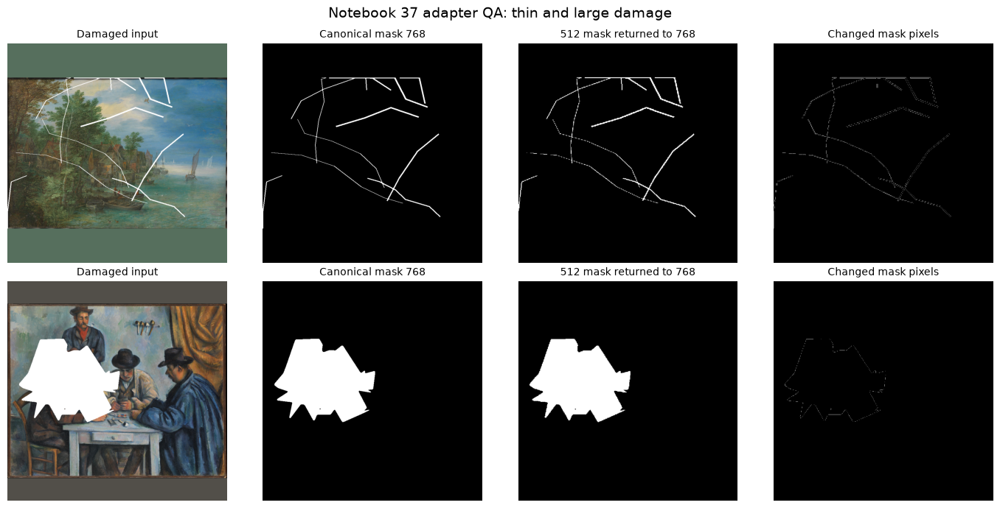

White pixels in the final column show geometry changed by the 512 adapter.
These changes are measured explicitly and do not change the canonical 768 evaluation mask.


In [10]:
representative_adapter_cases = [
    "canonical__p026__scratch_thin",
    "canonical__p043__loss_large",
]

figure, axes = plt.subplots(
    len(representative_adapter_cases),
    4,
    figsize=(14, 7),
)

for row_index, case_id in enumerate(
    representative_adapter_cases
):
    row = SELECTION_SCOPE.loc[
        SELECTION_SCOPE["case_id"].eq(case_id)
    ].iloc[0]

    input_path = PROJECT_ROOT / row["input_image_path"]
    mask_path = PROJECT_ROOT / row["mask_path"]

    with Image.open(input_path) as handle:
        damaged = np.asarray(
            handle.convert("RGB"),
            dtype=np.uint8,
        ).copy()

    (
        _,
        mask_512,
        mask_768,
        _,
    ) = prepare_model_inputs(
        input_path,
        mask_path,
        inference_size=512,
    )

    mask_roundtrip = np.asarray(
        Image.fromarray(
            (mask_512 * 255).astype(np.uint8),
            mode="L",
        ).resize(
            (768, 768),
            Image.Resampling.NEAREST,
        ),
        dtype=np.uint8,
    ) >= 128

    difference = np.logical_xor(
        mask_768.astype(bool),
        mask_roundtrip,
    )

    displays = [
        damaged,
        mask_768,
        mask_roundtrip,
        difference,
    ]
    titles = [
        "Damaged input",
        "Canonical mask 768",
        "512 mask returned to 768",
        "Changed mask pixels",
    ]

    for column_index, (
        display_image,
        title,
    ) in enumerate(zip(displays, titles)):
        axis = axes[row_index, column_index]
        axis.imshow(
            display_image,
            cmap=(
                "gray"
                if display_image.ndim == 2
                else None
            ),
        )
        axis.set_title(title, fontsize=10)
        axis.axis("off")

    axes[row_index, 0].set_ylabel(
        f"{row['painting_id']}\n"
        f"{row['damage_type']}",
        fontsize=10,
    )

figure.suptitle(
    "Notebook 37 adapter QA: thin and large damage",
    fontsize=14,
)
figure.tight_layout()
plt.show()

print(
    "White pixels in the final column show geometry "
    "changed by the 512 adapter."
)
print(
    "These changes are measured explicitly and do not "
    "change the canonical 768 evaluation mask."
)

In [11]:
asset_by_key = (
    EXTERNAL_ASSET_AUDIT
    .set_index("model_key")
    .to_dict(orient="index")
)

static_import_scripts = {
    "hint": (
        "import sys; "
        f"sys.path.insert(0, {asset_by_key['hint']['repository_path']!r}); "
        "from src.networks import HINT; "
        "print(HINT.__name__)"
    ),
    "mat": (
        "import sys; "
        f"sys.path.insert(0, {asset_by_key['mat']['repository_path']!r}); "
        "import legacy; "
        "from networks.mat import Generator; "
        "print(Generator.__name__)"
    ),
}

static_import_rows = []

for model_key, script in static_import_scripts.items():
    environment = dict(os.environ)
    environment["PYTHONDONTWRITEBYTECODE"] = "1"

    completed = subprocess.run(
        [sys.executable, "-c", script],
        cwd=PROJECT_ROOT,
        env=environment,
        capture_output=True,
        text=True,
        timeout=180,
        check=False,
    )

    static_import_rows.append(
        {
            "model_key": model_key,
            "return_code": completed.returncode,
            "stdout": completed.stdout.strip(),
            "stderr": completed.stderr.strip(),
            "passed": completed.returncode == 0,
        }
    )

STATIC_IMPORT_AUDIT = pd.DataFrame(
    static_import_rows
)

VALIDATION.add(
    validation_stage="batch_2_adapter_validation",
    check_id="official_source_static_import",
    check_description=(
        "The official HINT generator and MAT loader "
        "import in isolated Python processes."
    ),
    severity="blocking",
    expected="both return code 0",
    observed=STATIC_IMPORT_AUDIT.to_dict(
        orient="records"
    ),
    passed=bool(
        STATIC_IMPORT_AUDIT["passed"].all()
    ),
)

display(STATIC_IMPORT_AUDIT)

,model_key,return_code,stdout,stderr,passed
0,hint,0,HINT,,True
1,mat,0,Generator,D:\Masters\FH\Thesis\painting-restoration-eval...,True


In [12]:
scratch_smoke_case = (
    SELECTION_SCOPE.loc[
        SELECTION_SCOPE["damage_type"].eq(
            "scratch_thin"
        )
    ]
    .sort_values("selection_rank")
    .iloc[0]["case_id"]
)

large_smoke_case = (
    SELECTION_SCOPE.sort_values(
        [
            "realized_damage_fraction",
            "selection_rank",
        ],
        ascending=[False, True],
    )
    .iloc[0]["case_id"]
)

SMOKE_CASE_IDS = [
    scratch_smoke_case,
    large_smoke_case,
]

SMOKE_PLAN = CANDIDATE_PLAN_CHECKED.loc[
    CANDIDATE_PLAN_CHECKED[
        "case_id"
    ].isin(SMOKE_CASE_IDS)
].copy()

model_key_by_id = {
    CONFIG["models"]["hint"]["model_id"]: "hint",
    CONFIG["models"]["mat"]["model_id"]: "mat",
}

for index, row in SMOKE_PLAN.iterrows():
    model_key = model_key_by_id[row["model_id"]]
    SMOKE_PLAN.at[index, "restored_path"] = (
        "outputs/37_hint_mat_method_selection/"
        f"work/smoke_outputs/{model_key}/"
        f"{row['case_id']}.png"
    )

SMOKE_JOBS = {}

for model_key in ("hint", "mat"):
    (
        payload,
        job_path,
        result_path,
        checkpoint_path,
        progress_path,
    ) = build_worker_job(
        model_key,
        SMOKE_PLAN,
        CONFIG,
        project_root=PROJECT_ROOT,
        output_root=OUTPUT_ROOT,
        job_role="smoke",
    )

    SMOKE_JOBS[model_key] = {
        "payload": payload,
        "job_path": job_path,
        "result_path": result_path,
        "checkpoint_path": checkpoint_path,
        "progress_path": progress_path,
    }

smoke_job_valid = all(
    len(value["payload"]["candidates"]) == 2
    and value["payload"]["job_role"] == "smoke"
    for value in SMOKE_JOBS.values()
)

VALIDATION.add(
    validation_stage="batch_2_adapter_validation",
    check_id="smoke_population",
    check_description=(
        "The smoke design contains one thin-scratch "
        "and one large-damage case for both methods."
    ),
    severity="blocking",
    expected={
        "cases": 2,
        "candidates": 4,
        "damage_types": [
            "scratch_thin",
            "loss_large",
        ],
    },
    observed={
        "cases": SMOKE_CASE_IDS,
        "candidates": len(SMOKE_PLAN),
        "damage_types": sorted(
            SMOKE_PLAN["damage_type"].unique()
        ),
    },
    passed=bool(
        len(SMOKE_CASE_IDS) == 2
        and len(SMOKE_PLAN) == 4
        and set(
            SMOKE_PLAN["damage_type"]
        ) == {
            "scratch_thin",
            "loss_large",
        }
    ),
)

VALIDATION.add(
    validation_stage="batch_2_adapter_validation",
    check_id="smoke_worker_jobs",
    check_description=(
        "Both isolated smoke-worker jobs serialize "
        "the exact two-case population."
    ),
    severity="blocking",
    expected="two valid jobs with two candidates each",
    observed={
        key: {
            "job_path": str(
                value["job_path"].relative_to(
                    PROJECT_ROOT
                )
            ),
            "candidate_count": len(
                value["payload"]["candidates"]
            ),
        }
        for key, value in SMOKE_JOBS.items()
    },
    passed=smoke_job_valid,
)

display(
    SMOKE_PLAN[
        [
            "case_id",
            "painting_id",
            "damage_type",
            "model_label",
            "inference_width",
            "adapter_policy",
            "restored_path",
        ]
    ].sort_values(
        ["case_id", "model_label"]
    )
)

print("Smoke cases:", SMOKE_CASE_IDS)
print(
    "Smoke jobs:",
    {
        key: str(
            value["job_path"].relative_to(
                PROJECT_ROOT
            )
        )
        for key, value in SMOKE_JOBS.items()
    },
)

,case_id,painting_id,damage_type,model_label,inference_width,adapter_policy,restored_path
4,canonical__p026__scratch_thin,p026,scratch_thin,HINT,768,native_768_then_512_resize_adapter_if_required.v1,outputs/37_hint_mat_method_selection/work/smok...
16,canonical__p026__scratch_thin,p026,scratch_thin,MAT,512,resize_768_to_512_then_restore_and_exact_compo...,outputs/37_hint_mat_method_selection/work/smok...
11,canonical__p043__loss_large,p043,loss_large,HINT,768,native_768_then_512_resize_adapter_if_required.v1,outputs/37_hint_mat_method_selection/work/smok...
23,canonical__p043__loss_large,p043,loss_large,MAT,512,resize_768_to_512_then_restore_and_exact_compo...,outputs/37_hint_mat_method_selection/work/smok...


Smoke cases: ['canonical__p026__scratch_thin', 'canonical__p043__loss_large']
Smoke jobs: {'hint': 'outputs\\37_hint_mat_method_selection\\work\\hint\\smoke\\job.json', 'mat': 'outputs\\37_hint_mat_method_selection\\work\\mat\\smoke\\job.json'}


In [13]:
batch_2_required_files = [
    SELECTION_SCOPE_PATH,
    PLANNED_CANDIDATES_PATH,
    OUTPUT_ROOT / "work" / "input_audit.csv",
    ADAPTER_AUDIT_PATH,
    SMOKE_JOBS["hint"]["job_path"],
    SMOKE_JOBS["mat"]["job_path"],
]

missing_batch_2_files = [
    str(path.relative_to(PROJECT_ROOT))
    for path in batch_2_required_files
    if not path.is_file()
]

VALIDATION.add(
    validation_stage="batch_2_adapter_validation",
    check_id="batch_2_persistence",
    check_description=(
        "All Batch 2 scope, audit, and smoke-job "
        "files were persisted."
    ),
    severity="blocking",
    expected="all six required files present",
    observed={
        "required": len(batch_2_required_files),
        "missing": missing_batch_2_files,
    },
    passed=not missing_batch_2_files,
)

COMBINED_PREFLIGHT_PATH = (
    OUTPUT_ROOT
    / "work"
    / "batch_1_2_validation_checks.csv"
)

COMBINED_CHECKS = VALIDATION.to_dataframe()
atomic_write_csv(
    COMBINED_CHECKS,
    COMBINED_PREFLIGHT_PATH,
)

BATCH_2_CHECKS = COMBINED_CHECKS.loc[
    COMBINED_CHECKS["validation_stage"].eq(
        "batch_2_adapter_validation"
    )
].reset_index(drop=True)

BATCH_2_FAILED = BATCH_2_CHECKS.loc[
    (~BATCH_2_CHECKS["passed"])
    & BATCH_2_CHECKS["severity"].isin(
        ["error", "blocking"]
    )
]

BATCH_2_PASSED = BATCH_2_FAILED.empty

display(BATCH_2_CHECKS)

print("Batch 2 checks:", len(BATCH_2_CHECKS))
print(
    "Batch 2 passed:",
    int(BATCH_2_CHECKS["passed"].sum()),
)
print(
    "Batch 2 blocking/error failures:",
    len(BATCH_2_FAILED),
)
print(
    "Combined validation table:",
    COMBINED_PREFLIGHT_PATH.relative_to(
        PROJECT_ROOT
    ),
)

if BATCH_2_PASSED:
    print(
        "BATCH 2 PASSED — population, source files, "
        "adapters, mask semantics, compositing, and "
        "smoke jobs are ready."
    )
else:
    print(
        "BATCH 2 FAILED — do not execute either model."
    )
    display(BATCH_2_FAILED)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_2_adapter_validation,candidate_checksums,"Every candidate records full input, clean, mas...",blocking,64-character SHA-256 values,"{""checkpoint_sha256"": true, ""clean_sha256"": tr...",True,
1,batch_2_adapter_validation,checked_candidate_schema,The checksummed candidate plan still satisfies...,blocking,schema passed,"{""column_count"": 55, ""duplicate_primary_key_ro...",True,
2,batch_2_adapter_validation,source_image_geometry,Every selected damaged and clean image is a 76...,blocking,12 valid damaged and clean pairs,"{""clean_valid"": 12, ""input_valid"": 12}",True,
3,batch_2_adapter_validation,canonical_binary_masks,"Every comparison mask is nonempty, binary, and...",blocking,12 valid canonical masks,"{""total"": 12, ""valid"": 12}",True,
4,batch_2_adapter_validation,zero_control_identity,The QA-only zero control has an unchanged inpu...,blocking,"{""input_matches_clean"": true, ""nonzero_mask_pi...","{""case_id"": ""canonical__p001__zero_control"", ""...",True,
5,batch_2_adapter_validation,hint_native_768_adapter,HINT's native 768 representation preserves the...,blocking,12 exact masks,12,True,
6,batch_2_adapter_validation,mat_mask_semantics,MAT's 512 mask is the exact complement of the ...,blocking,12 exact complements,12,True,
7,batch_2_adapter_validation,mask_roundtrip_fidelity,The 512 adapter retains sufficient mask overla...,blocking,"{""maximum_area_error"": 0.05, ""other_damage_min...","{""maximum_area_error"": 0.0218848167539267, ""mi...",True,
8,batch_2_adapter_validation,exact_compositing_probe,Synthetic adapter probes alter no pixels outsi...,blocking,0,0,True,
9,batch_2_adapter_validation,official_source_static_import,The official HINT generator and MAT loader imp...,blocking,both return code 0,"[{""model_key"": ""hint"", ""passed"": true, ""return...",True,


Batch 2 checks: 13
Batch 2 passed: 13
Batch 2 blocking/error failures: 0
Combined validation table: outputs\37_hint_mat_method_selection\work\batch_1_2_validation_checks.csv
BATCH 2 PASSED — population, source files, adapters, mask semantics, compositing, and smoke jobs are ready.


## Batch 3 — Two-case paired smoke test

This batch:

- runs HINT and MAT in isolated Python workers;
- evaluates one thin-scratch case and one large-loss case;
- applies the declared hard worker timeout;
- records HINT's actual 768 or fallback 512 resolution;
- records MAT's required 512 resolution;
- validates checkpoint loading, output geometry, and exact compositing;
- preserves worker logs and checkpoints under `work/`;
- renders full-image and local-detail comparisons;
- creates the canonical smoke-comparison figure.

Smoke outputs remain diagnostic working artifacts. They are not included in the final twenty-four-candidate comparison table.

In [14]:
from restoration_eval.hint_mat_selection import (
    run_worker_process,
    validate_restored_output,
    worker_command,
)

if not BATCH_2_PASSED:
    raise RuntimeError(
        "Batch 2 did not pass. Do not execute model workers."
    )

WORKER_ENVIRONMENT = dict(os.environ)
existing_pythonpath = WORKER_ENVIRONMENT.get(
    "PYTHONPATH",
    "",
)

WORKER_ENVIRONMENT["PYTHONPATH"] = (
    str(SRC_ROOT)
    + (
        os.pathsep + existing_pythonpath
        if existing_pythonpath
        else ""
    )
)
WORKER_ENVIRONMENT["PYTHONDONTWRITEBYTECODE"] = "1"
WORKER_ENVIRONMENT["PYTHONHASHSEED"] = str(
    CONFIG["models"]["hint"]["seed"]
)

SMOKE_TIMEOUT_SECONDS = min(
    float(
        CONFIG["execution"]["full_model_budget_seconds"]
    ),
    float(
        CONFIG["execution"]["model_load_timeout_seconds"]
    )
    + (
        float(
            CONFIG["execution"]["per_case_timeout_seconds"]
        )
        * int(
            CONFIG["execution"]["smoke_case_count"]
        )
    ),
)


def clear_stale_smoke_results(model_key):
    job = SMOKE_JOBS[model_key]

    for key in (
        "result_path",
        "checkpoint_path",
        "progress_path",
    ):
        Path(job[key]).unlink(missing_ok=True)

    for candidate in job["payload"]["candidates"]:
        Path(candidate["restored_path"]).unlink(
            missing_ok=True
        )


def execute_smoke_worker(model_key):
    clear_stale_smoke_results(model_key)

    command = worker_command(
        model_key,
        SMOKE_JOBS[model_key]["job_path"],
    )

    return run_worker_process(
        command,
        timeout_seconds=SMOKE_TIMEOUT_SECONDS,
        cwd=PROJECT_ROOT,
        environment=WORKER_ENVIRONMENT,
    )


print(
    "Smoke-worker timeout:",
    round(SMOKE_TIMEOUT_SECONDS / 60, 1),
    "minutes per method",
)
print("Worker Python:", sys.executable)
print("Smoke cases:", SMOKE_CASE_IDS)

Smoke-worker timeout: 45.0 minutes per method
Worker Python: D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Scripts\python.exe
Smoke cases: ['canonical__p026__scratch_thin', 'canonical__p043__loss_large']


In [15]:
print("Starting isolated HINT smoke worker...")

HINT_SMOKE_PROCESS = execute_smoke_worker("hint")

print(
    "HINT return code:",
    HINT_SMOKE_PROCESS.return_code,
)
print(
    "HINT timed out:",
    HINT_SMOKE_PROCESS.timed_out,
)
print(
    "HINT worker runtime:",
    HINT_SMOKE_PROCESS.runtime_seconds,
    "seconds",
)

if HINT_SMOKE_PROCESS.stdout.strip():
    print("\nHINT worker output:")
    print(HINT_SMOKE_PROCESS.stdout.strip())

if HINT_SMOKE_PROCESS.stderr.strip():
    print("\nHINT worker diagnostics:")
    print(HINT_SMOKE_PROCESS.stderr.strip())

Starting isolated HINT smoke worker...
HINT return code: 0
HINT timed out: False
HINT worker runtime: 41.478 seconds

HINT worker output:
HINT progress 1/2: canonical__p026__scratch_thin -> completed
HINT progress 2/2: canonical__p043__loss_large -> completed
{"result_schema_version": "hint_mat_worker_result.v1", "worker_version": "1.0.2", "model_key": "hint", "model_load_audit": {"model_load_seconds": 3.21, "matched_state_keys": 973, "model_state_key_count": 973, "missing_state_keys": 0, "unexpected_state_keys": 153, "all_required_state_keys_loaded": true, "required_state_coverage": 1.0, "loading_policy": "official_strict_false"}, "native_probe_size": 768, "actual_inference_size": 768, "fallback_reason": "", "runtime_seconds": 25.34, "completed_rows": 2, "successful_rows": 2, "resumed_rows": 0, "status": "completed", "completed_at_utc": "2026-09-06T01:17:37.772804Z"}


In [16]:
print("Starting isolated MAT smoke worker...")

MAT_SMOKE_PROCESS = execute_smoke_worker("mat")

print(
    "MAT return code:",
    MAT_SMOKE_PROCESS.return_code,
)
print(
    "MAT timed out:",
    MAT_SMOKE_PROCESS.timed_out,
)
print(
    "MAT worker runtime:",
    MAT_SMOKE_PROCESS.runtime_seconds,
    "seconds",
)

if MAT_SMOKE_PROCESS.stdout.strip():
    print("\nMAT worker output:")
    print(MAT_SMOKE_PROCESS.stdout.strip())

if MAT_SMOKE_PROCESS.stderr.strip():
    print("\nMAT worker diagnostics:")
    print(MAT_SMOKE_PROCESS.stderr.strip())

Starting isolated MAT smoke worker...
MAT return code: 0
MAT timed out: False
MAT worker runtime: 54.059 seconds

MAT worker output:
MAT progress 1/2: canonical__p026__scratch_thin -> completed
MAT progress 2/2: canonical__p043__loss_large -> completed
{"result_schema_version": "hint_mat_worker_result.v1", "worker_version": "1.0.2", "model_key": "mat", "model_load_seconds": 13.763, "actual_inference_size": 512, "runtime_seconds": 21.08, "completed_rows": 2, "successful_rows": 2, "resumed_rows": 0, "optional_extension_fallback_cases": 2, "captured_diagnostic_lines": 828, "status": "completed", "completed_at_utc": "2026-09-06T01:18:31.589047Z"}

MAT worker diagnostics:
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\timm\models\layers\__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


In [17]:
SMOKE_PROCESS_RESULTS = {
    "hint": HINT_SMOKE_PROCESS,
    "mat": MAT_SMOKE_PROCESS,
}

SMOKE_RESULT_BY_MODEL = {}
smoke_candidate_frames = []
smoke_process_rows = []

for model_key in ("hint", "mat"):
    job = SMOKE_JOBS[model_key]
    process_result = SMOKE_PROCESS_RESULTS[model_key]

    if job["result_path"].is_file():
        with job["result_path"].open(
            "r",
            encoding="utf-8-sig",
        ) as handle:
            result_payload = json.load(handle)
    else:
        result_payload = {}

    SMOKE_RESULT_BY_MODEL[model_key] = result_payload

    if job["checkpoint_path"].is_file():
        candidate_frame = pd.read_csv(
            job["checkpoint_path"]
        )
        candidate_frame = candidate_frame.reindex(
            columns=CANDIDATE_COLUMNS
        )
        candidate_frame["worker_return_code"] = (
            process_result.return_code
        )
        smoke_candidate_frames.append(candidate_frame)

    smoke_process_rows.append(
        {
            "model_key": model_key,
            "timed_out": process_result.timed_out,
            "return_code": process_result.return_code,
            "runtime_seconds": (
                process_result.runtime_seconds
            ),
            "result_status": result_payload.get(
                "status",
                "missing",
            ),
            "completed_rows": result_payload.get(
                "completed_rows",
                0,
            ),
            "successful_rows": result_payload.get(
                "successful_rows",
                0,
            ),
            "actual_inference_size": result_payload.get(
                "actual_inference_size"
            ),
            "fallback_reason": result_payload.get(
                "fallback_reason",
                "",
            ),
            "stdout": process_result.stdout,
            "stderr": process_result.stderr,
        }
    )

SMOKE_PROCESS_AUDIT = pd.DataFrame(
    smoke_process_rows
)

if smoke_candidate_frames:
    SMOKE_CANDIDATES = pd.concat(
        smoke_candidate_frames,
        ignore_index=True,
    ).reindex(columns=CANDIDATE_COLUMNS)
else:
    SMOKE_CANDIDATES = pd.DataFrame(
        columns=CANDIDATE_COLUMNS
    )

technical_rows = []

for row in SMOKE_CANDIDATES.itertuples(index=False):
    restored_path = Path(str(row.restored_path))
    input_path = Path(str(row.input_image_path))
    mask_path = Path(str(row.mask_path))

    if restored_path.is_file():
        technical = validate_restored_output(
            restored_path,
            input_path,
            mask_path,
        )
    else:
        technical = {
            "output_geometry_valid": False,
            "outside_mask_changed_pixels": None,
            "technical_validation_passed": False,
        }

    technical_rows.append(
        {
            "candidate_id": row.candidate_id,
            "case_id": row.case_id,
            "model_id": row.model_id,
            "restored_path": str(restored_path),
            "output_exists": restored_path.is_file(),
            **technical,
        }
    )

SMOKE_TECHNICAL_AUDIT = pd.DataFrame(
    technical_rows,
    columns=[
        "candidate_id",
        "case_id",
        "model_id",
        "restored_path",
        "output_exists",
        "output_geometry_valid",
        "outside_mask_changed_pixels",
        "technical_validation_passed",
    ],
)

display(SMOKE_PROCESS_AUDIT)
display(
    SMOKE_CANDIDATES[
        [
            "case_id",
            "model_label",
            "status",
            "inference_width",
            "output_width",
            "output_height",
            "model_load_seconds",
            "inference_seconds",
            "runtime_seconds",
            "gpu_peak_memory_bytes",
            "generator_name",
            "issue",
        ]
    ]
)
display(SMOKE_TECHNICAL_AUDIT)

,model_key,timed_out,return_code,runtime_seconds,result_status,completed_rows,successful_rows,actual_inference_size,fallback_reason,stdout,stderr
0,hint,False,0,41.478,completed,2,2,768,,HINT progress 1/2: canonical__p026__scratch_th...,
1,mat,False,0,54.059,completed,2,2,512,,MAT progress 1/2: canonical__p026__scratch_thi...,D:\Masters\FH\Thesis\painting-restoration-eval...


,case_id,model_label,status,inference_width,output_width,output_height,model_load_seconds,inference_seconds,runtime_seconds,gpu_peak_memory_bytes,generator_name,issue
0,canonical__p026__scratch_thin,HINT,completed,768,768,768,3.210,17.509,17.892,5432973312,HINT,NaN
1,canonical__p043__loss_large,HINT,completed,768,768,768,0.000,6.941,7.412,5432973312,HINT,NaN
2,canonical__p026__scratch_thin,MAT,completed,512,768,768,13.763,13.992,14.385,1324408832,Generator,optional_cuda_extension_build_failed_pytorch_f...
3,canonical__p043__loss_large,MAT,completed,512,768,768,0.000,6.151,6.659,1324408832,Generator,optional_cuda_extension_build_failed_pytorch_f...


,candidate_id,case_id,model_id,restored_path,output_exists,output_geometry_valid,outside_mask_changed_pixels,technical_validation_passed
0,n37__hint_places2__526affa2a1d8,canonical__p026__scratch_thin,hint_places2,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
1,n37__hint_places2__18590ce912a0,canonical__p043__loss_large,hint_places2,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
2,n37__mat_places_512_fulldata__68e7ce0f1a08,canonical__p026__scratch_thin,mat_places_512_fulldata,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
3,n37__mat_places_512_fulldata__38d9e28b9221,canonical__p043__loss_large,mat_places_512_fulldata,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True


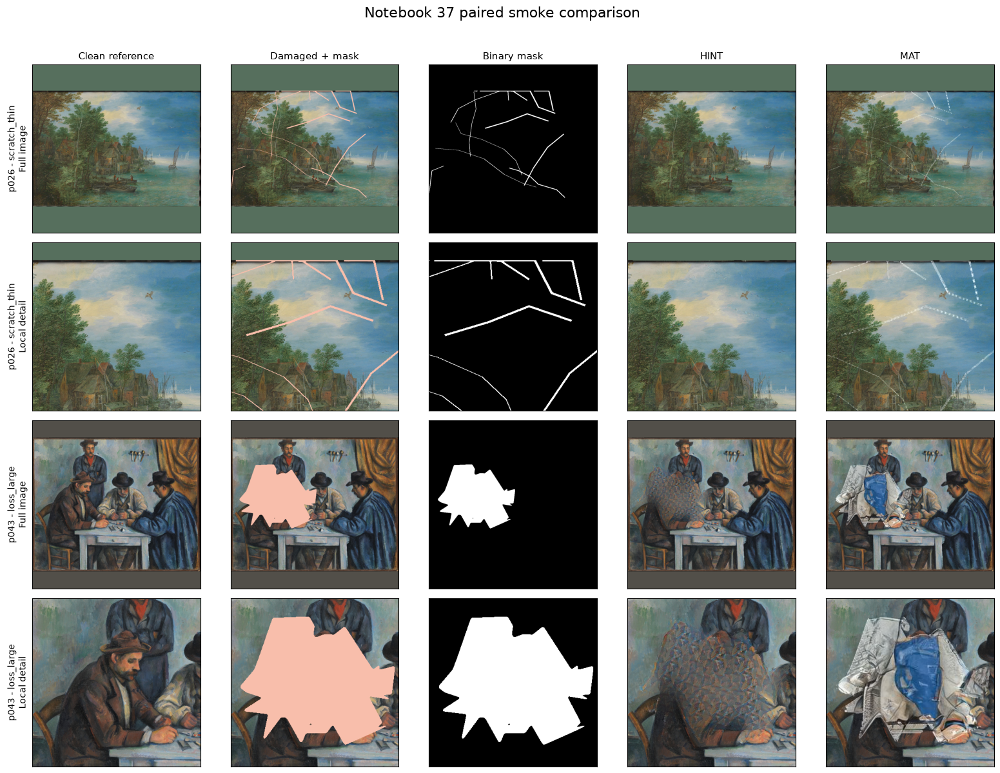

Smoke figure: outputs\37_hint_mat_method_selection\figures\smoke_comparison.png
HINT actual inference size: 768
HINT fallback reason: none
MAT actual inference size: 512


In [18]:
def resolve_repository_path(value):
    path = Path(str(value))
    if path.is_absolute():
        return path
    return PROJECT_ROOT / path


def load_rgb_array(path):
    with Image.open(path) as handle:
        return np.asarray(
            handle.convert("RGB"),
            dtype=np.uint8,
        ).copy()


def focus_slices(mask, crop_size=384):
    coordinates = np.argwhere(mask)

    if len(coordinates) == 0:
        return slice(None), slice(None)

    center_y, center_x = np.median(
        coordinates,
        axis=0,
    ).astype(int)

    height, width = mask.shape
    crop_height = min(crop_size, height)
    crop_width = min(crop_size, width)

    y0 = max(
        0,
        min(
            center_y - crop_height // 2,
            height - crop_height,
        ),
    )
    x0 = max(
        0,
        min(
            center_x - crop_width // 2,
            width - crop_width,
        ),
    )

    return (
        slice(y0, y0 + crop_height),
        slice(x0, x0 + crop_width),
    )


scope_by_case = SELECTION_SCOPE.set_index("case_id")
model_ids = {
    key: CONFIG["models"][key]["model_id"]
    for key in ("hint", "mat")
}

figure, axes = plt.subplots(
    nrows=len(SMOKE_CASE_IDS) * 2,
    ncols=5,
    figsize=(16, 12),
)

column_titles = [
    "Clean reference",
    "Damaged + mask",
    "Binary mask",
    "HINT",
    "MAT",
]

for case_number, case_id in enumerate(SMOKE_CASE_IDS):
    scope_row = scope_by_case.loc[case_id]

    clean = load_rgb_array(
        resolve_repository_path(
            scope_row["clean_image_path"]
        )
    )
    damaged = load_rgb_array(
        resolve_repository_path(
            scope_row["input_image_path"]
        )
    )

    with Image.open(
        resolve_repository_path(
            scope_row["mask_path"]
        )
    ) as handle:
        missing = (
            np.asarray(
                handle.convert("L"),
                dtype=np.uint8,
            )
            >= 128
        )

    overlay = damaged.copy()
    overlay_colour = np.array(
        [238, 100, 55],
        dtype=np.float32,
    )
    overlay[missing] = (
        0.58 * damaged[missing].astype(np.float32)
        + 0.42 * overlay_colour
    ).round().clip(0, 255).astype(np.uint8)

    restored_images = {}

    for model_key in ("hint", "mat"):
        matching = SMOKE_CANDIDATES.loc[
            SMOKE_CANDIDATES["case_id"].eq(case_id)
            & SMOKE_CANDIDATES["model_id"].eq(
                model_ids[model_key]
            )
        ]

        if matching.empty:
            restored_images[model_key] = None
            continue

        restored_path = Path(
            str(matching.iloc[0]["restored_path"])
        )

        restored_images[model_key] = (
            load_rgb_array(restored_path)
            if restored_path.is_file()
            else None
        )

    panels = [
        clean,
        overlay,
        missing.astype(np.uint8) * 255,
        restored_images["hint"],
        restored_images["mat"],
    ]

    focus_y, focus_x = focus_slices(missing)

    for view_offset, view_name in enumerate(
        ("Full image", "Local detail")
    ):
        row_index = case_number * 2 + view_offset

        for column_index, panel in enumerate(panels):
            axis = axes[row_index, column_index]
            axis.set_xticks([])
            axis.set_yticks([])

            if panel is None:
                axis.set_facecolor("#ece7dc")
                axis.text(
                    0.5,
                    0.5,
                    "Unavailable",
                    ha="center",
                    va="center",
                    transform=axis.transAxes,
                )
            else:
                shown = (
                    panel
                    if view_offset == 0
                    else panel[focus_y, focus_x]
                )

                if panel.ndim == 2:
                    axis.imshow(
                        shown,
                        cmap="gray",
                        vmin=0,
                        vmax=255,
                    )
                else:
                    axis.imshow(shown)

            if row_index == 0:
                axis.set_title(
                    column_titles[column_index],
                    fontsize=11,
                )

        axes[row_index, 0].set_ylabel(
            (
                f"{scope_row['painting_id']} - "
                f"{scope_row['damage_type']}\n"
                f"{view_name}"
            ),
            fontsize=10,
        )

figure.suptitle(
    "Notebook 37 paired smoke comparison",
    fontsize=16,
    y=0.995,
)
figure.tight_layout(rect=(0, 0, 1, 0.98))

SMOKE_FIGURE_PATH = (
    OUTPUT_ROOT
    / CONFIG["output"]["smoke_figure_path"]
)

figure.savefig(
    SMOKE_FIGURE_PATH,
    dpi=180,
    bbox_inches="tight",
    facecolor="#f7f2e8",
)

display(figure)
plt.close(figure)

print(
    "Smoke figure:",
    SMOKE_FIGURE_PATH.relative_to(PROJECT_ROOT),
)
print(
    "HINT actual inference size:",
    SMOKE_RESULT_BY_MODEL["hint"].get(
        "actual_inference_size"
    ),
)
print(
    "HINT fallback reason:",
    SMOKE_RESULT_BY_MODEL["hint"].get(
        "fallback_reason"
    )
    or "none",
)
print(
    "MAT actual inference size:",
    SMOKE_RESULT_BY_MODEL["mat"].get(
        "actual_inference_size"
    ),
)

In [19]:
# Remove earlier Batch 3 checks so this gate is safely rerunnable.
existing_validation = VALIDATION.to_dataframe()

VALIDATION = ValidationCollector()

for row in existing_validation.loc[
    ~existing_validation["validation_stage"].eq(
        "batch_3_smoke_test"
    )
].itertuples(index=False):
    VALIDATION.add(
        validation_stage=row.validation_stage,
        check_id=row.check_id,
        check_description=row.check_description,
        severity=row.severity,
        expected=row.expected,
        observed=row.observed,
        passed=bool(row.passed),
        details=row.details,
    )

SMOKE_PROCESS_AUDIT_PATH = (
    OUTPUT_ROOT / "work" / "smoke_process_audit.csv"
)
SMOKE_CANDIDATES_PATH = (
    OUTPUT_ROOT / "work" / "smoke_candidates.csv"
)
SMOKE_TECHNICAL_AUDIT_PATH = (
    OUTPUT_ROOT / "work" / "smoke_technical_audit.csv"
)

atomic_write_csv(
    SMOKE_PROCESS_AUDIT,
    SMOKE_PROCESS_AUDIT_PATH,
)
atomic_write_csv(
    SMOKE_CANDIDATES,
    SMOKE_CANDIDATES_PATH,
)
atomic_write_csv(
    SMOKE_TECHNICAL_AUDIT,
    SMOKE_TECHNICAL_AUDIT_PATH,
)

smoke_schema_result = validate_dataframe(
    SMOKE_CANDIDATES,
    get_schema("hint_mat_candidates"),
)

expected_smoke_ids = set(
    SMOKE_PLAN["candidate_id"].astype(str)
)
observed_smoke_ids = set(
    SMOKE_CANDIDATES["candidate_id"].astype(str)
)

hint_load_audit = (
    SMOKE_RESULT_BY_MODEL["hint"]
    .get("model_load_audit", {})
)

hint_checkpoint_load_passed = bool(
    int(hint_load_audit.get("matched_state_keys", 0)) > 0
    and int(hint_load_audit.get("missing_state_keys", -1)) == 0
)

hint_ignored_checkpoint_keys = int(
    hint_load_audit.get("unexpected_state_keys", 0)
)

mat_extension_fallback_used = bool(
    int(
        SMOKE_RESULT_BY_MODEL["mat"].get(
            "optional_extension_fallback_cases",
            0,
        )
    )
    > 0
    or 'plugin "bias_act_plugin"... Failed!'
    in MAT_SMOKE_PROCESS.stdout
    or 'plugin "upfirdn2d_plugin"... Failed!'
    in MAT_SMOKE_PROCESS.stdout
)

SMOKE_MODEL_READINESS = {}

for model_key in ("hint", "mat"):
    model_id = CONFIG["models"][model_key]["model_id"]
    process = SMOKE_PROCESS_RESULTS[model_key]
    result = SMOKE_RESULT_BY_MODEL[model_key]

    model_candidates = SMOKE_CANDIDATES.loc[
        SMOKE_CANDIDATES["model_id"].eq(model_id)
    ]

    model_technical = SMOKE_TECHNICAL_AUDIT.loc[
        SMOKE_TECHNICAL_AUDIT["model_id"].eq(
            model_id
        )
    ]

    process_passed = bool(
        not process.timed_out
        and process.return_code == 0
        and result.get("status") == "completed"
    )

    candidates_passed = bool(
        len(model_candidates) == 2
        and model_candidates["status"]
        .astype(str)
        .eq("completed")
        .all()
    )

    technical_passed = bool(
        len(model_technical) == 2
        and model_technical[
            "technical_validation_passed"
        ]
        .astype(str)
        .str.lower()
        .eq("true")
        .all()
    )

    if model_key == "hint":
        checkpoint_load_passed = (
            hint_checkpoint_load_passed
        )
    else:
        checkpoint_load_passed = bool(
            len(model_candidates) == 2
            and model_candidates["generator_name"]
            .astype(str)
            .eq("Generator")
            .all()
        )

    SMOKE_MODEL_READINESS[model_key] = {
        "process_passed": process_passed,
        "candidate_count": len(model_candidates),
        "candidates_passed": candidates_passed,
        "technical_passed": technical_passed,
        "checkpoint_load_passed": (
            checkpoint_load_passed
        ),
        "actual_inference_size": result.get(
            "actual_inference_size"
        ),
        "fallback_reason": result.get(
            "fallback_reason",
            "",
        ),
        "runtime_seconds": process.runtime_seconds,
        "optional_cuda_extension_fallback": (
            mat_extension_fallback_used
            if model_key == "mat"
            else False
        ),
        "ready_for_full_execution": bool(
            process_passed
            and candidates_passed
            and technical_passed
            and checkpoint_load_passed
        ),
    }

hint_size = SMOKE_RESULT_BY_MODEL["hint"].get(
    "actual_inference_size"
)
hint_fallback = SMOKE_RESULT_BY_MODEL["hint"].get(
    "fallback_reason",
    "",
)
mat_size = SMOKE_RESULT_BY_MODEL["mat"].get(
    "actual_inference_size"
)

adapter_decision_passed = bool(
    hint_size in {512, 768}
    and (
        hint_size == 768
        or bool(hint_fallback)
    )
    and mat_size == 512
)


def add_smoke_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_3_smoke_test",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


add_smoke_check(
    check_id="isolated_worker_completion",
    description=(
        "Both isolated workers complete without "
        "timeout or nonzero return status."
    ),
    expected="HINT and MAT completed",
    observed=SMOKE_MODEL_READINESS,
    passed=all(
        row["process_passed"]
        for row in SMOKE_MODEL_READINESS.values()
    ),
)

add_smoke_check(
    check_id="official_checkpoint_runtime_load",
    description=(
        "Every required generator parameter loads "
        "from the declared official checkpoint."
    ),
    expected={
        "hint_missing_required_keys": 0,
        "mat_generator": "Generator",
    },
    observed={
        "hint_matched_state_keys": int(
            hint_load_audit.get(
                "matched_state_keys",
                0,
            )
        ),
        "hint_missing_state_keys": int(
            hint_load_audit.get(
                "missing_state_keys",
                -1,
            )
        ),
        "hint_additional_ignored_keys": (
            hint_ignored_checkpoint_keys
        ),
        "mat_generator_names": sorted(
            SMOKE_CANDIDATES.loc[
                SMOKE_CANDIDATES["model_id"].eq(
                    CONFIG["models"]["mat"]["model_id"]
                ),
                "generator_name",
            ]
            .astype(str)
            .unique()
            .tolist()
        ),
    },
    passed=all(
        row["checkpoint_load_passed"]
        for row in SMOKE_MODEL_READINESS.values()
    ),
)

add_smoke_check(
    check_id="hint_additional_checkpoint_keys",
    description=(
        "Additional HINT checkpoint keys ignored by "
        "the official strict=False loading policy "
        "are recorded separately from missing keys."
    ),
    expected=(
        "all required keys loaded; additional keys "
        "may be ignored"
    ),
    observed={
        "matched_required_keys": int(
            hint_load_audit.get(
                "matched_state_keys",
                0,
            )
        ),
        "missing_required_keys": int(
            hint_load_audit.get(
                "missing_state_keys",
                -1,
            )
        ),
        "additional_ignored_keys": (
            hint_ignored_checkpoint_keys
        ),
    },
    passed=hint_checkpoint_load_passed,
    severity="info",
)

add_smoke_check(
    check_id="mat_extension_fallback_recorded",
    description=(
        "MAT's optional compiled CUDA-extension "
        "fallback status is recorded for runtime "
        "interpretation."
    ),
    expected="fallback status recorded",
    observed={
        "pytorch_reference_fallback_used": (
            mat_extension_fallback_used
        ),
        "worker_completed": (
            SMOKE_MODEL_READINESS["mat"][
                "process_passed"
            ]
        ),
    },
    passed=True,
    severity="info",
)

add_smoke_check(
    check_id="smoke_candidate_schema",
    description=(
        "The four smoke candidates satisfy the "
        "normalized candidate schema."
    ),
    expected="schema passed",
    observed=smoke_schema_result.to_dict(),
    passed=smoke_schema_result.passed,
)

add_smoke_check(
    check_id="paired_smoke_population",
    description=(
        "Exactly the four predeclared paired smoke "
        "candidates completed."
    ),
    expected={
        "rows": 4,
        "candidate_ids": sorted(expected_smoke_ids),
    },
    observed={
        "rows": len(SMOKE_CANDIDATES),
        "candidate_ids": sorted(observed_smoke_ids),
    },
    passed=bool(
        len(SMOKE_CANDIDATES) == 4
        and observed_smoke_ids == expected_smoke_ids
        and SMOKE_CANDIDATES["status"]
        .astype(str)
        .eq("completed")
        .all()
    ),
)

add_smoke_check(
    check_id="smoke_output_integrity",
    description=(
        "Every smoke output is 768 x 768 RGB and "
        "preserves every outside-mask pixel."
    ),
    expected={
        "technical_passes": 4,
        "outside_mask_changed_pixels": 0,
    },
    observed=SMOKE_TECHNICAL_AUDIT.to_dict(
        orient="records"
    ),
    passed=bool(
        len(SMOKE_TECHNICAL_AUDIT) == 4
        and SMOKE_TECHNICAL_AUDIT[
            "technical_validation_passed"
        ]
        .astype(str)
        .str.lower()
        .eq("true")
        .all()
    ),
)

add_smoke_check(
    check_id="adapter_resolution_recorded",
    description=(
        "HINT records its native or fallback size, "
        "while MAT records its required 512 adapter."
    ),
    expected={
        "hint": "768 or explained 512 fallback",
        "mat": 512,
    },
    observed={
        "hint": hint_size,
        "hint_fallback_reason": hint_fallback,
        "mat": mat_size,
    },
    passed=adapter_decision_passed,
)

add_smoke_check(
    check_id="smoke_visualization",
    description=(
        "The canonical full-image and local-detail "
        "smoke comparison was rendered."
    ),
    expected="nonempty PNG",
    observed={
        "path": str(
            SMOKE_FIGURE_PATH.relative_to(
                PROJECT_ROOT
            )
        ),
        "size_bytes": (
            SMOKE_FIGURE_PATH.stat().st_size
            if SMOKE_FIGURE_PATH.is_file()
            else 0
        ),
    },
    passed=bool(
        SMOKE_FIGURE_PATH.is_file()
        and SMOKE_FIGURE_PATH.stat().st_size > 0
    ),
)

required_smoke_files = [
    SMOKE_PROCESS_AUDIT_PATH,
    SMOKE_CANDIDATES_PATH,
    SMOKE_TECHNICAL_AUDIT_PATH,
    SMOKE_FIGURE_PATH,
]

for model_key in ("hint", "mat"):
    required_smoke_files.extend(
        [
            SMOKE_JOBS[model_key]["result_path"],
            SMOKE_JOBS[model_key]["checkpoint_path"],
            SMOKE_JOBS[model_key]["progress_path"],
        ]
    )

missing_smoke_files = [
    str(path.relative_to(PROJECT_ROOT))
    for path in required_smoke_files
    if not path.is_file()
]

add_smoke_check(
    check_id="smoke_persistence",
    description=(
        "Worker results, checkpoints, progress "
        "records, audits, and figure were persisted."
    ),
    expected="all required smoke artifacts present",
    observed={
        "required": len(required_smoke_files),
        "missing": missing_smoke_files,
    },
    passed=not missing_smoke_files,
)

BATCH_1_3_CHECKS_PATH = (
    OUTPUT_ROOT
    / "work"
    / "batch_1_3_validation_checks.csv"
)

BATCH_1_3_CHECKS = VALIDATION.to_dataframe()

atomic_write_csv(
    BATCH_1_3_CHECKS,
    BATCH_1_3_CHECKS_PATH,
)

BATCH_3_CHECKS = BATCH_1_3_CHECKS.loc[
    BATCH_1_3_CHECKS["validation_stage"].eq(
        "batch_3_smoke_test"
    )
].reset_index(drop=True)

BATCH_3_FAILED = BATCH_3_CHECKS.loc[
    (~BATCH_3_CHECKS["passed"])
    & BATCH_3_CHECKS["severity"].isin(
        ["error", "blocking"]
    )
]

BATCH_3_PASSED = BATCH_3_FAILED.empty

display(pd.DataFrame(SMOKE_MODEL_READINESS).T)
display(BATCH_3_CHECKS)

print("Batch 3 checks:", len(BATCH_3_CHECKS))
print(
    "Batch 3 blocking/error failures:",
    len(BATCH_3_FAILED),
)
print(
    "HINT checkpoint:",
    int(
        hint_load_audit.get(
            "matched_state_keys",
            0,
        )
    ),
    "required keys loaded,",
    int(
        hint_load_audit.get(
            "missing_state_keys",
            -1,
        )
    ),
    "required keys missing,",
    hint_ignored_checkpoint_keys,
    "additional keys ignored.",
)
print(
    "MAT optional CUDA-extension fallback:",
    mat_extension_fallback_used,
)

if BATCH_3_PASSED:
    print(
        "BATCH 3 PASSED - both methods are "
        "technically ready for guarded full execution."
    )
else:
    print(
        "BATCH 3 FAILED - do not begin full execution."
    )
    display(BATCH_3_FAILED)

,process_passed,candidate_count,candidates_passed,technical_passed,checkpoint_load_passed,actual_inference_size,fallback_reason,runtime_seconds,optional_cuda_extension_fallback,ready_for_full_execution
hint,True,2,True,True,True,768,,41.478,False,True
mat,True,2,True,True,True,512,,54.059,True,True


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_3_smoke_test,isolated_worker_completion,Both isolated workers complete without timeout...,blocking,HINT and MAT completed,"{""hint"": {""actual_inference_size"": 768, ""candi...",True,
1,batch_3_smoke_test,official_checkpoint_runtime_load,Every required generator parameter loads from ...,blocking,"{""hint_missing_required_keys"": 0, ""mat_generat...","{""hint_additional_ignored_keys"": 153, ""hint_ma...",True,
2,batch_3_smoke_test,hint_additional_checkpoint_keys,Additional HINT checkpoint keys ignored by the...,info,all required keys loaded; additional keys may ...,"{""additional_ignored_keys"": 153, ""matched_requ...",True,
3,batch_3_smoke_test,mat_extension_fallback_recorded,MAT's optional compiled CUDA-extension fallbac...,info,fallback status recorded,"{""pytorch_reference_fallback_used"": true, ""wor...",True,
4,batch_3_smoke_test,smoke_candidate_schema,The four smoke candidates satisfy the normaliz...,blocking,schema passed,"{""column_count"": 55, ""duplicate_primary_key_ro...",True,
5,batch_3_smoke_test,paired_smoke_population,Exactly the four predeclared paired smoke cand...,blocking,"{""candidate_ids"": [""n37__hint_places2__18590ce...","{""candidate_ids"": [""n37__hint_places2__18590ce...",True,
6,batch_3_smoke_test,smoke_output_integrity,Every smoke output is 768 x 768 RGB and preser...,blocking,"{""outside_mask_changed_pixels"": 0, ""technical_...","[{""candidate_id"": ""n37__hint_places2__526affa2...",True,
7,batch_3_smoke_test,adapter_resolution_recorded,"HINT records its native or fallback size, whil...",blocking,"{""hint"": ""768 or explained 512 fallback"", ""mat...","{""hint"": 768, ""hint_fallback_reason"": """", ""mat...",True,
8,batch_3_smoke_test,smoke_visualization,The canonical full-image and local-detail smok...,blocking,nonempty PNG,"{""path"": ""outputs\\37_hint_mat_method_selectio...",True,
9,batch_3_smoke_test,smoke_persistence,"Worker results, checkpoints, progress records,...",blocking,all required smoke artifacts present,"{""missing"": [], ""required"": 10}",True,


Batch 3 checks: 10
Batch 3 blocking/error failures: 0
HINT checkpoint: 973 required keys loaded, 0 required keys missing, 153 additional keys ignored.
MAT optional CUDA-extension fallback: True
BATCH 3 PASSED - both methods are technically ready for guarded full execution.


## Batch 4 — Guarded full HINT execution

This batch:

- constructs the full twelve-case HINT worker job;
- uses the official Places2 checkpoint and recorded source revision;
- attempts native 768 × 768 inference;
- permits the declared 512 fallback only after a recorded technical failure;
- applies a two-hour model-level watchdog;
- checkpoints progress after every case;
- resumes technically valid completed candidates after interruption;
- writes the twelve canonical HINT restorations;
- independently revalidates output geometry and exact compositing;
- renders a complete HINT inspection montage.

This batch establishes technical feasibility and produces restoration evidence. It does not select HINT as the final method.

In [20]:
if not BATCH_3_PASSED:
    raise RuntimeError(
        "Batch 3 did not pass. Do not begin "
        "full HINT execution."
    )

HINT_MODEL_ID = CONFIG["models"]["hint"]["model_id"]

HINT_FULL_PLAN = (
    CANDIDATE_PLAN_CHECKED.loc[
        CANDIDATE_PLAN_CHECKED["model_id"].eq(
            HINT_MODEL_ID
        )
    ]
    .sort_values("selection_rank")
    .reset_index(drop=True)
)

(
    HINT_FULL_PAYLOAD,
    HINT_FULL_JOB_PATH,
    HINT_FULL_RESULT_PATH,
    HINT_FULL_CHECKPOINT_PATH,
    HINT_FULL_PROGRESS_PATH,
) = build_worker_job(
    "hint",
    HINT_FULL_PLAN,
    CONFIG,
    project_root=PROJECT_ROOT,
    output_root=OUTPUT_ROOT,
    job_role="full",
)

HINT_FULL_JOB = {
    "payload": HINT_FULL_PAYLOAD,
    "job_path": HINT_FULL_JOB_PATH,
    "result_path": HINT_FULL_RESULT_PATH,
    "checkpoint_path": HINT_FULL_CHECKPOINT_PATH,
    "progress_path": HINT_FULL_PROGRESS_PATH,
}

hint_job_candidate_ids = {
    str(row["candidate_id"])
    for row in HINT_FULL_PAYLOAD["candidates"]
}

hint_plan_candidate_ids = set(
    HINT_FULL_PLAN["candidate_id"].astype(str)
)

HINT_FULL_JOB_READY = bool(
    len(HINT_FULL_PLAN) == 12
    and len(HINT_FULL_PAYLOAD["candidates"]) == 12
    and hint_job_candidate_ids
    == hint_plan_candidate_ids
)

display(
    HINT_FULL_PLAN[
        [
            "selection_rank",
            "case_id",
            "painting_id",
            "category",
            "damage_type",
            "inference_width",
            "restored_path",
        ]
    ]
)

print(
    "Full HINT candidates:",
    len(HINT_FULL_PLAN),
)
print(
    "Full HINT job:",
    HINT_FULL_JOB_PATH.relative_to(PROJECT_ROOT),
)
print(
    "Checkpoint:",
    HINT_FULL_CHECKPOINT_PATH.relative_to(
        PROJECT_ROOT
    ),
)
print(
    "Resume enabled:",
    CONFIG["execution"]["resume_enabled"],
)
print("Job ready:", HINT_FULL_JOB_READY)

,selection_rank,case_id,painting_id,category,damage_type,inference_width,restored_path
0,1,canonical__p001__loss_large,p001,portrait_figure,loss_large,768,outputs/37_hint_mat_method_selection/images/re...
1,2,canonical__p001__mixed_damage,p001,portrait_figure,mixed_damage,768,outputs/37_hint_mat_method_selection/images/re...
2,3,canonical__p018__loss_small,p018,landscape_natural,loss_small,768,outputs/37_hint_mat_method_selection/images/re...
3,4,canonical__p018__mixed_damage,p018,landscape_natural,mixed_damage,768,outputs/37_hint_mat_method_selection/images/re...
4,5,canonical__p026__scratch_thin,p026,architecture_structured,scratch_thin,768,outputs/37_hint_mat_method_selection/images/re...
5,6,canonical__p026__loss_large,p026,architecture_structured,loss_large,768,outputs/37_hint_mat_method_selection/images/re...
6,7,canonical__p039__scratch_thin,p039,abstraction_surrealism,scratch_thin,768,outputs/37_hint_mat_method_selection/images/re...
7,8,canonical__p039__loss_small,p039,abstraction_surrealism,loss_small,768,outputs/37_hint_mat_method_selection/images/re...
8,9,canonical__p039__mixed_damage,p039,abstraction_surrealism,mixed_damage,768,outputs/37_hint_mat_method_selection/images/re...
9,10,canonical__p043__scratch_thin,p043,high_texture_brushwork,scratch_thin,768,outputs/37_hint_mat_method_selection/images/re...


Full HINT candidates: 12
Full HINT job: outputs\37_hint_mat_method_selection\work\hint\full\job.json
Checkpoint: outputs\37_hint_mat_method_selection\work\hint\full\candidate_checkpoint.csv
Resume enabled: True
Job ready: True


In [21]:
if not HINT_FULL_JOB_READY:
    raise RuntimeError(
        "The full HINT worker job is invalid."
    )

# Remove only the stale summary. The checkpoint and
# completed images remain available for safe resumption.
HINT_FULL_RESULT_PATH.unlink(missing_ok=True)

HINT_FULL_TIMEOUT_SECONDS = float(
    CONFIG["execution"]["full_model_budget_seconds"]
)

print("Starting guarded full HINT execution...")
print(
    "Hard timeout:",
    round(HINT_FULL_TIMEOUT_SECONDS / 60, 1),
    "minutes",
)
print(
    "Progress will be checkpointed after every case."
)

HINT_FULL_PROCESS = run_worker_process(
    worker_command(
        "hint",
        HINT_FULL_JOB_PATH,
    ),
    timeout_seconds=HINT_FULL_TIMEOUT_SECONDS,
    cwd=PROJECT_ROOT,
    environment=WORKER_ENVIRONMENT,
)

print(
    "HINT return code:",
    HINT_FULL_PROCESS.return_code,
)
print(
    "HINT timed out:",
    HINT_FULL_PROCESS.timed_out,
)
print(
    "Parent-observed runtime:",
    HINT_FULL_PROCESS.runtime_seconds,
    "seconds",
)

if HINT_FULL_PROCESS.stdout.strip():
    print("\nHINT progress and result:")
    print(HINT_FULL_PROCESS.stdout.strip())

if HINT_FULL_PROCESS.stderr.strip():
    print("\nHINT diagnostics:")
    print(HINT_FULL_PROCESS.stderr.strip())

Starting guarded full HINT execution...
Hard timeout: 120.0 minutes
Progress will be checkpointed after every case.
HINT return code: 0
HINT timed out: False
Parent-observed runtime: 127.186 seconds

HINT progress and result:
HINT progress 1/12: canonical__p001__loss_large -> completed
HINT progress 2/12: canonical__p001__mixed_damage -> completed
HINT progress 3/12: canonical__p018__loss_small -> completed
HINT progress 4/12: canonical__p018__mixed_damage -> completed
HINT progress 5/12: canonical__p026__scratch_thin -> completed
HINT progress 6/12: canonical__p026__loss_large -> completed
HINT progress 7/12: canonical__p039__scratch_thin -> completed
HINT progress 8/12: canonical__p039__loss_small -> completed
HINT progress 9/12: canonical__p039__mixed_damage -> completed
HINT progress 10/12: canonical__p043__scratch_thin -> completed
HINT progress 11/12: canonical__p043__loss_small -> completed
HINT progress 12/12: canonical__p043__loss_large -> completed
{"result_schema_version": "

In [22]:
if HINT_FULL_RESULT_PATH.is_file():
    with HINT_FULL_RESULT_PATH.open(
        "r",
        encoding="utf-8-sig",
    ) as handle:
        HINT_FULL_RESULT = json.load(handle)
else:
    HINT_FULL_RESULT = {}

if HINT_FULL_CHECKPOINT_PATH.is_file():
    HINT_FULL_CANDIDATES = pd.read_csv(
        HINT_FULL_CHECKPOINT_PATH
    ).reindex(columns=CANDIDATE_COLUMNS)
else:
    HINT_FULL_CANDIDATES = pd.DataFrame(
        columns=CANDIDATE_COLUMNS
    )

HINT_FULL_CANDIDATES["worker_return_code"] = (
    HINT_FULL_PROCESS.return_code
)

hint_technical_rows = []

for row in HINT_FULL_CANDIDATES.itertuples(
    index=False
):
    restored_path = Path(str(row.restored_path))
    input_path = Path(str(row.input_image_path))
    mask_path = Path(str(row.mask_path))

    if restored_path.is_file():
        technical = validate_restored_output(
            restored_path,
            input_path,
            mask_path,
        )
    else:
        technical = {
            "output_geometry_valid": False,
            "outside_mask_changed_pixels": None,
            "technical_validation_passed": False,
        }

    hint_technical_rows.append(
        {
            "candidate_id": row.candidate_id,
            "case_id": row.case_id,
            "painting_id": row.painting_id,
            "damage_type": row.damage_type,
            "restored_path": str(restored_path),
            "output_exists": restored_path.is_file(),
            **technical,
        }
    )

HINT_FULL_TECHNICAL_AUDIT = pd.DataFrame(
    hint_technical_rows,
    columns=[
        "candidate_id",
        "case_id",
        "painting_id",
        "damage_type",
        "restored_path",
        "output_exists",
        "output_geometry_valid",
        "outside_mask_changed_pixels",
        "technical_validation_passed",
    ],
)

HINT_FULL_PROCESS_AUDIT = pd.DataFrame(
    [
        {
            "model_key": "hint",
            "timed_out": HINT_FULL_PROCESS.timed_out,
            "return_code": (
                HINT_FULL_PROCESS.return_code
            ),
            "parent_runtime_seconds": (
                HINT_FULL_PROCESS.runtime_seconds
            ),
            "result_status": HINT_FULL_RESULT.get(
                "status",
                "missing",
            ),
            "completed_rows": HINT_FULL_RESULT.get(
                "completed_rows",
                0,
            ),
            "successful_rows": HINT_FULL_RESULT.get(
                "successful_rows",
                0,
            ),
            "resumed_rows": HINT_FULL_RESULT.get(
                "resumed_rows",
                0,
            ),
            "actual_inference_size": (
                HINT_FULL_RESULT.get(
                    "actual_inference_size"
                )
            ),
            "fallback_reason": HINT_FULL_RESULT.get(
                "fallback_reason",
                "",
            ),
            "stdout": HINT_FULL_PROCESS.stdout,
            "stderr": HINT_FULL_PROCESS.stderr,
        }
    ]
)

HINT_FULL_CANDIDATES_PATH = (
    OUTPUT_ROOT / "work" / "hint_full_candidates.csv"
)
HINT_FULL_TECHNICAL_PATH = (
    OUTPUT_ROOT
    / "work"
    / "hint_full_technical_audit.csv"
)
HINT_FULL_PROCESS_PATH = (
    OUTPUT_ROOT
    / "work"
    / "hint_full_process_audit.csv"
)

atomic_write_csv(
    HINT_FULL_CANDIDATES,
    HINT_FULL_CANDIDATES_PATH,
)
atomic_write_csv(
    HINT_FULL_TECHNICAL_AUDIT,
    HINT_FULL_TECHNICAL_PATH,
)
atomic_write_csv(
    HINT_FULL_PROCESS_AUDIT,
    HINT_FULL_PROCESS_PATH,
)

display(HINT_FULL_PROCESS_AUDIT)
display(
    HINT_FULL_CANDIDATES[
        [
            "selection_rank",
            "case_id",
            "damage_type",
            "status",
            "inference_width",
            "output_width",
            "output_height",
            "model_load_seconds",
            "inference_seconds",
            "runtime_seconds",
            "gpu_peak_memory_bytes",
            "generator_name",
            "issue",
        ]
    ]
)
display(HINT_FULL_TECHNICAL_AUDIT)

print(
    "Completed HINT candidates:",
    int(
        HINT_FULL_CANDIDATES["status"]
        .astype(str)
        .eq("completed")
        .sum()
    ),
    "/ 12",
)

,model_key,timed_out,return_code,parent_runtime_seconds,result_status,completed_rows,successful_rows,resumed_rows,actual_inference_size,fallback_reason,stdout,stderr
0,hint,False,0,127.186,completed,12,12,0,768,,HINT progress 1/12: canonical__p001__loss_larg...,


,selection_rank,case_id,damage_type,status,inference_width,output_width,output_height,model_load_seconds,inference_seconds,runtime_seconds,gpu_peak_memory_bytes,generator_name,issue
0,1,canonical__p001__loss_large,loss_large,completed,768,768,768,6.011,15.863,16.505,5432973312,HINT,NaN
1,2,canonical__p001__mixed_damage,mixed_damage,completed,768,768,768,0.000,6.396,7.027,5432973312,HINT,NaN
2,3,canonical__p018__loss_small,loss_small,completed,768,768,768,0.000,6.913,7.476,5432973312,HINT,NaN
3,4,canonical__p018__mixed_damage,mixed_damage,completed,768,768,768,0.000,6.801,7.269,5432973312,HINT,NaN
4,5,canonical__p026__scratch_thin,scratch_thin,completed,768,768,768,0.000,6.412,6.836,5432973312,HINT,NaN
5,6,canonical__p026__loss_large,loss_large,completed,768,768,768,0.000,10.530,10.946,5432973312,HINT,NaN
6,7,canonical__p039__scratch_thin,scratch_thin,completed,768,768,768,0.000,10.817,11.419,5432973312,HINT,NaN
7,8,canonical__p039__loss_small,loss_small,completed,768,768,768,0.000,9.208,10.591,5432973312,HINT,NaN
8,9,canonical__p039__mixed_damage,mixed_damage,completed,768,768,768,0.000,6.352,6.841,5432973312,HINT,NaN
9,10,canonical__p043__scratch_thin,scratch_thin,completed,768,768,768,0.000,6.986,7.488,5432973312,HINT,NaN


,candidate_id,case_id,painting_id,damage_type,restored_path,output_exists,output_geometry_valid,outside_mask_changed_pixels,technical_validation_passed
0,n37__hint_places2__96933e54ed38,canonical__p001__loss_large,p001,loss_large,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
1,n37__hint_places2__332b3a6dcc44,canonical__p001__mixed_damage,p001,mixed_damage,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
2,n37__hint_places2__ee6afe53bba6,canonical__p018__loss_small,p018,loss_small,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
3,n37__hint_places2__02206fb345d8,canonical__p018__mixed_damage,p018,mixed_damage,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
4,n37__hint_places2__526affa2a1d8,canonical__p026__scratch_thin,p026,scratch_thin,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
5,n37__hint_places2__ad74aa1f90d2,canonical__p026__loss_large,p026,loss_large,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
6,n37__hint_places2__9cb808596acf,canonical__p039__scratch_thin,p039,scratch_thin,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
7,n37__hint_places2__2b05b0e5a4db,canonical__p039__loss_small,p039,loss_small,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
8,n37__hint_places2__6398004479de,canonical__p039__mixed_damage,p039,mixed_damage,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
9,n37__hint_places2__fb3256482269,canonical__p043__scratch_thin,p043,scratch_thin,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True


Completed HINT candidates: 12 / 12


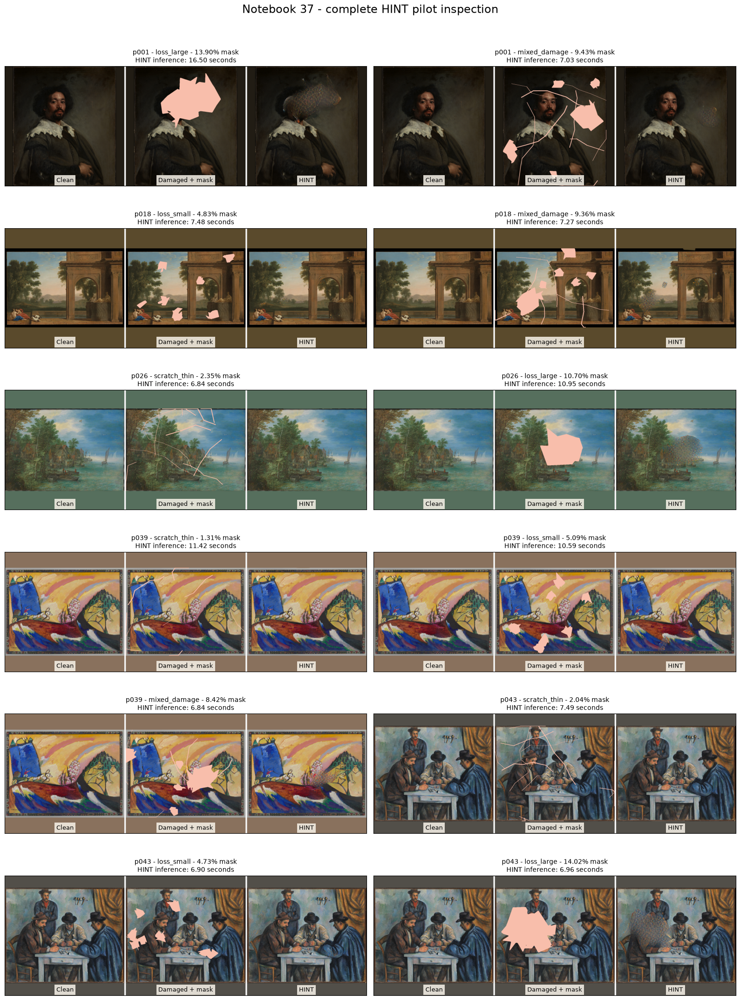

HINT inspection montage: outputs\37_hint_mat_method_selection\work\hint_full_montage.png


In [23]:
hint_scope_lookup = SELECTION_SCOPE.set_index(
    "case_id"
)
hint_candidate_lookup = (
    HINT_FULL_CANDIDATES.set_index("case_id")
)

figure, axes = plt.subplots(
    nrows=6,
    ncols=2,
    figsize=(16, 22),
)

for axis, scope_row in zip(
    axes.flat,
    SELECTION_SCOPE
    .sort_values("selection_rank")
    .itertuples(index=False),
):
    clean = load_rgb_array(
        resolve_repository_path(
            scope_row.clean_image_path
        )
    )
    damaged = load_rgb_array(
        resolve_repository_path(
            scope_row.input_image_path
        )
    )

    with Image.open(
        resolve_repository_path(
            scope_row.mask_path
        )
    ) as handle:
        missing = (
            np.asarray(
                handle.convert("L"),
                dtype=np.uint8,
            )
            >= 128
        )

    damaged_overlay = damaged.copy()
    overlay_colour = np.array(
        [238, 100, 55],
        dtype=np.float32,
    )
    damaged_overlay[missing] = (
        0.58
        * damaged[missing].astype(np.float32)
        + 0.42 * overlay_colour
    ).round().clip(0, 255).astype(np.uint8)

    if scope_row.case_id in hint_candidate_lookup.index:
        candidate = hint_candidate_lookup.loc[
            scope_row.case_id
        ]
        restored_path = Path(
            str(candidate["restored_path"])
        )
        restored = (
            load_rgb_array(restored_path)
            if restored_path.is_file()
            else np.zeros_like(clean)
        )
        runtime_seconds = pd.to_numeric(
            candidate["runtime_seconds"],
            errors="coerce",
        )
    else:
        restored = np.zeros_like(clean)
        runtime_seconds = np.nan

    separator = np.full(
        (clean.shape[0], 10, 3),
        247,
        dtype=np.uint8,
    )

    comparison = np.concatenate(
        [
            clean,
            separator,
            damaged_overlay,
            separator,
            restored,
        ],
        axis=1,
    )

    axis.imshow(comparison)
    axis.set_xticks([])
    axis.set_yticks([])

    axis.set_title(
        (
            f"{scope_row.painting_id} - "
            f"{scope_row.damage_type} - "
            f"{float(scope_row.realized_damage_fraction) * 100:.2f}% mask\n"
            f"HINT inference: "
            f"{runtime_seconds:.2f} seconds"
        ),
        fontsize=10,
    )

    for x_position, label in (
        (1 / 6, "Clean"),
        (3 / 6, "Damaged + mask"),
        (5 / 6, "HINT"),
    ):
        axis.text(
            x_position,
            0.02,
            label,
            ha="center",
            va="bottom",
            transform=axis.transAxes,
            fontsize=9,
            bbox={
                "facecolor": "#f7f2e8",
                "edgecolor": "none",
                "alpha": 0.86,
                "pad": 3,
            },
        )

figure.suptitle(
    "Notebook 37 - complete HINT pilot inspection",
    fontsize=17,
    y=0.995,
)
figure.tight_layout(rect=(0, 0, 1, 0.985))

HINT_FULL_MONTAGE_PATH = (
    OUTPUT_ROOT / "work" / "hint_full_montage.png"
)

figure.savefig(
    HINT_FULL_MONTAGE_PATH,
    dpi=150,
    bbox_inches="tight",
    facecolor="#f7f2e8",
)

display(figure)
plt.close(figure)

print(
    "HINT inspection montage:",
    HINT_FULL_MONTAGE_PATH.relative_to(
        PROJECT_ROOT
    ),
)

In [24]:
existing_validation = VALIDATION.to_dataframe()

VALIDATION = ValidationCollector()

for row in existing_validation.loc[
    ~existing_validation["validation_stage"].eq(
        "batch_4_hint_execution"
    )
].itertuples(index=False):
    VALIDATION.add(
        validation_stage=row.validation_stage,
        check_id=row.check_id,
        check_description=row.check_description,
        severity=row.severity,
        expected=row.expected,
        observed=row.observed,
        passed=bool(row.passed),
        details=row.details,
    )

hint_candidate_schema = validate_dataframe(
    HINT_FULL_CANDIDATES,
    get_schema("hint_mat_candidates"),
)

expected_hint_ids = set(
    HINT_FULL_PLAN["candidate_id"].astype(str)
)
observed_hint_ids = set(
    HINT_FULL_CANDIDATES[
        "candidate_id"
    ].astype(str)
)

hint_load_audit = HINT_FULL_RESULT.get(
    "model_load_audit",
    {},
)

hint_required_parameters_loaded = bool(
    int(
        hint_load_audit.get(
            "matched_state_keys",
            0,
        )
    )
    > 0
    and int(
        hint_load_audit.get(
            "missing_state_keys",
            -1,
        )
    )
    == 0
    and bool(
        hint_load_audit.get(
            "all_required_state_keys_loaded",
            False,
        )
    )
)

hint_actual_size = HINT_FULL_RESULT.get(
    "actual_inference_size"
)
hint_fallback_reason = HINT_FULL_RESULT.get(
    "fallback_reason",
    "",
)

hint_adapter_valid = bool(
    hint_actual_size in {512, 768}
    and (
        hint_actual_size == 768
        or bool(hint_fallback_reason)
    )
)

hint_process_valid = bool(
    not HINT_FULL_PROCESS.timed_out
    and HINT_FULL_PROCESS.return_code == 0
    and HINT_FULL_RESULT.get("status")
    == "completed"
)

hint_population_valid = bool(
    len(HINT_FULL_CANDIDATES) == 12
    and observed_hint_ids == expected_hint_ids
    and HINT_FULL_CANDIDATES["status"]
    .astype(str)
    .eq("completed")
    .all()
)

hint_technical_valid = bool(
    len(HINT_FULL_TECHNICAL_AUDIT) == 12
    and HINT_FULL_TECHNICAL_AUDIT[
        "technical_validation_passed"
    ]
    .astype(str)
    .str.lower()
    .eq("true")
    .all()
)

hint_checksums_valid = bool(
    len(HINT_FULL_CANDIDATES) == 12
    and HINT_FULL_CANDIDATES[
        "restored_sha256"
    ]
    .astype(str)
    .str.len()
    .eq(64)
    .all()
)


def add_hint_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_4_hint_execution",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


add_hint_check(
    check_id="hint_worker_completion",
    description=(
        "The guarded full HINT worker completed "
        "within its model-level budget."
    ),
    expected={
        "status": "completed",
        "return_code": 0,
        "timed_out": False,
    },
    observed={
        "status": HINT_FULL_RESULT.get("status"),
        "return_code": (
            HINT_FULL_PROCESS.return_code
        ),
        "timed_out": HINT_FULL_PROCESS.timed_out,
        "runtime_seconds": (
            HINT_FULL_PROCESS.runtime_seconds
        ),
    },
    passed=hint_process_valid,
)

add_hint_check(
    check_id="hint_official_checkpoint_load",
    description=(
        "All required HINT generator parameters "
        "loaded from the official checkpoint."
    ),
    expected={
        "missing_required_parameters": 0,
        "required_state_coverage": 1.0,
    },
    observed=hint_load_audit,
    passed=hint_required_parameters_loaded,
)

add_hint_check(
    check_id="hint_candidate_schema",
    description=(
        "The completed HINT candidate table "
        "satisfies its normalized schema."
    ),
    expected="schema passed",
    observed=hint_candidate_schema.to_dict(),
    passed=hint_candidate_schema.passed,
)

add_hint_check(
    check_id="hint_complete_population",
    description=(
        "All twelve predeclared HINT candidates "
        "completed exactly once."
    ),
    expected={
        "rows": 12,
        "candidate_ids": sorted(expected_hint_ids),
    },
    observed={
        "rows": len(HINT_FULL_CANDIDATES),
        "candidate_ids": sorted(observed_hint_ids),
        "status_counts": (
            HINT_FULL_CANDIDATES["status"]
            .value_counts(dropna=False)
            .to_dict()
        ),
    },
    passed=hint_population_valid,
)

add_hint_check(
    check_id="hint_output_integrity",
    description=(
        "All HINT outputs are 768 x 768 RGB and "
        "preserve every outside-mask pixel."
    ),
    expected={
        "technical_passes": 12,
        "outside_mask_changed_pixels": 0,
    },
    observed={
        "technical_passes": int(
            HINT_FULL_TECHNICAL_AUDIT[
                "technical_validation_passed"
            ]
            .astype(str)
            .str.lower()
            .eq("true")
            .sum()
        ),
        "outside_mask_changed_pixels": (
            pd.to_numeric(
                HINT_FULL_TECHNICAL_AUDIT[
                    "outside_mask_changed_pixels"
                ],
                errors="coerce",
            )
            .fillna(0)
            .sum()
        ),
    },
    passed=hint_technical_valid,
)

add_hint_check(
    check_id="hint_restoration_checksums",
    description=(
        "Every completed HINT restoration has a "
        "full SHA-256 checksum."
    ),
    expected="twelve 64-character hashes",
    observed={
        "valid_hashes": int(
            HINT_FULL_CANDIDATES[
                "restored_sha256"
            ]
            .astype(str)
            .str.len()
            .eq(64)
            .sum()
        )
    },
    passed=hint_checksums_valid,
)

add_hint_check(
    check_id="hint_adapter_decision",
    description=(
        "HINT used native 768 inference or a "
        "recorded 512 technical fallback."
    ),
    expected="768 or explained 512 fallback",
    observed={
        "actual_inference_size": hint_actual_size,
        "fallback_reason": hint_fallback_reason,
    },
    passed=hint_adapter_valid,
)

required_hint_files = [
    HINT_FULL_JOB_PATH,
    HINT_FULL_RESULT_PATH,
    HINT_FULL_CHECKPOINT_PATH,
    HINT_FULL_PROGRESS_PATH,
    HINT_FULL_CANDIDATES_PATH,
    HINT_FULL_TECHNICAL_PATH,
    HINT_FULL_PROCESS_PATH,
    HINT_FULL_MONTAGE_PATH,
]

required_hint_files.extend(
    Path(str(path))
    for path in HINT_FULL_CANDIDATES[
        "restored_path"
    ].tolist()
)

missing_hint_files = [
    str(path.relative_to(PROJECT_ROOT))
    for path in required_hint_files
    if not path.is_file()
]

add_hint_check(
    check_id="hint_persistence",
    description=(
        "All HINT restorations, checkpoints, "
        "audits, and inspection assets exist."
    ),
    expected="all required HINT files present",
    observed={
        "required": len(required_hint_files),
        "missing": missing_hint_files,
    },
    passed=not missing_hint_files,
)

BATCH_1_4_CHECKS_PATH = (
    OUTPUT_ROOT
    / "work"
    / "batch_1_4_validation_checks.csv"
)

BATCH_1_4_CHECKS = VALIDATION.to_dataframe()

atomic_write_csv(
    BATCH_1_4_CHECKS,
    BATCH_1_4_CHECKS_PATH,
)

BATCH_4_CHECKS = BATCH_1_4_CHECKS.loc[
    BATCH_1_4_CHECKS["validation_stage"].eq(
        "batch_4_hint_execution"
    )
].reset_index(drop=True)

BATCH_4_FAILED = BATCH_4_CHECKS.loc[
    (~BATCH_4_CHECKS["passed"])
    & BATCH_4_CHECKS["severity"].isin(
        ["error", "blocking"]
    )
]

BATCH_4_PASSED = BATCH_4_FAILED.empty

display(BATCH_4_CHECKS)

print("Batch 4 checks:", len(BATCH_4_CHECKS))
print(
    "Batch 4 blocking/error failures:",
    len(BATCH_4_FAILED),
)
print(
    "HINT inference resolution:",
    hint_actual_size,
)
print(
    "HINT required parameter coverage:",
    hint_load_audit.get(
        "required_state_coverage"
    ),
)
print(
    "HINT resumed candidates:",
    HINT_FULL_RESULT.get(
        "resumed_rows",
        0,
    ),
)

if BATCH_4_PASSED:
    print(
        "BATCH 4 PASSED - all twelve HINT "
        "restorations are technically valid."
    )
else:
    print(
        "BATCH 4 FAILED - do not begin the "
        "full MAT execution."
    )
    display(BATCH_4_FAILED)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_4_hint_execution,hint_worker_completion,The guarded full HINT worker completed within ...,blocking,"{""return_code"": 0, ""status"": ""completed"", ""tim...","{""return_code"": 0, ""runtime_seconds"": 127.186,...",True,
1,batch_4_hint_execution,hint_official_checkpoint_load,All required HINT generator parameters loaded ...,blocking,"{""missing_required_parameters"": 0, ""required_s...","{""all_required_state_keys_loaded"": true, ""load...",True,
2,batch_4_hint_execution,hint_candidate_schema,The completed HINT candidate table satisfies i...,blocking,schema passed,"{""column_count"": 55, ""duplicate_primary_key_ro...",True,
3,batch_4_hint_execution,hint_complete_population,All twelve predeclared HINT candidates complet...,blocking,"{""candidate_ids"": [""n37__hint_places2__02206fb...","{""candidate_ids"": [""n37__hint_places2__02206fb...",True,
4,batch_4_hint_execution,hint_output_integrity,All HINT outputs are 768 x 768 RGB and preserv...,blocking,"{""outside_mask_changed_pixels"": 0, ""technical_...","{""outside_mask_changed_pixels"": ""0"", ""technica...",True,
5,batch_4_hint_execution,hint_restoration_checksums,Every completed HINT restoration has a full SH...,blocking,twelve 64-character hashes,"{""valid_hashes"": 12}",True,
6,batch_4_hint_execution,hint_adapter_decision,HINT used native 768 inference or a recorded 5...,blocking,768 or explained 512 fallback,"{""actual_inference_size"": 768, ""fallback_reaso...",True,
7,batch_4_hint_execution,hint_persistence,"All HINT restorations, checkpoints, audits, an...",blocking,all required HINT files present,"{""missing"": [], ""required"": 20}",True,


Batch 4 checks: 8
Batch 4 blocking/error failures: 0
HINT inference resolution: 768
HINT required parameter coverage: 1.0
HINT resumed candidates: 0
BATCH 4 PASSED - all twelve HINT restorations are technically valid.


## Batch 5 — Guarded full MAT execution

This batch:

- constructs the full twelve-case MAT worker job;
- uses the official Places-512 FullData checkpoint;
- applies the declared 768-to-512 adapter;
- converts the canonical missing-pixel mask to MAT's retained-pixel convention;
- applies a two-hour model-level watchdog;
- checkpoints progress after every case;
- resumes technically valid completed candidates after interruption;
- captures optional CUDA-extension failures without flooding notebook output;
- records use of MAT's supported PyTorch fallback;
- writes the twelve canonical MAT restorations;
- independently validates output geometry and exact compositing;
- renders a complete MAT inspection montage.

This batch establishes MAT's technical feasibility and visual evidence. It does not automatically select MAT or compare aggregate quality.

In [25]:
if not BATCH_4_PASSED:
    raise RuntimeError(
        "Batch 4 did not pass. Do not begin "
        "full MAT execution."
    )

MAT_MODEL_ID = CONFIG["models"]["mat"]["model_id"]

MAT_FULL_PLAN = (
    CANDIDATE_PLAN_CHECKED.loc[
        CANDIDATE_PLAN_CHECKED["model_id"].eq(
            MAT_MODEL_ID
        )
    ]
    .sort_values("selection_rank")
    .reset_index(drop=True)
)

(
    MAT_FULL_PAYLOAD,
    MAT_FULL_JOB_PATH,
    MAT_FULL_RESULT_PATH,
    MAT_FULL_CHECKPOINT_PATH,
    MAT_FULL_PROGRESS_PATH,
) = build_worker_job(
    "mat",
    MAT_FULL_PLAN,
    CONFIG,
    project_root=PROJECT_ROOT,
    output_root=OUTPUT_ROOT,
    job_role="full",
)

MAT_FULL_JOB = {
    "payload": MAT_FULL_PAYLOAD,
    "job_path": MAT_FULL_JOB_PATH,
    "result_path": MAT_FULL_RESULT_PATH,
    "checkpoint_path": MAT_FULL_CHECKPOINT_PATH,
    "progress_path": MAT_FULL_PROGRESS_PATH,
}

mat_job_candidate_ids = {
    str(row["candidate_id"])
    for row in MAT_FULL_PAYLOAD["candidates"]
}

mat_plan_candidate_ids = set(
    MAT_FULL_PLAN["candidate_id"].astype(str)
)

MAT_FULL_JOB_READY = bool(
    len(MAT_FULL_PLAN) == 12
    and len(MAT_FULL_PAYLOAD["candidates"]) == 12
    and mat_job_candidate_ids == mat_plan_candidate_ids
)

display(
    MAT_FULL_PLAN[
        [
            "selection_rank",
            "case_id",
            "painting_id",
            "category",
            "damage_type",
            "inference_width",
            "adapter_policy",
            "restored_path",
        ]
    ]
)

print("Full MAT candidates:", len(MAT_FULL_PLAN))
print(
    "Full MAT job:",
    MAT_FULL_JOB_PATH.relative_to(PROJECT_ROOT),
)
print(
    "Checkpoint:",
    MAT_FULL_CHECKPOINT_PATH.relative_to(
        PROJECT_ROOT
    ),
)
print(
    "Required inference resolution:",
    CONFIG["models"]["mat"]["inference_size"],
)
print(
    "Resume enabled:",
    CONFIG["execution"]["resume_enabled"],
)
print("Job ready:", MAT_FULL_JOB_READY)

,selection_rank,case_id,painting_id,category,damage_type,inference_width,adapter_policy,restored_path
0,1,canonical__p001__loss_large,p001,portrait_figure,loss_large,512,resize_768_to_512_then_restore_and_exact_compo...,outputs/37_hint_mat_method_selection/images/re...
1,2,canonical__p001__mixed_damage,p001,portrait_figure,mixed_damage,512,resize_768_to_512_then_restore_and_exact_compo...,outputs/37_hint_mat_method_selection/images/re...
2,3,canonical__p018__loss_small,p018,landscape_natural,loss_small,512,resize_768_to_512_then_restore_and_exact_compo...,outputs/37_hint_mat_method_selection/images/re...
3,4,canonical__p018__mixed_damage,p018,landscape_natural,mixed_damage,512,resize_768_to_512_then_restore_and_exact_compo...,outputs/37_hint_mat_method_selection/images/re...
4,5,canonical__p026__scratch_thin,p026,architecture_structured,scratch_thin,512,resize_768_to_512_then_restore_and_exact_compo...,outputs/37_hint_mat_method_selection/images/re...
5,6,canonical__p026__loss_large,p026,architecture_structured,loss_large,512,resize_768_to_512_then_restore_and_exact_compo...,outputs/37_hint_mat_method_selection/images/re...
6,7,canonical__p039__scratch_thin,p039,abstraction_surrealism,scratch_thin,512,resize_768_to_512_then_restore_and_exact_compo...,outputs/37_hint_mat_method_selection/images/re...
7,8,canonical__p039__loss_small,p039,abstraction_surrealism,loss_small,512,resize_768_to_512_then_restore_and_exact_compo...,outputs/37_hint_mat_method_selection/images/re...
8,9,canonical__p039__mixed_damage,p039,abstraction_surrealism,mixed_damage,512,resize_768_to_512_then_restore_and_exact_compo...,outputs/37_hint_mat_method_selection/images/re...
9,10,canonical__p043__scratch_thin,p043,high_texture_brushwork,scratch_thin,512,resize_768_to_512_then_restore_and_exact_compo...,outputs/37_hint_mat_method_selection/images/re...


Full MAT candidates: 12
Full MAT job: outputs\37_hint_mat_method_selection\work\mat\full\job.json
Checkpoint: outputs\37_hint_mat_method_selection\work\mat\full\candidate_checkpoint.csv
Required inference resolution: 512
Resume enabled: True
Job ready: True


In [26]:
if not MAT_FULL_JOB_READY:
    raise RuntimeError(
        "The full MAT worker job is invalid."
    )

# Remove only the stale result summary. Existing valid
# candidate checkpoints remain available for resumption.
MAT_FULL_RESULT_PATH.unlink(missing_ok=True)

MAT_FULL_TIMEOUT_SECONDS = float(
    CONFIG["execution"]["full_model_budget_seconds"]
)

print("Starting guarded full MAT execution...")
print(
    "Hard timeout:",
    round(MAT_FULL_TIMEOUT_SECONDS / 60, 1),
    "minutes",
)
print(
    "Optional extension diagnostics will be "
    "captured rather than printed repeatedly."
)
print(
    "Progress will be checkpointed after every case."
)

MAT_FULL_PROCESS = run_worker_process(
    worker_command(
        "mat",
        MAT_FULL_JOB_PATH,
    ),
    timeout_seconds=MAT_FULL_TIMEOUT_SECONDS,
    cwd=PROJECT_ROOT,
    environment=WORKER_ENVIRONMENT,
)

print(
    "MAT return code:",
    MAT_FULL_PROCESS.return_code,
)
print(
    "MAT timed out:",
    MAT_FULL_PROCESS.timed_out,
)
print(
    "Parent-observed runtime:",
    MAT_FULL_PROCESS.runtime_seconds,
    "seconds",
)

if MAT_FULL_PROCESS.stdout.strip():
    print("\nMAT progress and result:")
    print(MAT_FULL_PROCESS.stdout.strip())

if MAT_FULL_PROCESS.stderr.strip():
    print("\nMAT concise diagnostics:")
    print(MAT_FULL_PROCESS.stderr.strip())

Starting guarded full MAT execution...
Hard timeout: 120.0 minutes
Optional extension diagnostics will be captured rather than printed repeatedly.
Progress will be checkpointed after every case.
MAT return code: 0
MAT timed out: False
Parent-observed runtime: 158.847 seconds

MAT progress and result:
MAT progress 1/12: canonical__p001__loss_large -> completed
MAT progress 2/12: canonical__p001__mixed_damage -> completed
MAT progress 3/12: canonical__p018__loss_small -> completed
MAT progress 4/12: canonical__p018__mixed_damage -> completed
MAT progress 5/12: canonical__p026__scratch_thin -> completed
MAT progress 6/12: canonical__p026__loss_large -> completed
MAT progress 7/12: canonical__p039__scratch_thin -> completed
MAT progress 8/12: canonical__p039__loss_small -> completed
MAT progress 9/12: canonical__p039__mixed_damage -> completed
MAT progress 10/12: canonical__p043__scratch_thin -> completed
MAT progress 11/12: canonical__p043__loss_small -> completed
MAT progress 12/12: cano

In [27]:
if MAT_FULL_RESULT_PATH.is_file():
    with MAT_FULL_RESULT_PATH.open(
        "r",
        encoding="utf-8-sig",
    ) as handle:
        MAT_FULL_RESULT = json.load(handle)
else:
    MAT_FULL_RESULT = {}

if MAT_FULL_CHECKPOINT_PATH.is_file():
    MAT_FULL_CANDIDATES = pd.read_csv(
        MAT_FULL_CHECKPOINT_PATH
    ).reindex(columns=CANDIDATE_COLUMNS)
else:
    MAT_FULL_CANDIDATES = pd.DataFrame(
        columns=CANDIDATE_COLUMNS
    )

MAT_FULL_CANDIDATES["worker_return_code"] = (
    MAT_FULL_PROCESS.return_code
)

mat_technical_rows = []

for row in MAT_FULL_CANDIDATES.itertuples(
    index=False
):
    restored_path = Path(str(row.restored_path))
    input_path = Path(str(row.input_image_path))
    mask_path = Path(str(row.mask_path))

    if restored_path.is_file():
        technical = validate_restored_output(
            restored_path,
            input_path,
            mask_path,
        )
    else:
        technical = {
            "output_geometry_valid": False,
            "outside_mask_changed_pixels": None,
            "technical_validation_passed": False,
        }

    mat_technical_rows.append(
        {
            "candidate_id": row.candidate_id,
            "case_id": row.case_id,
            "painting_id": row.painting_id,
            "damage_type": row.damage_type,
            "restored_path": str(restored_path),
            "output_exists": restored_path.is_file(),
            **technical,
        }
    )

MAT_FULL_TECHNICAL_AUDIT = pd.DataFrame(
    mat_technical_rows,
    columns=[
        "candidate_id",
        "case_id",
        "painting_id",
        "damage_type",
        "restored_path",
        "output_exists",
        "output_geometry_valid",
        "outside_mask_changed_pixels",
        "technical_validation_passed",
    ],
)

MAT_FULL_PROCESS_AUDIT = pd.DataFrame(
    [
        {
            "model_key": "mat",
            "timed_out": MAT_FULL_PROCESS.timed_out,
            "return_code": MAT_FULL_PROCESS.return_code,
            "parent_runtime_seconds": (
                MAT_FULL_PROCESS.runtime_seconds
            ),
            "result_status": MAT_FULL_RESULT.get(
                "status",
                "missing",
            ),
            "completed_rows": MAT_FULL_RESULT.get(
                "completed_rows",
                0,
            ),
            "successful_rows": MAT_FULL_RESULT.get(
                "successful_rows",
                0,
            ),
            "resumed_rows": MAT_FULL_RESULT.get(
                "resumed_rows",
                0,
            ),
            "actual_inference_size": (
                MAT_FULL_RESULT.get(
                    "actual_inference_size"
                )
            ),
            "optional_extension_fallback_cases": (
                MAT_FULL_RESULT.get(
                    "optional_extension_fallback_cases",
                    0,
                )
            ),
            "captured_diagnostic_lines": (
                MAT_FULL_RESULT.get(
                    "captured_diagnostic_lines",
                    0,
                )
            ),
            "stdout": MAT_FULL_PROCESS.stdout,
            "stderr": MAT_FULL_PROCESS.stderr,
        }
    ]
)

MAT_FULL_CANDIDATES_PATH = (
    OUTPUT_ROOT / "work" / "mat_full_candidates.csv"
)
MAT_FULL_TECHNICAL_PATH = (
    OUTPUT_ROOT
    / "work"
    / "mat_full_technical_audit.csv"
)
MAT_FULL_PROCESS_PATH = (
    OUTPUT_ROOT
    / "work"
    / "mat_full_process_audit.csv"
)

atomic_write_csv(
    MAT_FULL_CANDIDATES,
    MAT_FULL_CANDIDATES_PATH,
)
atomic_write_csv(
    MAT_FULL_TECHNICAL_AUDIT,
    MAT_FULL_TECHNICAL_PATH,
)
atomic_write_csv(
    MAT_FULL_PROCESS_AUDIT,
    MAT_FULL_PROCESS_PATH,
)

display(MAT_FULL_PROCESS_AUDIT)
display(
    MAT_FULL_CANDIDATES[
        [
            "selection_rank",
            "case_id",
            "damage_type",
            "status",
            "inference_width",
            "output_width",
            "output_height",
            "model_load_seconds",
            "inference_seconds",
            "runtime_seconds",
            "gpu_peak_memory_bytes",
            "generator_name",
            "issue",
        ]
    ]
)
display(MAT_FULL_TECHNICAL_AUDIT)

print(
    "Completed MAT candidates:",
    int(
        MAT_FULL_CANDIDATES["status"]
        .astype(str)
        .eq("completed")
        .sum()
    ),
    "/ 12",
)
print(
    "Cases using the supported PyTorch fallback:",
    MAT_FULL_RESULT.get(
        "optional_extension_fallback_cases",
        0,
    ),
)

,model_key,timed_out,return_code,parent_runtime_seconds,result_status,completed_rows,successful_rows,resumed_rows,actual_inference_size,optional_extension_fallback_cases,captured_diagnostic_lines,stdout,stderr
0,mat,False,0,158.847,completed,12,12,0,512,12,4908,MAT progress 1/12: canonical__p001__loss_large...,D:\Masters\FH\Thesis\painting-restoration-eval...


,selection_rank,case_id,damage_type,status,inference_width,output_width,output_height,model_load_seconds,inference_seconds,runtime_seconds,gpu_peak_memory_bytes,generator_name,issue
0,1,canonical__p001__loss_large,loss_large,completed,512,768,768,14.183,28.478,29.319,1324408832,Generator,optional_cuda_extension_build_failed_pytorch_f...
1,2,canonical__p001__mixed_damage,mixed_damage,completed,512,768,768,0.000,11.313,12.009,1324408832,Generator,optional_cuda_extension_build_failed_pytorch_f...
2,3,canonical__p018__loss_small,loss_small,completed,512,768,768,0.000,8.854,9.407,1324408832,Generator,optional_cuda_extension_build_failed_pytorch_f...
3,4,canonical__p018__mixed_damage,mixed_damage,completed,512,768,768,0.000,7.846,8.425,1324408832,Generator,optional_cuda_extension_build_failed_pytorch_f...
4,5,canonical__p026__scratch_thin,scratch_thin,completed,512,768,768,0.000,7.739,8.210,1324408832,Generator,optional_cuda_extension_build_failed_pytorch_f...
5,6,canonical__p026__loss_large,loss_large,completed,512,768,768,0.000,8.298,8.828,1324408832,Generator,optional_cuda_extension_build_failed_pytorch_f...
6,7,canonical__p039__scratch_thin,scratch_thin,completed,512,768,768,0.000,7.913,8.512,1324408832,Generator,optional_cuda_extension_build_failed_pytorch_f...
7,8,canonical__p039__loss_small,loss_small,completed,512,768,768,0.000,8.128,8.800,1324408832,Generator,optional_cuda_extension_build_failed_pytorch_f...
8,9,canonical__p039__mixed_damage,mixed_damage,completed,512,768,768,0.000,7.819,8.421,1324408832,Generator,optional_cuda_extension_build_failed_pytorch_f...
9,10,canonical__p043__scratch_thin,scratch_thin,completed,512,768,768,0.000,7.838,8.513,1324408832,Generator,optional_cuda_extension_build_failed_pytorch_f...


,candidate_id,case_id,painting_id,damage_type,restored_path,output_exists,output_geometry_valid,outside_mask_changed_pixels,technical_validation_passed
0,n37__mat_places_512_fulldata__cdd73a74f252,canonical__p001__loss_large,p001,loss_large,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
1,n37__mat_places_512_fulldata__0dc86caf2985,canonical__p001__mixed_damage,p001,mixed_damage,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
2,n37__mat_places_512_fulldata__df8d2254fc82,canonical__p018__loss_small,p018,loss_small,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
3,n37__mat_places_512_fulldata__0ac274dd1dbb,canonical__p018__mixed_damage,p018,mixed_damage,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
4,n37__mat_places_512_fulldata__68e7ce0f1a08,canonical__p026__scratch_thin,p026,scratch_thin,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
5,n37__mat_places_512_fulldata__3e58159772db,canonical__p026__loss_large,p026,loss_large,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
6,n37__mat_places_512_fulldata__5b2536b97c18,canonical__p039__scratch_thin,p039,scratch_thin,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
7,n37__mat_places_512_fulldata__8c5980ade69d,canonical__p039__loss_small,p039,loss_small,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
8,n37__mat_places_512_fulldata__4a6460701d16,canonical__p039__mixed_damage,p039,mixed_damage,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True
9,n37__mat_places_512_fulldata__a9bbdb150107,canonical__p043__scratch_thin,p043,scratch_thin,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,0,True


Completed MAT candidates: 12 / 12
Cases using the supported PyTorch fallback: 12


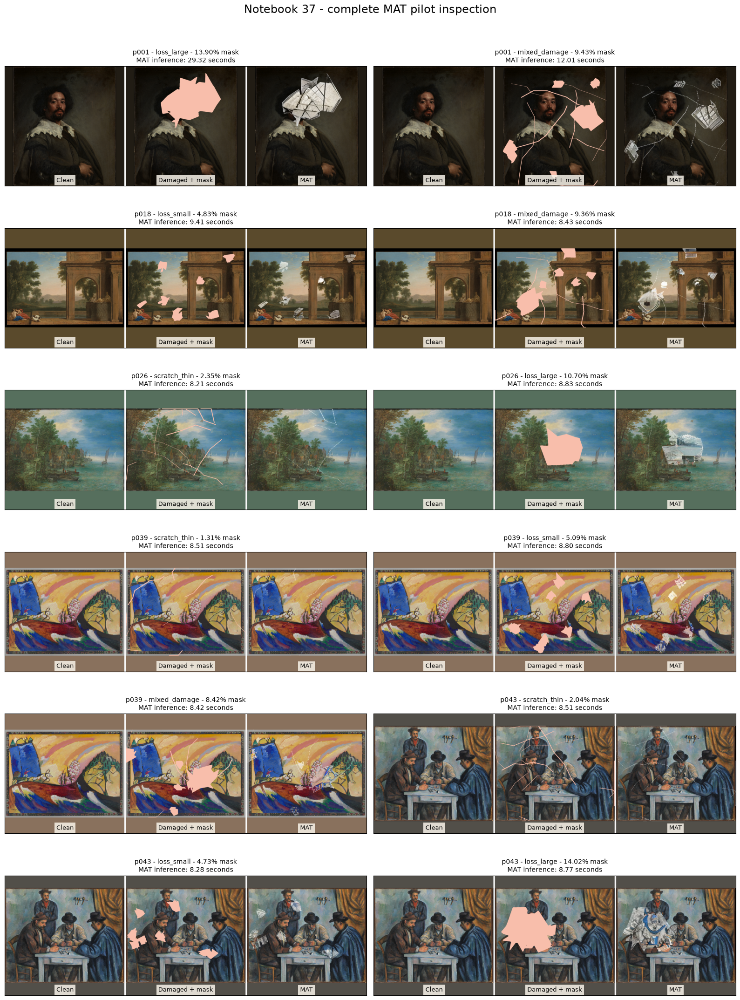

MAT inspection montage: outputs\37_hint_mat_method_selection\work\mat_full_montage.png


In [28]:
mat_candidate_lookup = (
    MAT_FULL_CANDIDATES.set_index("case_id")
)

figure, axes = plt.subplots(
    nrows=6,
    ncols=2,
    figsize=(16, 22),
)

for axis, scope_row in zip(
    axes.flat,
    SELECTION_SCOPE
    .sort_values("selection_rank")
    .itertuples(index=False),
):
    clean = load_rgb_array(
        resolve_repository_path(
            scope_row.clean_image_path
        )
    )
    damaged = load_rgb_array(
        resolve_repository_path(
            scope_row.input_image_path
        )
    )

    with Image.open(
        resolve_repository_path(
            scope_row.mask_path
        )
    ) as handle:
        missing = (
            np.asarray(
                handle.convert("L"),
                dtype=np.uint8,
            )
            >= 128
        )

    damaged_overlay = damaged.copy()
    overlay_colour = np.array(
        [238, 100, 55],
        dtype=np.float32,
    )
    damaged_overlay[missing] = (
        0.58
        * damaged[missing].astype(np.float32)
        + 0.42 * overlay_colour
    ).round().clip(0, 255).astype(np.uint8)

    if scope_row.case_id in mat_candidate_lookup.index:
        candidate = mat_candidate_lookup.loc[
            scope_row.case_id
        ]
        restored_path = Path(
            str(candidate["restored_path"])
        )
        restored = (
            load_rgb_array(restored_path)
            if restored_path.is_file()
            else np.zeros_like(clean)
        )
        runtime_seconds = pd.to_numeric(
            candidate["runtime_seconds"],
            errors="coerce",
        )
    else:
        restored = np.zeros_like(clean)
        runtime_seconds = np.nan

    separator = np.full(
        (clean.shape[0], 10, 3),
        247,
        dtype=np.uint8,
    )

    comparison = np.concatenate(
        [
            clean,
            separator,
            damaged_overlay,
            separator,
            restored,
        ],
        axis=1,
    )

    axis.imshow(comparison)
    axis.set_xticks([])
    axis.set_yticks([])

    axis.set_title(
        (
            f"{scope_row.painting_id} - "
            f"{scope_row.damage_type} - "
            f"{float(scope_row.realized_damage_fraction) * 100:.2f}% mask\n"
            f"MAT inference: "
            f"{runtime_seconds:.2f} seconds"
        ),
        fontsize=10,
    )

    for x_position, label in (
        (1 / 6, "Clean"),
        (3 / 6, "Damaged + mask"),
        (5 / 6, "MAT"),
    ):
        axis.text(
            x_position,
            0.02,
            label,
            ha="center",
            va="bottom",
            transform=axis.transAxes,
            fontsize=9,
            bbox={
                "facecolor": "#f7f2e8",
                "edgecolor": "none",
                "alpha": 0.86,
                "pad": 3,
            },
        )

figure.suptitle(
    "Notebook 37 - complete MAT pilot inspection",
    fontsize=17,
    y=0.995,
)
figure.tight_layout(rect=(0, 0, 1, 0.985))

MAT_FULL_MONTAGE_PATH = (
    OUTPUT_ROOT / "work" / "mat_full_montage.png"
)

figure.savefig(
    MAT_FULL_MONTAGE_PATH,
    dpi=150,
    bbox_inches="tight",
    facecolor="#f7f2e8",
)

display(figure)
plt.close(figure)

print(
    "MAT inspection montage:",
    MAT_FULL_MONTAGE_PATH.relative_to(
        PROJECT_ROOT
    ),
)

In [29]:
existing_validation = VALIDATION.to_dataframe()

VALIDATION = ValidationCollector()

for row in existing_validation.loc[
    ~existing_validation["validation_stage"].eq(
        "batch_5_mat_execution"
    )
].itertuples(index=False):
    VALIDATION.add(
        validation_stage=row.validation_stage,
        check_id=row.check_id,
        check_description=row.check_description,
        severity=row.severity,
        expected=row.expected,
        observed=row.observed,
        passed=bool(row.passed),
        details=row.details,
    )

mat_candidate_schema = validate_dataframe(
    MAT_FULL_CANDIDATES,
    get_schema("hint_mat_candidates"),
)

expected_mat_ids = set(
    MAT_FULL_PLAN["candidate_id"].astype(str)
)
observed_mat_ids = set(
    MAT_FULL_CANDIDATES["candidate_id"].astype(str)
)

mat_process_valid = bool(
    not MAT_FULL_PROCESS.timed_out
    and MAT_FULL_PROCESS.return_code == 0
    and MAT_FULL_RESULT.get("status") == "completed"
)

mat_population_valid = bool(
    len(MAT_FULL_CANDIDATES) == 12
    and observed_mat_ids == expected_mat_ids
    and MAT_FULL_CANDIDATES["status"]
    .astype(str)
    .eq("completed")
    .all()
)

mat_technical_valid = bool(
    len(MAT_FULL_TECHNICAL_AUDIT) == 12
    and MAT_FULL_TECHNICAL_AUDIT[
        "technical_validation_passed"
    ]
    .astype(str)
    .str.lower()
    .eq("true")
    .all()
)

mat_checksums_valid = bool(
    len(MAT_FULL_CANDIDATES) == 12
    and MAT_FULL_CANDIDATES["restored_sha256"]
    .astype(str)
    .str.len()
    .eq(64)
    .all()
)

mat_generator_valid = bool(
    len(MAT_FULL_CANDIDATES) == 12
    and MAT_FULL_CANDIDATES["generator_name"]
    .astype(str)
    .eq("Generator")
    .all()
)

mat_adapter_valid = bool(
    MAT_FULL_RESULT.get(
        "actual_inference_size"
    )
    == 512
    and MAT_FULL_CANDIDATES["inference_width"]
    .astype(int)
    .eq(512)
    .all()
    and MAT_FULL_CANDIDATES["inference_height"]
    .astype(int)
    .eq(512)
    .all()
)

mat_fallback_candidates = int(
    MAT_FULL_CANDIDATES["issue"]
    .fillna("")
    .astype(str)
    .str.contains(
        "optional_cuda_extension_build_failed",
        regex=False,
    )
    .sum()
)

mat_fallback_cases = max(
    int(
        MAT_FULL_RESULT.get(
            "optional_extension_fallback_cases",
            0,
        )
    ),
    mat_fallback_candidates,
)


def add_mat_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_5_mat_execution",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


add_mat_check(
    check_id="mat_worker_completion",
    description=(
        "The guarded full MAT worker completed "
        "within its model-level budget."
    ),
    expected={
        "status": "completed",
        "return_code": 0,
        "timed_out": False,
    },
    observed={
        "status": MAT_FULL_RESULT.get("status"),
        "return_code": MAT_FULL_PROCESS.return_code,
        "timed_out": MAT_FULL_PROCESS.timed_out,
        "runtime_seconds": (
            MAT_FULL_PROCESS.runtime_seconds
        ),
    },
    passed=mat_process_valid,
)

add_mat_check(
    check_id="mat_official_checkpoint_load",
    description=(
        "The official MAT checkpoint loaded as the "
        "declared Generator implementation."
    ),
    expected={
        "generator_name": "Generator",
        "checkpoint_hash_length": 64,
    },
    observed={
        "generator_names": sorted(
            MAT_FULL_CANDIDATES[
                "generator_name"
            ]
            .astype(str)
            .unique()
            .tolist()
        ),
        "checkpoint_hashes": int(
            MAT_FULL_CANDIDATES[
                "checkpoint_sha256"
            ]
            .astype(str)
            .str.len()
            .eq(64)
            .sum()
        ),
    },
    passed=mat_generator_valid,
)

add_mat_check(
    check_id="mat_candidate_schema",
    description=(
        "The completed MAT candidate table "
        "satisfies its normalized schema."
    ),
    expected="schema passed",
    observed=mat_candidate_schema.to_dict(),
    passed=mat_candidate_schema.passed,
)

add_mat_check(
    check_id="mat_complete_population",
    description=(
        "All twelve predeclared MAT candidates "
        "completed exactly once."
    ),
    expected={
        "rows": 12,
        "candidate_ids": sorted(expected_mat_ids),
    },
    observed={
        "rows": len(MAT_FULL_CANDIDATES),
        "candidate_ids": sorted(observed_mat_ids),
        "status_counts": (
            MAT_FULL_CANDIDATES["status"]
            .value_counts(dropna=False)
            .to_dict()
        ),
    },
    passed=mat_population_valid,
)

add_mat_check(
    check_id="mat_output_integrity",
    description=(
        "All MAT outputs are 768 x 768 RGB and "
        "preserve every outside-mask pixel."
    ),
    expected={
        "technical_passes": 12,
        "outside_mask_changed_pixels": 0,
    },
    observed={
        "technical_passes": int(
            MAT_FULL_TECHNICAL_AUDIT[
                "technical_validation_passed"
            ]
            .astype(str)
            .str.lower()
            .eq("true")
            .sum()
        ),
        "outside_mask_changed_pixels": (
            pd.to_numeric(
                MAT_FULL_TECHNICAL_AUDIT[
                    "outside_mask_changed_pixels"
                ],
                errors="coerce",
            )
            .fillna(0)
            .sum()
        ),
    },
    passed=mat_technical_valid,
)

add_mat_check(
    check_id="mat_restoration_checksums",
    description=(
        "Every completed MAT restoration has a "
        "full SHA-256 checksum."
    ),
    expected="twelve 64-character hashes",
    observed={
        "valid_hashes": int(
            MAT_FULL_CANDIDATES[
                "restored_sha256"
            ]
            .astype(str)
            .str.len()
            .eq(64)
            .sum()
        )
    },
    passed=mat_checksums_valid,
)

add_mat_check(
    check_id="mat_adapter_resolution",
    description=(
        "Every MAT candidate used the declared "
        "512 adapter and returned to 768."
    ),
    expected={
        "inference_resolution": 512,
        "output_resolution": 768,
    },
    observed={
        "actual_inference_size": (
            MAT_FULL_RESULT.get(
                "actual_inference_size"
            )
        ),
        "inference_widths": sorted(
            pd.to_numeric(
                MAT_FULL_CANDIDATES[
                    "inference_width"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
        "output_widths": sorted(
            pd.to_numeric(
                MAT_FULL_CANDIDATES[
                    "output_width"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
    },
    passed=mat_adapter_valid,
)

add_mat_check(
    check_id="mat_optional_extension_fallback",
    description=(
        "Use of MAT's supported PyTorch fallback "
        "is retained for runtime interpretation."
    ),
    expected="fallback use recorded",
    observed={
        "fallback_cases": mat_fallback_cases,
        "captured_diagnostic_lines": (
            MAT_FULL_RESULT.get(
                "captured_diagnostic_lines",
                0,
            )
        ),
        "worker_completed": mat_process_valid,
    },
    passed=True,
    severity="info",
)

required_mat_files = [
    MAT_FULL_JOB_PATH,
    MAT_FULL_RESULT_PATH,
    MAT_FULL_CHECKPOINT_PATH,
    MAT_FULL_PROGRESS_PATH,
    MAT_FULL_CANDIDATES_PATH,
    MAT_FULL_TECHNICAL_PATH,
    MAT_FULL_PROCESS_PATH,
    MAT_FULL_MONTAGE_PATH,
]

required_mat_files.extend(
    Path(str(path))
    for path in MAT_FULL_CANDIDATES[
        "restored_path"
    ].tolist()
)

missing_mat_files = [
    str(path.relative_to(PROJECT_ROOT))
    for path in required_mat_files
    if not path.is_file()
]

add_mat_check(
    check_id="mat_persistence",
    description=(
        "All MAT restorations, checkpoints, audits, "
        "and inspection assets exist."
    ),
    expected="all required MAT files present",
    observed={
        "required": len(required_mat_files),
        "missing": missing_mat_files,
    },
    passed=not missing_mat_files,
)

BATCH_1_5_CHECKS_PATH = (
    OUTPUT_ROOT
    / "work"
    / "batch_1_5_validation_checks.csv"
)

BATCH_1_5_CHECKS = VALIDATION.to_dataframe()

atomic_write_csv(
    BATCH_1_5_CHECKS,
    BATCH_1_5_CHECKS_PATH,
)

BATCH_5_CHECKS = BATCH_1_5_CHECKS.loc[
    BATCH_1_5_CHECKS["validation_stage"].eq(
        "batch_5_mat_execution"
    )
].reset_index(drop=True)

BATCH_5_FAILED = BATCH_5_CHECKS.loc[
    (~BATCH_5_CHECKS["passed"])
    & BATCH_5_CHECKS["severity"].isin(
        ["error", "blocking"]
    )
]

BATCH_5_PASSED = BATCH_5_FAILED.empty

display(BATCH_5_CHECKS)

print("Batch 5 checks:", len(BATCH_5_CHECKS))
print(
    "Batch 5 blocking/error failures:",
    len(BATCH_5_FAILED),
)
print(
    "MAT inference resolution:",
    MAT_FULL_RESULT.get(
        "actual_inference_size"
    ),
)
print(
    "MAT fallback cases:",
    mat_fallback_cases,
)
print(
    "MAT resumed candidates:",
    MAT_FULL_RESULT.get(
        "resumed_rows",
        0,
    ),
)

if BATCH_5_PASSED:
    print(
        "BATCH 5 PASSED - all twelve MAT "
        "restorations are technically valid."
    )
else:
    print(
        "BATCH 5 FAILED - do not begin metric "
        "computation."
    )
    display(BATCH_5_FAILED)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_5_mat_execution,mat_worker_completion,The guarded full MAT worker completed within i...,blocking,"{""return_code"": 0, ""status"": ""completed"", ""tim...","{""return_code"": 0, ""runtime_seconds"": 158.847,...",True,
1,batch_5_mat_execution,mat_official_checkpoint_load,The official MAT checkpoint loaded as the decl...,blocking,"{""checkpoint_hash_length"": 64, ""generator_name...","{""checkpoint_hashes"": 12, ""generator_names"": [...",True,
2,batch_5_mat_execution,mat_candidate_schema,The completed MAT candidate table satisfies it...,blocking,schema passed,"{""column_count"": 55, ""duplicate_primary_key_ro...",True,
3,batch_5_mat_execution,mat_complete_population,All twelve predeclared MAT candidates complete...,blocking,"{""candidate_ids"": [""n37__mat_places_512_fullda...","{""candidate_ids"": [""n37__mat_places_512_fullda...",True,
4,batch_5_mat_execution,mat_output_integrity,All MAT outputs are 768 x 768 RGB and preserve...,blocking,"{""outside_mask_changed_pixels"": 0, ""technical_...","{""outside_mask_changed_pixels"": ""0"", ""technica...",True,
5,batch_5_mat_execution,mat_restoration_checksums,Every completed MAT restoration has a full SHA...,blocking,twelve 64-character hashes,"{""valid_hashes"": 12}",True,
6,batch_5_mat_execution,mat_adapter_resolution,Every MAT candidate used the declared 512 adap...,blocking,"{""inference_resolution"": 512, ""output_resoluti...","{""actual_inference_size"": 512, ""inference_widt...",True,
7,batch_5_mat_execution,mat_optional_extension_fallback,Use of MAT's supported PyTorch fallback is ret...,info,fallback use recorded,"{""captured_diagnostic_lines"": 4908, ""fallback_...",True,
8,batch_5_mat_execution,mat_persistence,"All MAT restorations, checkpoints, audits, and...",blocking,all required MAT files present,"{""missing"": [], ""required"": 20}",True,


Batch 5 checks: 9
Batch 5 blocking/error failures: 0
MAT inference resolution: 512
MAT fallback cases: 12
MAT resumed candidates: 0
BATCH 5 PASSED - all twelve MAT restorations are technically valid.


## Batch 6 — Reference, perceptual, and feature metrics

This batch:

- constructs the 24-candidate evaluation worklist;
- reuses the canonical region policy;
- computes classical reference metrics;
- computes LPIPS perceptual distance;
- computes CLIP and DINOv2 feature similarity;
- retains damaged, restored, and improvement measurements separately;
- validates exact paired coverage and metric arithmetic;
- does not construct a combined score or select a winner.

In [30]:
import copy
import gc
import hashlib
import time

import numpy as np
import torch

from restoration_eval.metrics_classical import (
    expected_metric_row_count,
    load_classical_metrics_config,
    run_classical_metrics,
    validate_classical_metrics,
)
from restoration_eval.metrics_lpips import (
    build_lpips_execution_plan,
    load_configured_lpips_model,
    load_lpips_config,
    run_lpips_metrics,
    validate_lpips_metrics,
)
from restoration_eval.metrics_feature_similarity import (
    FEATURE_MODEL_IDS,
    build_feature_embedding_plan,
    build_feature_execution_plan,
    configure_feature_determinism,
    construct_feature_metrics,
    encode_feature_batch,
    extract_feature_model_embeddings,
    load_configured_feature_models,
    load_feature_similarity_config,
    populate_missing_source_checksums,
    resolve_feature_device,
    validate_feature_embedding_manifest,
    validate_feature_metrics,
)


if not BATCH_5_PASSED:
    raise RuntimeError(
        "Batch 5 did not pass. Do not begin metric computation."
    )


# ---------------------------------------------------------------------------
# Join the two completed candidate populations
# ---------------------------------------------------------------------------

EVALUATION_CANDIDATES = (
    pd.concat(
        [
            HINT_FULL_CANDIDATES,
            MAT_FULL_CANDIDATES,
        ],
        ignore_index=True,
    )
    .loc[:, CANDIDATE_COLUMNS]
    .sort_values(
        [
            "selection_rank",
            "model_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

geometry_columns = [
    "painting_id",
    "content_x_min",
    "content_y_min",
    "content_x_max",
    "content_y_max",
]

geometry_df = (
    pd.read_csv(
        INPUT_PATHS["preprocessed_images_path"]
    )
    .loc[:, geometry_columns]
)

if geometry_df["painting_id"].duplicated().any():
    raise ValueError(
        "Preprocessing geometry contains duplicate painting IDs."
    )

N37_WORKLIST = EVALUATION_CANDIDATES.merge(
    geometry_df,
    on="painting_id",
    how="left",
    validate="many_to_one",
)

N37_WORKLIST["mask_or_effect_path"] = (
    N37_WORKLIST["mask_path"]
)
N37_WORKLIST["mask_threshold"] = 128
N37_WORKLIST["is_zero_control"] = False
N37_WORKLIST["damage_or_degradation_type"] = (
    N37_WORKLIST["damage_type"]
)

geometry_missing = int(
    N37_WORKLIST[
        [
            "content_x_min",
            "content_y_min",
            "content_x_max",
            "content_y_max",
        ]
    ]
    .isna()
    .sum()
    .sum()
)

if geometry_missing:
    raise ValueError(
        "One or more N37 candidates lack content geometry."
    )

for column in (
    "content_x_min",
    "content_y_min",
    "content_x_max",
    "content_y_max",
    "mask_threshold",
):
    N37_WORKLIST[column] = (
        pd.to_numeric(
            N37_WORKLIST[column],
            errors="raise",
        )
        .astype(int)
    )


# ---------------------------------------------------------------------------
# Verify every referenced image before loading any metric model
# ---------------------------------------------------------------------------

missing_metric_inputs = []

for column in (
    "clean_image_path",
    "input_image_path",
    "mask_or_effect_path",
    "restored_path",
):
    for value in N37_WORKLIST[column].astype(str).unique():
        path = Path(value)
        if not path.is_absolute():
            path = PROJECT_ROOT / path
        if not path.is_file():
            missing_metric_inputs.append(
                {
                    "column": column,
                    "path": str(path),
                }
            )

if missing_metric_inputs:
    raise FileNotFoundError(
        f"Missing metric inputs: {missing_metric_inputs}"
    )


# ---------------------------------------------------------------------------
# Load frozen metric configurations
# ---------------------------------------------------------------------------

CLASSICAL_CONFIG = load_classical_metrics_config(
    PROJECT_ROOT
    / "config"
    / "evaluation"
    / "metrics.yaml"
)

LPIPS_CONFIG = load_lpips_config(
    PROJECT_ROOT
    / "config"
    / "evaluation"
    / "lpips.yaml"
)

FEATURE_CONFIG = load_feature_similarity_config(
    PROJECT_ROOT
    / "config"
    / "evaluation"
    / "feature_similarity.yaml"
)

CLASSICAL_CONFIG = copy.deepcopy(CLASSICAL_CONFIG)
LPIPS_CONFIG = copy.deepcopy(LPIPS_CONFIG)
FEATURE_CONFIG = copy.deepcopy(FEATURE_CONFIG)

CLASSICAL_CONFIG[
    "classical_metrics"
]["execution"]["progress_interval_cases"] = 1

LPIPS_CONFIG[
    "lpips_metrics"
]["execution"]["progress_interval_cases"] = 1

FEATURE_CONFIG[
    "feature_similarity"
]["execution"]["initial_batch_size"] = 16

FEATURE_CONFIG[
    "feature_similarity"
]["execution"]["progress_interval_embeddings"] = 20


# ---------------------------------------------------------------------------
# Construct exact plans before computation
# ---------------------------------------------------------------------------

EXPECTED_CLASSICAL_ROWS = expected_metric_row_count(
    N37_WORKLIST,
    project_root=PROJECT_ROOT,
    config=CLASSICAL_CONFIG,
)

LPIPS_EXECUTION_PLAN = build_lpips_execution_plan(
    N37_WORKLIST,
    project_root=PROJECT_ROOT,
    config=LPIPS_CONFIG,
)

FEATURE_EXECUTION_PLAN = build_feature_execution_plan(
    N37_WORKLIST,
    project_root=PROJECT_ROOT,
    config=FEATURE_CONFIG,
)

FEATURE_EMBEDDING_PLAN = (
    build_feature_embedding_plan(
        FEATURE_EXECUTION_PLAN,
        config=FEATURE_CONFIG,
    )
)

FEATURE_EMBEDDING_PLAN = (
    populate_missing_source_checksums(
        FEATURE_EMBEDDING_PLAN,
        project_root=PROJECT_ROOT,
    )
)

EXPECTED_COUNTS = {
    "candidates": 24,
    "cases": 12,
    "classical_rows": 720,
    "lpips_rows": 48,
    "feature_execution_rows": 48,
    "feature_metric_rows": 96,
    "feature_embedding_rows": 178,
}

OBSERVED_PLAN_COUNTS = {
    "candidates": len(N37_WORKLIST),
    "cases": N37_WORKLIST["case_id"].nunique(),
    "classical_rows": EXPECTED_CLASSICAL_ROWS,
    "lpips_rows": len(LPIPS_EXECUTION_PLAN),
    "feature_execution_rows": len(
        FEATURE_EXECUTION_PLAN
    ),
    "feature_metric_rows": (
        len(FEATURE_EXECUTION_PLAN)
        * len(FEATURE_MODEL_IDS)
    ),
    "feature_embedding_rows": len(
        FEATURE_EMBEDDING_PLAN
    ),
}

if OBSERVED_PLAN_COUNTS != EXPECTED_COUNTS:
    raise ValueError(
        "Metric-plan cardinality mismatch: "
        f"expected={EXPECTED_COUNTS}, "
        f"observed={OBSERVED_PLAN_COUNTS}"
    )

display(
    N37_WORKLIST[
        [
            "selection_rank",
            "case_id",
            "painting_id",
            "damage_type",
            "model_label",
            "inference_width",
            "restored_path",
        ]
    ]
)

print("Metric worklist ready.")
print("Expected counts:", EXPECTED_COUNTS)
print(
    "Feature embeddings by encoder:",
    FEATURE_EMBEDDING_PLAN.groupby(
        "feature_model_id"
    ).size().to_dict(),
)

,selection_rank,case_id,painting_id,damage_type,model_label,inference_width,restored_path
0,1,canonical__p001__loss_large,p001,loss_large,HINT,768,D:\Masters\FH\Thesis\painting-restoration-eval...
1,1,canonical__p001__loss_large,p001,loss_large,MAT,512,D:\Masters\FH\Thesis\painting-restoration-eval...
2,2,canonical__p001__mixed_damage,p001,mixed_damage,HINT,768,D:\Masters\FH\Thesis\painting-restoration-eval...
3,2,canonical__p001__mixed_damage,p001,mixed_damage,MAT,512,D:\Masters\FH\Thesis\painting-restoration-eval...
4,3,canonical__p018__loss_small,p018,loss_small,HINT,768,D:\Masters\FH\Thesis\painting-restoration-eval...
5,3,canonical__p018__loss_small,p018,loss_small,MAT,512,D:\Masters\FH\Thesis\painting-restoration-eval...
6,4,canonical__p018__mixed_damage,p018,mixed_damage,HINT,768,D:\Masters\FH\Thesis\painting-restoration-eval...
7,4,canonical__p018__mixed_damage,p018,mixed_damage,MAT,512,D:\Masters\FH\Thesis\painting-restoration-eval...
8,5,canonical__p026__scratch_thin,p026,scratch_thin,HINT,768,D:\Masters\FH\Thesis\painting-restoration-eval...
9,5,canonical__p026__scratch_thin,p026,scratch_thin,MAT,512,D:\Masters\FH\Thesis\painting-restoration-eval...


Metric worklist ready.
Expected counts: {'candidates': 24, 'cases': 12, 'classical_rows': 720, 'lpips_rows': 48, 'feature_execution_rows': 48, 'feature_metric_rows': 96, 'feature_embedding_rows': 178}
Feature embeddings by encoder: {'clip_vit_b32': 89, 'dinov2_vits14': 89}


In [31]:
CLASSICAL_STARTED_AT_UTC = utc_now_iso()
classical_started = time.perf_counter()

CLASSICAL_RAW_METRICS = run_classical_metrics(
    N37_WORKLIST,
    project_root=PROJECT_ROOT,
    config=CLASSICAL_CONFIG,
    prior_metrics=None,
    progress_callback=print,
    checkpoint_callback=None,
)

CLASSICAL_RUNTIME_SECONDS = (
    time.perf_counter() - classical_started
)

CLASSICAL_VALIDATION = validate_classical_metrics(
    CLASSICAL_RAW_METRICS,
    N37_WORKLIST,
    expected_rows=EXPECTED_CLASSICAL_ROWS,
)

CLASSICAL_WORK_PATH = (
    OUTPUT_ROOT
    / "work"
    / "classical_metric_rows.csv"
)

atomic_write_csv(
    CLASSICAL_RAW_METRICS,
    CLASSICAL_WORK_PATH,
)

classical_summary = (
    CLASSICAL_RAW_METRICS.groupby(
        [
            "metric_name",
            "region_id",
        ],
        as_index=False,
    )
    .agg(
        rows=("metric_row_id", "size"),
        error_rows=(
            "status",
            lambda values: int(
                values.astype(str).eq("error").sum()
            ),
        ),
        mean_restored_value=(
            "restored_value",
            "mean",
        ),
        mean_improvement_value=(
            "improvement_value",
            "mean",
        ),
    )
)

display(classical_summary)

print("Classical metrics complete.")
print("Metric rows:", len(CLASSICAL_RAW_METRICS))
print(
    "Error rows:",
    int(
        CLASSICAL_RAW_METRICS["status"]
        .astype(str)
        .eq("error")
        .sum()
    ),
)
print(
    "Helper validation passed:",
    CLASSICAL_VALIDATION["passed"],
)
print(
    "Runtime seconds:",
    round(CLASSICAL_RUNTIME_SECONDS, 3),
)
print(
    "Temporary evidence:",
    CLASSICAL_WORK_PATH.relative_to(
        PROJECT_ROOT
    ),
)

Classical metrics: 1/12 cases (8.3%), 2/24 candidates, elapsed=7.4s, throughput=0.134 cases/s, latest=canonical__p001__loss_large, reused_cases=0
Classical metrics: 2/12 cases (16.7%), 4/24 candidates, elapsed=15.4s, throughput=0.130 cases/s, latest=canonical__p001__mixed_damage, reused_cases=0
Classical metrics: 3/12 cases (25.0%), 6/24 candidates, elapsed=21.0s, throughput=0.143 cases/s, latest=canonical__p018__loss_small, reused_cases=0
Classical metrics: 4/12 cases (33.3%), 8/24 candidates, elapsed=27.0s, throughput=0.148 cases/s, latest=canonical__p018__mixed_damage, reused_cases=0
Classical metrics: 5/12 cases (41.7%), 10/24 candidates, elapsed=34.1s, throughput=0.147 cases/s, latest=canonical__p026__scratch_thin, reused_cases=0
Classical metrics: 6/12 cases (50.0%), 12/24 candidates, elapsed=38.7s, throughput=0.155 cases/s, latest=canonical__p026__loss_large, reused_cases=0
Classical metrics: 7/12 cases (58.3%), 14/24 candidates, elapsed=45.1s, throughput=0.155 cases/s, latest=c

,metric_name,region_id,rows,error_rows,mean_restored_value,mean_improvement_value
0,mae,boundary_ring,24,0,14.194180,59.785608
1,mae,content_region,24,0,3.344251,9.454399
2,mae,full_image,24,0,2.606610,7.296651
3,mae,inner_boundary_band,24,0,31.856849,135.403157
4,mae,mask_bbox_crop,24,0,9.204340,23.938509
5,mae,masked_region,24,0,40.653012,128.778162
6,mae,outer_boundary_band,24,0,0.000000,0.000000
7,mae,outside_boundary_ring,24,0,0.000000,0.000000
8,mae,outside_mask_content,24,0,0.000000,0.000000
9,mse,boundary_ring,24,0,1129.130489,12526.766514


Classical metrics complete.
Metric rows: 720
Error rows: 0
Helper validation passed: True
Runtime seconds: 74.59
Temporary evidence: outputs\37_hint_mat_method_selection\work\classical_metric_rows.csv


In [32]:
if torch.cuda.is_available():
    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats()

lpips_started = time.perf_counter()

(
    LPIPS_MODEL,
    LPIPS_DEVICE,
    LPIPS_MODEL_METADATA,
) = load_configured_lpips_model(
    LPIPS_CONFIG
)

LPIPS_MODEL_LOAD_SECONDS = (
    time.perf_counter() - lpips_started
)

lpips_execution_started = time.perf_counter()

LPIPS_RESULT = run_lpips_metrics(
    N37_WORKLIST,
    model=LPIPS_MODEL,
    device=LPIPS_DEVICE,
    project_root=PROJECT_ROOT,
    config=LPIPS_CONFIG,
    prior_metrics=None,
    progress_callback=print,
    checkpoint_callback=None,
)

LPIPS_RUNTIME_SECONDS = (
    time.perf_counter()
    - lpips_execution_started
)

LPIPS_RAW_METRICS = LPIPS_RESULT.metrics

LPIPS_VALIDATION = validate_lpips_metrics(
    LPIPS_RAW_METRICS,
    N37_WORKLIST,
    project_root=PROJECT_ROOT,
    config=LPIPS_CONFIG,
    expected_plan=LPIPS_EXECUTION_PLAN,
)

LPIPS_WORK_PATH = (
    OUTPUT_ROOT
    / "work"
    / "lpips_metric_rows.csv"
)

atomic_write_csv(
    LPIPS_RAW_METRICS,
    LPIPS_WORK_PATH,
)

lpips_summary = (
    LPIPS_RAW_METRICS.groupby(
        [
            "model_id",
            "region_id",
        ],
        as_index=False,
    )
    .agg(
        rows=("metric_row_id", "size"),
        mean_restored_lpips=(
            "restored_value",
            "mean",
        ),
        mean_improvement=(
            "improvement_value",
            "mean",
        ),
    )
)

display(lpips_summary)

print("LPIPS metrics complete.")
print("Device:", LPIPS_DEVICE)
print("Rows:", len(LPIPS_RAW_METRICS))
print(
    "Error rows:",
    int(
        LPIPS_RAW_METRICS["status"]
        .astype(str)
        .eq("error")
        .sum()
    ),
)
print(
    "Helper validation passed:",
    LPIPS_VALIDATION["passed"],
)
print(
    "Model-load seconds:",
    round(LPIPS_MODEL_LOAD_SECONDS, 3),
)
print(
    "Metric runtime seconds:",
    round(LPIPS_RUNTIME_SECONDS, 3),
)

del LPIPS_MODEL
gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\lpips\weights\v0.1\alex.pth


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\lpips\lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(mode

LPIPS: 1/12 cases (8.3%), 2/24 candidates, elapsed=1.6s, throughput=0.608 cases/s, eta=18.1s, latest=canonical__p001__loss_large, reused_cases=0
LPIPS: 2/12 cases (16.7%), 4/24 candidates, elapsed=2.3s, throughput=0.871 cases/s, eta=11.5s, latest=canonical__p001__mixed_damage, reused_cases=0
LPIPS: 3/12 cases (25.0%), 6/24 candidates, elapsed=2.8s, throughput=1.060 cases/s, eta=8.5s, latest=canonical__p018__loss_small, reused_cases=0
LPIPS: 4/12 cases (33.3%), 8/24 candidates, elapsed=3.3s, throughput=1.215 cases/s, eta=6.6s, latest=canonical__p018__mixed_damage, reused_cases=0
LPIPS: 5/12 cases (41.7%), 10/24 candidates, elapsed=3.8s, throughput=1.308 cases/s, eta=5.4s, latest=canonical__p026__scratch_thin, reused_cases=0
LPIPS: 6/12 cases (50.0%), 12/24 candidates, elapsed=4.2s, throughput=1.416 cases/s, eta=4.2s, latest=canonical__p026__loss_large, reused_cases=0
LPIPS: 7/12 cases (58.3%), 14/24 candidates, elapsed=4.7s, throughput=1.505 cases/s, eta=3.3s, latest=canonical__p039__sc

,model_id,region_id,rows,mean_restored_lpips,mean_improvement
0,hint_places2,content_region,12,0.046126,0.230390
1,hint_places2,mask_bbox_crop,12,0.124199,0.280034
2,mat_places_512_fulldata,content_region,12,0.153809,0.122706
3,mat_places_512_fulldata,mask_bbox_crop,12,0.264170,0.140063


LPIPS metrics complete.
Device: cuda
Rows: 48
Error rows: 0
Helper validation passed: True
Model-load seconds: 8.859
Metric runtime seconds: 7.246


In [33]:
configure_feature_determinism(
    FEATURE_CONFIG
)

FEATURE_DEVICE = resolve_feature_device(
    FEATURE_CONFIG
)

if FEATURE_DEVICE == "cuda":
    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats()

feature_load_started = time.perf_counter()

FEATURE_MODEL_BUNDLES = (
    load_configured_feature_models(
        FEATURE_CONFIG,
        device=FEATURE_DEVICE,
        local_only=True,
    )
)

FEATURE_MODEL_LOAD_SECONDS = (
    time.perf_counter()
    - feature_load_started
)

feature_model_audit_rows = []

for feature_model_id in FEATURE_MODEL_IDS:
    bundle = FEATURE_MODEL_BUNDLES[
        feature_model_id
    ]
    spec = bundle["spec"]
    model = bundle["model"]

    parameter_count = sum(
        parameter.numel()
        for parameter in model.parameters()
    )

    try:
        observed_device = str(
            next(model.parameters()).device
        )
    except StopIteration:
        observed_device = "no_parameters"

    feature_model_audit_rows.append(
        {
            "feature_model_id": feature_model_id,
            "model_name": spec.model_name,
            "model_revision": spec.model_revision,
            "embedding_dimension": (
                spec.embedding_dimension
            ),
            "preprocessing_id": (
                spec.preprocessing_id
            ),
            "parameter_count": parameter_count,
            "device": observed_device,
            "training_mode": model.training,
        }
    )

FEATURE_MODEL_AUDIT = pd.DataFrame(
    feature_model_audit_rows
)

display(FEATURE_MODEL_AUDIT)

print("Pinned feature models loaded.")
print("Device:", FEATURE_DEVICE)
print(
    "Model-load seconds:",
    round(FEATURE_MODEL_LOAD_SECONDS, 3),
)

D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\transformers\utils\hub.py:128: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(
C:\Users\rahul\.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
C:\Users\rahul\.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
C:\Users\rahul\.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\block.py:40: 

,feature_model_id,model_name,model_revision,embedding_dimension,preprocessing_id,parameter_count,device,training_mode
0,clip_vit_b32,openai/clip-vit-base-patch32,3d74acf9a28c67741b2f4f2ea7635f0aaf6f0268,512,clip_processor_native_224.v1,151277313,cuda:0,False
1,dinov2_vits14,dinov2_vits14,facebookresearch_dinov2_main_published_checkpoint,384,dinov2_official_eval_224.v1,22056576,cuda:0,False


Pinned feature models loaded.
Device: cuda
Model-load seconds: 39.473


In [34]:
feature_execution_started = time.perf_counter()

feature_results = {}
feature_manifest_frames = []
feature_arrays = {}
feature_runtime_rows = []

for feature_model_id in FEATURE_MODEL_IDS:
    bundle = FEATURE_MODEL_BUNDLES[
        feature_model_id
    ]
    spec = bundle["spec"]

    def encode_batch(
        images,
        model_bundle=bundle,
    ):
        return encode_feature_batch(
            images,
            model_bundle,
            device=FEATURE_DEVICE,
        )

    print()
    print(
        "Starting feature extraction:",
        feature_model_id,
    )

    result = extract_feature_model_embeddings(
        FEATURE_EMBEDDING_PLAN,
        spec=spec,
        encode_batch=encode_batch,
        project_root=PROJECT_ROOT,
        config=FEATURE_CONFIG,
        matrix_path=None,
        prior_manifest=None,
        progress_callback=print,
        checkpoint_callback=None,
    )

    feature_results[feature_model_id] = result
    feature_manifest_frames.append(
        result.manifest
    )
    feature_arrays[spec.array_name] = (
        np.asarray(
            result.matrix,
            dtype=np.float32,
        )
        .copy()
    )
    feature_runtime_rows.append(
        dict(result.summary)
    )

FEATURE_EMBEDDING_MANIFEST = (
    pd.concat(
        feature_manifest_frames,
        ignore_index=True,
    )
)

FEATURE_RUNTIME_SUMMARY = pd.DataFrame(
    feature_runtime_rows
)

FEATURE_RAW_METRICS = construct_feature_metrics(
    FEATURE_EXECUTION_PLAN,
    FEATURE_EMBEDDING_MANIFEST,
    feature_arrays,
    config=FEATURE_CONFIG,
    device=FEATURE_DEVICE,
)

FEATURE_EMBEDDING_VALIDATION = (
    validate_feature_embedding_manifest(
        FEATURE_EMBEDDING_MANIFEST,
        feature_arrays,
        config=FEATURE_CONFIG,
        expected_plan=FEATURE_EMBEDDING_PLAN,
    )
)

FEATURE_METRIC_VALIDATION = (
    validate_feature_metrics(
        FEATURE_RAW_METRICS,
        FEATURE_EXECUTION_PLAN,
        FEATURE_EMBEDDING_MANIFEST,
        config=FEATURE_CONFIG,
    )
)

FEATURE_RUNTIME_SECONDS = (
    time.perf_counter()
    - feature_execution_started
)

FEATURE_METRICS_WORK_PATH = (
    OUTPUT_ROOT
    / "work"
    / "feature_metric_rows.csv"
)

FEATURE_MANIFEST_WORK_PATH = (
    OUTPUT_ROOT
    / "work"
    / "feature_embedding_manifest.csv"
)

atomic_write_csv(
    FEATURE_RAW_METRICS,
    FEATURE_METRICS_WORK_PATH,
)

atomic_write_csv(
    FEATURE_EMBEDDING_MANIFEST,
    FEATURE_MANIFEST_WORK_PATH,
)

feature_summary = (
    FEATURE_RAW_METRICS.groupby(
        [
            "model_id",
            "feature_model_id",
            "region_id",
        ],
        as_index=False,
    )
    .agg(
        rows=("metric_row_id", "size"),
        mean_restored_similarity=(
            "restored_value",
            "mean",
        ),
        mean_improvement=(
            "improvement_value",
            "mean",
        ),
    )
)

display(FEATURE_RUNTIME_SUMMARY)
display(feature_summary)

print("Feature evidence complete.")
print(
    "Embedding rows:",
    len(FEATURE_EMBEDDING_MANIFEST),
)
print(
    "Metric rows:",
    len(FEATURE_RAW_METRICS),
)
print(
    "Embedding validation passed:",
    FEATURE_EMBEDDING_VALIDATION["passed"],
)
print(
    "Metric validation passed:",
    FEATURE_METRIC_VALIDATION["passed"],
)
print(
    "Runtime seconds:",
    round(FEATURE_RUNTIME_SECONDS, 3),
)

del FEATURE_MODEL_BUNDLES
gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


Starting feature extraction: clip_vit_b32


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 32/89 embeddings (36.0%), elapsed=3.3s, throughput=9.72 new embeddings/s, batch_size=16, reused=0, failures=0, latest=fe__4e2b142845548d63d94b


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 48/89 embeddings (53.9%), elapsed=4.1s, throughput=11.83 new embeddings/s, batch_size=16, reused=0, failures=0, latest=fe__186b7d1bd162240b8b29


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 64/89 embeddings (71.9%), elapsed=5.0s, throughput=12.87 new embeddings/s, batch_size=16, reused=0, failures=0, latest=fe__1bbf38f9532504908fd1


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 80/89 embeddings (89.9%), elapsed=5.9s, throughput=13.59 new embeddings/s, batch_size=16, reused=0, failures=0, latest=fe__369291790d264ce6917e


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)


clip_vit_b32: 89/89 embeddings (100.0%), elapsed=6.4s, throughput=13.87 new embeddings/s, batch_size=16, reused=0, failures=0, latest=fe__a81206fcb705cd75ca8f

Starting feature extraction: dinov2_vits14
dinov2_vits14: 32/89 embeddings (36.0%), elapsed=2.9s, throughput=10.94 new embeddings/s, batch_size=16, reused=0, failures=0, latest=fe__e7504a81c48519a8a0f9
dinov2_vits14: 48/89 embeddings (53.9%), elapsed=3.7s, throughput=12.90 new embeddings/s, batch_size=16, reused=0, failures=0, latest=fe__ba23eb606c3e30bba7b6
dinov2_vits14: 64/89 embeddings (71.9%), elapsed=4.6s, throughput=13.82 new embeddings/s, batch_size=16, reused=0, failures=0, latest=fe__98d21637f73963b928a0
dinov2_vits14: 80/89 embeddings (89.9%), elapsed=5.4s, throughput=14.74 new embeddings/s, batch_size=16, reused=0, failures=0, latest=fe__0efba25fe34653951664
dinov2_vits14: 89/89 embeddings (100.0%), elapsed=5.9s, throughput=15.12 new embeddings/s, batch_size=16, reused=0, failures=0, latest=fe__089f416656c85a90c867


,feature_model_id,embedding_count,completed_count,error_count,reused_count,new_count,final_batch_size,runtime_seconds
0,clip_vit_b32,89,89,0,0,89,16,6.417465
1,dinov2_vits14,89,89,0,0,89,16,5.887252


,model_id,feature_model_id,region_id,rows,mean_restored_similarity,mean_improvement
0,hint_places2,clip_vit_b32,content_region,12,0.964746,0.115652
1,hint_places2,clip_vit_b32,mask_bbox_crop,12,0.928714,0.125552
2,hint_places2,dinov2_vits14,content_region,12,0.953158,0.055898
3,hint_places2,dinov2_vits14,mask_bbox_crop,12,0.877882,0.137270
4,mat_places_512_fulldata,clip_vit_b32,content_region,12,0.905796,0.056701
5,mat_places_512_fulldata,clip_vit_b32,mask_bbox_crop,12,0.859943,0.056781
6,mat_places_512_fulldata,dinov2_vits14,content_region,12,0.821429,-0.075831
7,mat_places_512_fulldata,dinov2_vits14,mask_bbox_crop,12,0.722320,-0.018293


Feature evidence complete.
Embedding rows: 178
Metric rows: 96
Embedding validation passed: True
Metric validation passed: True
Runtime seconds: 12.939


In [35]:
from restoration_eval.hint_mat_selection import (
    METRIC_VALUE_COLUMNS,
)


candidate_metadata = (
    N37_WORKLIST[
        [
            "candidate_id",
            "case_id",
            "painting_id",
            "category",
            "model_id",
        ]
    ]
    .drop_duplicates("candidate_id")
    .set_index("candidate_id")
)


def normalize_metric_triplet(
    source_frame,
    metric_family,
):
    records = []

    higher_is_better = {
        "psnr",
        "ssim",
        "clip_cosine_similarity",
        "dinov2_cosine_similarity",
    }

    for row in source_frame.itertuples(index=False):
        metadata_row = candidate_metadata.loc[
            str(row.candidate_id)
        ]

        base_metric_name = str(
            row.metric_name
        )

        raw_direction = (
            "higher_is_better"
            if base_metric_name
            in higher_is_better
            else "lower_is_better"
        )

        value_roles = (
            (
                "damaged",
                row.damaged_value,
                raw_direction,
            ),
            (
                "restored",
                row.restored_value,
                raw_direction,
            ),
            (
                "improvement",
                row.improvement_value,
                "higher_is_better",
            ),
        )

        for value_role, value, direction in value_roles:
            identity = "|".join(
                [
                    str(row.metric_row_id),
                    value_role,
                    "hint_mat_metric_values.v1",
                ]
            )

            metric_row_id = (
                "n37m__"
                + hashlib.sha256(
                    identity.encode("utf-8")
                ).hexdigest()[:20]
            )

            issue = getattr(row, "issue", "")
            if pd.isna(issue):
                issue = ""

            records.append(
                {
                    "metric_row_id": metric_row_id,
                    "candidate_id": str(
                        row.candidate_id
                    ),
                    "case_id": str(
                        metadata_row["case_id"]
                    ),
                    "painting_id": str(
                        metadata_row["painting_id"]
                    ),
                    "category": str(
                        metadata_row["category"]
                    ),
                    "model_id": str(
                        metadata_row["model_id"]
                    ),
                    "metric_family": metric_family,
                    "metric_name": (
                        f"{base_metric_name}_"
                        f"{value_role}"
                    ),
                    "region_id": str(
                        row.region_id
                    ),
                    "value": float(value),
                    "preferred_direction": direction,
                    "metric_version": str(
                        row.metric_version
                    ),
                    "region_policy_version": str(
                        row.region_policy_version
                    ),
                    "status": str(row.status),
                    "issue": str(issue),
                }
            )

    return pd.DataFrame(
        records,
        columns=METRIC_VALUE_COLUMNS,
    )


CLASSICAL_NORMALIZED = (
    normalize_metric_triplet(
        CLASSICAL_RAW_METRICS,
        "classical_reference",
    )
)

LPIPS_NORMALIZED = (
    normalize_metric_triplet(
        LPIPS_RAW_METRICS,
        "perceptual",
    )
)

FEATURE_NORMALIZED = (
    normalize_metric_triplet(
        FEATURE_RAW_METRICS,
        "feature_similarity",
    )
)

BATCH_6_METRIC_VALUES = (
    pd.concat(
        [
            CLASSICAL_NORMALIZED,
            LPIPS_NORMALIZED,
            FEATURE_NORMALIZED,
        ],
        ignore_index=True,
    )
    .loc[:, METRIC_VALUE_COLUMNS]
    .sort_values(
        [
            "candidate_id",
            "metric_family",
            "metric_name",
            "region_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

expected_normalized_rows = 3 * (
    len(CLASSICAL_RAW_METRICS)
    + len(LPIPS_RAW_METRICS)
    + len(FEATURE_RAW_METRICS)
)

metric_schema_validation = validate_dataframe(
    BATCH_6_METRIC_VALUES,
    get_schema("hint_mat_metric_values"),
)

metric_numeric_values = pd.to_numeric(
    BATCH_6_METRIC_VALUES["value"],
    errors="coerce",
)

infinite_mask = np.isinf(
    metric_numeric_values.to_numpy(dtype=float)
)

invalid_infinite_rows = (
    BATCH_6_METRIC_VALUES.loc[
        infinite_mask
        & ~BATCH_6_METRIC_VALUES[
            "metric_name"
        ].str.startswith("psnr_")
    ]
)

negative_infinity_count = int(
    np.isneginf(
        metric_numeric_values.to_numpy(dtype=float)
    ).sum()
)

raw_validations_passed = bool(
    CLASSICAL_VALIDATION["passed"]
    and LPIPS_VALIDATION["passed"]
    and FEATURE_EMBEDDING_VALIDATION["passed"]
    and FEATURE_METRIC_VALIDATION["passed"]
)

paired_metric_coverage = bool(
    BATCH_6_METRIC_VALUES.groupby(
        [
            "case_id",
            "metric_family",
            "metric_name",
            "region_id",
        ]
    )["model_id"]
    .nunique()
    .eq(2)
    .all()
)


# ---------------------------------------------------------------------------
# Replace prior Batch 6 checks when rerunning this cell
# ---------------------------------------------------------------------------

existing_validation = VALIDATION.to_dataframe()

VALIDATION = ValidationCollector()

for row in existing_validation.loc[
    ~existing_validation["validation_stage"].eq(
        "batch_6_reference_perceptual_feature"
    )
].itertuples(index=False):
    VALIDATION.add(
        validation_stage=row.validation_stage,
        check_id=row.check_id,
        check_description=row.check_description,
        severity=row.severity,
        expected=row.expected,
        observed=row.observed,
        passed=bool(row.passed),
        details=row.details,
    )


def add_batch_6_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_6_reference_perceptual_feature"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


add_batch_6_check(
    "metric_input_population",
    (
        "Metric computation covers exactly the "
        "24 paired HINT and MAT candidates."
    ),
    {
        "rows": 24,
        "cases": 12,
        "models_per_case": 2,
    },
    {
        "rows": len(N37_WORKLIST),
        "cases": (
            N37_WORKLIST["case_id"].nunique()
        ),
        "minimum_models_per_case": int(
            N37_WORKLIST.groupby(
                "case_id"
            )["model_id"].nunique().min()
        ),
    },
    (
        len(N37_WORKLIST) == 24
        and N37_WORKLIST["case_id"].nunique()
        == 12
        and N37_WORKLIST.groupby(
            "case_id"
        )["model_id"].nunique().eq(2).all()
    ),
)

add_batch_6_check(
    "raw_metric_cardinality",
    (
        "All classical, LPIPS, and feature "
        "metric plans completed exactly."
    ),
    {
        "classical": 720,
        "lpips": 48,
        "feature": 96,
    },
    {
        "classical": len(
            CLASSICAL_RAW_METRICS
        ),
        "lpips": len(
            LPIPS_RAW_METRICS
        ),
        "feature": len(
            FEATURE_RAW_METRICS
        ),
    },
    (
        len(CLASSICAL_RAW_METRICS) == 720
        and len(LPIPS_RAW_METRICS) == 48
        and len(FEATURE_RAW_METRICS) == 96
    ),
)

add_batch_6_check(
    "metric_helper_validation",
    (
        "Every reused metric helper passes its "
        "own schema and scientific validation."
    ),
    True,
    {
        "classical": (
            CLASSICAL_VALIDATION["passed"]
        ),
        "lpips": (
            LPIPS_VALIDATION["passed"]
        ),
        "feature_embeddings": (
            FEATURE_EMBEDDING_VALIDATION[
                "passed"
            ]
        ),
        "feature_metrics": (
            FEATURE_METRIC_VALIDATION[
                "passed"
            ]
        ),
    },
    raw_validations_passed,
)

add_batch_6_check(
    "normalized_metric_schema",
    (
        "Normalized N37 metric evidence satisfies "
        "the declared metric-value schema."
    ),
    "schema passed",
    metric_schema_validation.to_dict(),
    metric_schema_validation.passed,
)

add_batch_6_check(
    "normalized_metric_cardinality",
    (
        "Damaged, restored, and improvement "
        "measurements are retained for every row."
    ),
    expected_normalized_rows,
    len(BATCH_6_METRIC_VALUES),
    (
        len(BATCH_6_METRIC_VALUES)
        == expected_normalized_rows
    ),
)

add_batch_6_check(
    "normalized_metric_ids",
    (
        "Every normalized metric row has a unique "
        "deterministic identifier."
    ),
    0,
    int(
        BATCH_6_METRIC_VALUES[
            "metric_row_id"
        ].duplicated().sum()
    ),
    not BATCH_6_METRIC_VALUES[
        "metric_row_id"
    ].duplicated().any(),
)

add_batch_6_check(
    "metric_status",
    (
        "Every Batch 6 metric row completed "
        "without an error."
    ),
    0,
    int(
        BATCH_6_METRIC_VALUES["status"]
        .astype(str)
        .ne("ok")
        .sum()
    ),
    BATCH_6_METRIC_VALUES["status"]
    .astype(str)
    .eq("ok")
    .all(),
)

add_batch_6_check(
    "metric_missing_values",
    (
        "Successful metric evidence contains no "
        "missing numeric values."
    ),
    0,
    int(metric_numeric_values.isna().sum()),
    not metric_numeric_values.isna().any(),
)

add_batch_6_check(
    "metric_infinity_policy",
    (
        "Any positive infinity is restricted to "
        "exact-match PSNR; negative infinity is absent."
    ),
    {
        "invalid_positive_infinity_rows": 0,
        "negative_infinity_rows": 0,
    },
    {
        "positive_infinity_rows": int(
            np.isposinf(
                metric_numeric_values.to_numpy(
                    dtype=float
                )
            ).sum()
        ),
        "invalid_infinity_rows": len(
            invalid_infinite_rows
        ),
        "negative_infinity_rows": (
            negative_infinity_count
        ),
    },
    (
        invalid_infinite_rows.empty
        and negative_infinity_count == 0
    ),
)

add_batch_6_check(
    "paired_metric_coverage",
    (
        "Every case-metric-region combination has "
        "one HINT and one MAT measurement."
    ),
    2,
    {
        "minimum_models": int(
            BATCH_6_METRIC_VALUES.groupby(
                [
                    "case_id",
                    "metric_family",
                    "metric_name",
                    "region_id",
                ]
            )["model_id"].nunique().min()
        ),
        "maximum_models": int(
            BATCH_6_METRIC_VALUES.groupby(
                [
                    "case_id",
                    "metric_family",
                    "metric_name",
                    "region_id",
                ]
            )["model_id"].nunique().max()
        ),
    },
    paired_metric_coverage,
)


# ---------------------------------------------------------------------------
# Temporary persistence and Batch 6 gate
# ---------------------------------------------------------------------------

BATCH_6_METRICS_WORK_PATH = (
    OUTPUT_ROOT
    / "work"
    / "batch_6_metric_values.csv"
)

BATCH_1_6_CHECKS_PATH = (
    OUTPUT_ROOT
    / "work"
    / "batch_1_6_validation_checks.csv"
)

atomic_write_csv(
    BATCH_6_METRIC_VALUES,
    BATCH_6_METRICS_WORK_PATH,
)

BATCH_1_6_CHECKS = VALIDATION.to_dataframe()

atomic_write_csv(
    BATCH_1_6_CHECKS,
    BATCH_1_6_CHECKS_PATH,
)

BATCH_6_CHECKS = (
    BATCH_1_6_CHECKS.loc[
        BATCH_1_6_CHECKS[
            "validation_stage"
        ].eq(
            "batch_6_reference_perceptual_feature"
        )
    ]
    .reset_index(drop=True)
)

BATCH_6_FAILED = BATCH_6_CHECKS.loc[
    (~BATCH_6_CHECKS["passed"])
    & BATCH_6_CHECKS["severity"].isin(
        [
            "error",
            "blocking",
        ]
    )
]

BATCH_6_PASSED = BATCH_6_FAILED.empty

display(BATCH_6_CHECKS)

print("Batch 6 checks:", len(BATCH_6_CHECKS))
print(
    "Batch 6 blocking/error failures:",
    len(BATCH_6_FAILED),
)
print(
    "Normalized metric rows:",
    len(BATCH_6_METRIC_VALUES),
)
print(
    "Metric families:",
    BATCH_6_METRIC_VALUES[
        "metric_family"
    ].value_counts().to_dict(),
)
print(
    "Positive-infinity PSNR rows:",
    int(
        np.isposinf(
            metric_numeric_values.to_numpy(
                dtype=float
            )
        ).sum()
    ),
)

if BATCH_6_PASSED:
    print(
        "BATCH 6 PASSED - paired reference, "
        "perceptual, and feature evidence is complete."
    )
else:
    print(
        "BATCH 6 FAILED - do not begin the "
        "diagnostic metric batch."
    )
    display(BATCH_6_FAILED)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_6_reference_perceptual_feature,metric_input_population,Metric computation covers exactly the 24 paire...,blocking,"{""cases"": 12, ""models_per_case"": 2, ""rows"": 24}","{""cases"": 12, ""minimum_models_per_case"": 2, ""r...",True,
1,batch_6_reference_perceptual_feature,raw_metric_cardinality,"All classical, LPIPS, and feature metric plans...",blocking,"{""classical"": 720, ""feature"": 96, ""lpips"": 48}","{""classical"": 720, ""feature"": 96, ""lpips"": 48}",True,
2,batch_6_reference_perceptual_feature,metric_helper_validation,Every reused metric helper passes its own sche...,blocking,True,"{""classical"": true, ""feature_embeddings"": true...",True,
3,batch_6_reference_perceptual_feature,normalized_metric_schema,Normalized N37 metric evidence satisfies the d...,blocking,schema passed,"{""column_count"": 15, ""duplicate_primary_key_ro...",True,
4,batch_6_reference_perceptual_feature,normalized_metric_cardinality,"Damaged, restored, and improvement measurement...",blocking,2592,2592,True,
5,batch_6_reference_perceptual_feature,normalized_metric_ids,Every normalized metric row has a unique deter...,blocking,0,0,True,
6,batch_6_reference_perceptual_feature,metric_status,Every Batch 6 metric row completed without an ...,blocking,0,0,True,
7,batch_6_reference_perceptual_feature,metric_missing_values,Successful metric evidence contains no missing...,blocking,0,0,True,
8,batch_6_reference_perceptual_feature,metric_infinity_policy,Any positive infinity is restricted to exact-m...,blocking,"{""invalid_positive_infinity_rows"": 0, ""negativ...","{""invalid_infinity_rows"": 0, ""negative_infinit...",True,
9,batch_6_reference_perceptual_feature,paired_metric_coverage,Every case-metric-region combination has one H...,blocking,2,"{""maximum_models"": 2, ""minimum_models"": 2}",True,


Batch 6 checks: 10
Batch 6 blocking/error failures: 0
Normalized metric rows: 2592
Metric families: {'classical_reference': 2160, 'feature_similarity': 288, 'perceptual': 144}
Positive-infinity PSNR rows: 144
BATCH 6 PASSED - paired reference, perceptual, and feature evidence is complete.


## Batch 7 — Local consistency and spatial diagnostics

This batch:

- computes texture and directional proxies;
- computes colour evidence including CIEDE2000;
- computes boundary and seam diagnostics;
- generates texture, colour, seam, error, and improvement maps;
- retains CLIP and DINOv2 evidence as the semantic/structural proxy;
- normalizes all applicable evidence into the Notebook 37 metric contract;
- preserves metric families separately without constructing a combined score.

In [36]:
from restoration_eval.local_consistency import (
    compute_display_scales,
    expected_metric_row_count as expected_local_rows,
    load_local_consistency_config,
    run_local_consistency_maps,
    run_local_consistency_metrics,
    select_map_candidates,
    validate_local_consistency_metrics,
    validate_map_manifest as validate_local_map_manifest,
)
from restoration_eval.error_maps import (
    compute_global_visualization_scales,
    load_spatial_diagnostics_config,
    run_spatial_diagnostics,
    validate_map_image_manifest,
    validate_spatial_diagnostics,
)


if not BATCH_6_PASSED:
    raise RuntimeError(
        "Batch 6 did not pass. Do not begin diagnostics."
    )

LOCAL_CONFIG = load_local_consistency_config(
    PROJECT_ROOT
    / "config"
    / "evaluation"
    / "local_consistency.yaml"
)

SPATIAL_CONFIG = load_spatial_diagnostics_config(
    PROJECT_ROOT
    / "config"
    / "evaluation"
    / "spatial_diagnostics.yaml"
)

LOCAL_CONFIG = copy.deepcopy(LOCAL_CONFIG)
SPATIAL_CONFIG = copy.deepcopy(SPATIAL_CONFIG)

LOCAL_CONFIG[
    "local_consistency"
]["execution"]["progress_interval_candidates"] = 2

LOCAL_CONFIG[
    "local_consistency"
]["execution"]["checkpoint_interval_candidates"] = 2

SPATIAL_CONFIG[
    "execution"
]["progress_interval_candidates"] = 2

SPATIAL_CONFIG[
    "execution"
]["checkpoint_interval_candidates"] = 2

N37_DIAGNOSTIC_WORKLIST = N37_WORKLIST.copy()

target_fraction_lookup = (
    SELECTION_SCOPE.set_index(
        "case_id"
    )["target_damage_fraction"]
    .to_dict()
)

N37_DIAGNOSTIC_WORKLIST[
    "dataset_id"
] = CONFIG["dataset"]["dataset_id"]

N37_DIAGNOSTIC_WORKLIST[
    "dataset_scope"
] = CONFIG["dataset"]["dataset_scope"]

N37_DIAGNOSTIC_WORKLIST[
    "target_damage_fraction"
] = (
    N37_DIAGNOSTIC_WORKLIST["case_id"]
    .map(target_fraction_lookup)
)

N37_DIAGNOSTIC_WORKLIST[
    "prompt_policy_id"
] = "not_applicable"

N37_DIAGNOSTIC_WORKLIST[
    "prompt_variant_id"
] = "not_applicable"

N37_DIAGNOSTIC_WORKLIST[
    "execution_role"
] = "primary"

LOCAL_EXPECTED_ROWS = expected_local_rows(
    N37_DIAGNOSTIC_WORKLIST
)

LOCAL_MAP_ROOT = (
    OUTPUT_ROOT
    / "images"
    / "maps"
    / "local_consistency"
)

SPATIAL_MAP_ROOT = (
    OUTPUT_ROOT
    / "images"
    / "maps"
    / "spatial"
)

LOCAL_MAP_ROOT.mkdir(
    parents=True,
    exist_ok=True,
)

SPATIAL_MAP_ROOT.mkdir(
    parents=True,
    exist_ok=True,
)

print("Diagnostic worklist rows:", len(N37_DIAGNOSTIC_WORKLIST))
print("Expected local-consistency rows:", LOCAL_EXPECTED_ROWS)
print("Expected spatial rows:", 24 * 9)
print("Expected local map images:", 24 * 3)
print("Expected spatial map images:", 24 * 5)

Diagnostic worklist rows: 24
Expected local-consistency rows: 3144
Expected spatial rows: 216
Expected local map images: 72
Expected spatial map images: 120


In [37]:
LOCAL_METRIC_CHECKPOINT = (
    OUTPUT_ROOT
    / "work"
    / "local_consistency_checkpoint.csv"
)

LOCAL_MAP_CHECKPOINT = (
    OUTPUT_ROOT
    / "work"
    / "local_map_manifest_checkpoint.csv"
)

local_started = time.perf_counter()

LOCAL_RESULT = run_local_consistency_metrics(
    N37_DIAGNOSTIC_WORKLIST,
    project_root=PROJECT_ROOT,
    config=LOCAL_CONFIG,
    checkpoint_path=LOCAL_METRIC_CHECKPOINT,
    progress_callback=print,
)

LOCAL_RAW_METRICS = LOCAL_RESULT.metrics

LOCAL_RUNTIME_SECONDS = (
    time.perf_counter() - local_started
)

LOCAL_VALIDATION = (
    validate_local_consistency_metrics(
        LOCAL_RAW_METRICS,
        N37_DIAGNOSTIC_WORKLIST,
        expected_rows=LOCAL_EXPECTED_ROWS,
    )
)

LOCAL_MAP_CANDIDATES = select_map_candidates(
    N37_DIAGNOSTIC_WORKLIST
)

LOCAL_DISPLAY_SCALES = compute_display_scales(
    LOCAL_RAW_METRICS,
    config=LOCAL_CONFIG,
)

local_map_started = time.perf_counter()

LOCAL_MAP_RESULT = run_local_consistency_maps(
    LOCAL_MAP_CANDIDATES,
    project_root=PROJECT_ROOT,
    maps_root=LOCAL_MAP_ROOT,
    config=LOCAL_CONFIG,
    scales=LOCAL_DISPLAY_SCALES,
    checkpoint_path=LOCAL_MAP_CHECKPOINT,
    progress_callback=print,
)

LOCAL_MAP_MANIFEST = (
    LOCAL_MAP_RESULT.map_images
)

LOCAL_MAP_RUNTIME_SECONDS = (
    time.perf_counter() - local_map_started
)

LOCAL_MAP_VALIDATION = (
    validate_local_map_manifest(
        LOCAL_MAP_MANIFEST,
        project_root=PROJECT_ROOT,
        verify_checksums=True,
    )
)

local_summary = (
    LOCAL_RAW_METRICS.loc[
        LOCAL_RAW_METRICS["status"].eq("ok")
    ]
    .groupby(
        [
            "model_id",
            "metric_family",
        ],
        as_index=False,
    )
    .agg(
        rows=("local_consistency_id", "size"),
        mean_restored_value=(
            "restored_value",
            "mean",
        ),
        mean_improvement_value=(
            "improvement_value",
            "mean",
        ),
    )
)

display(local_summary)

print("Local-consistency metrics complete.")
print("Metric rows:", len(LOCAL_RAW_METRICS))
print(
    "Not-applicable rows:",
    int(
        LOCAL_RAW_METRICS["status"]
        .eq("not_applicable")
        .sum()
    ),
)
print(
    "Error rows:",
    int(
        LOCAL_RAW_METRICS["status"]
        .eq("error")
        .sum()
    ),
)
print(
    "Metric validation passed:",
    LOCAL_VALIDATION["passed"],
)
print("Map rows:", len(LOCAL_MAP_MANIFEST))
print(
    "Map validation passed:",
    LOCAL_MAP_VALIDATION["passed"],
)
print(
    "Metric runtime seconds:",
    round(LOCAL_RUNTIME_SECONDS, 3),
)
print(
    "Map runtime seconds:",
    round(LOCAL_MAP_RUNTIME_SECONDS, 3),
)

Local consistency: 2/24 (8.3%) | elapsed=11.3s | throughput=0.177 candidates/s | latest_case=canonical__p001__loss_large
Local consistency: 4/24 (16.7%) | elapsed=24.6s | throughput=0.163 candidates/s | latest_case=canonical__p001__mixed_damage
Local consistency: 6/24 (25.0%) | elapsed=35.0s | throughput=0.171 candidates/s | latest_case=canonical__p018__loss_small
Local consistency: 8/24 (33.3%) | elapsed=45.4s | throughput=0.176 candidates/s | latest_case=canonical__p018__mixed_damage
Local consistency: 10/24 (41.7%) | elapsed=55.6s | throughput=0.180 candidates/s | latest_case=canonical__p026__loss_large
Local consistency: 12/24 (50.0%) | elapsed=67.1s | throughput=0.179 candidates/s | latest_case=canonical__p026__scratch_thin
Local consistency: 14/24 (58.3%) | elapsed=78.8s | throughput=0.178 candidates/s | latest_case=canonical__p039__loss_small
Local consistency: 16/24 (66.7%) | elapsed=91.0s | throughput=0.176 candidates/s | latest_case=canonical__p039__mixed_damage
Local consist

,model_id,metric_family,rows,mean_restored_value,mean_improvement_value
0,hint_places2,colour,948,1.486252,9.460645
1,hint_places2,seam,216,0.777715,13.722260
2,hint_places2,texture_descriptor,96,0.007579,0.042241
3,hint_places2,texture_map,288,0.649524,6.987140
4,mat_places_512_fulldata,colour,948,5.022194,5.924704
5,mat_places_512_fulldata,seam,216,5.195227,9.304749
6,mat_places_512_fulldata,texture_descriptor,96,0.032539,0.017281
7,mat_places_512_fulldata,texture_map,288,4.117135,3.519529


Local-consistency metrics complete.
Metric rows: 3144
Not-applicable rows: 48
Error rows: 0
Metric validation passed: True
Map rows: 72
Map validation passed: True
Metric runtime seconds: 138.032
Map runtime seconds: 115.754


In [38]:
SPATIAL_DIAGNOSTIC_CHECKPOINT = (
    OUTPUT_ROOT
    / "work"
    / "spatial_diagnostics_checkpoint.csv"
)

SPATIAL_MAP_CHECKPOINT = (
    OUTPUT_ROOT
    / "work"
    / "spatial_map_manifest_checkpoint.csv"
)


def spatial_scale_progress(number, total):
    if number % 4 == 0 or number == total:
        print(
            "Spatial scale pass:",
            f"{number}/{total}",
        )


def spatial_run_progress(number, total, reused):
    if number % 2 == 0 or number == total:
        print(
            "Spatial diagnostics:",
            f"{number}/{total}",
            "| reused:",
            reused,
        )


spatial_started = time.perf_counter()

SPATIAL_DISPLAY_SCALES = (
    compute_global_visualization_scales(
        N37_DIAGNOSTIC_WORKLIST,
        project_root=PROJECT_ROOT,
        config=SPATIAL_CONFIG,
        progress_callback=spatial_scale_progress,
    )
)

SPATIAL_RESULT = run_spatial_diagnostics(
    N37_DIAGNOSTIC_WORKLIST,
    project_root=PROJECT_ROOT,
    maps_root=SPATIAL_MAP_ROOT,
    config=SPATIAL_CONFIG,
    scales=SPATIAL_DISPLAY_SCALES,
    diagnostics_checkpoint_path=(
        SPATIAL_DIAGNOSTIC_CHECKPOINT
    ),
    map_manifest_checkpoint_path=(
        SPATIAL_MAP_CHECKPOINT
    ),
    progress_callback=spatial_run_progress,
)

SPATIAL_RAW_METRICS = (
    SPATIAL_RESULT.diagnostics
)

SPATIAL_MAP_MANIFEST = (
    SPATIAL_RESULT.map_images
)

SPATIAL_RUNTIME_SECONDS = (
    time.perf_counter() - spatial_started
)

SPATIAL_VALIDATION = (
    validate_spatial_diagnostics(
        SPATIAL_RAW_METRICS,
        expected_candidate_ids=(
            N37_DIAGNOSTIC_WORKLIST[
                "candidate_id"
            ].astype(str).tolist()
        ),
    )
)

SPATIAL_MAP_VALIDATION = (
    validate_map_image_manifest(
        SPATIAL_MAP_MANIFEST,
        project_root=PROJECT_ROOT,
        verify_checksums=True,
    )
)

spatial_summary = (
    SPATIAL_RAW_METRICS.loc[
        SPATIAL_RAW_METRICS[
            "region_id"
        ].isin(
            [
                "masked_region",
                "boundary_ring",
                "mask_bbox_crop",
            ]
        )
    ]
    .groupby(
        [
            "model_id",
            "region_id",
        ],
        as_index=False,
    )
    .agg(
        mean_restored_error=(
            "restored_error_mean",
            "mean",
        ),
        mean_signed_improvement=(
            "signed_improvement_mean",
            "mean",
        ),
        mean_improved_fraction=(
            "improved_pixel_fraction",
            "mean",
        ),
        mean_worsened_fraction=(
            "worsened_pixel_fraction",
            "mean",
        ),
    )
)

display(spatial_summary)

print("Spatial diagnostics complete.")
print("Diagnostic rows:", len(SPATIAL_RAW_METRICS))
print("Map rows:", len(SPATIAL_MAP_MANIFEST))
print(
    "Diagnostic validation passed:",
    SPATIAL_VALIDATION["passed"],
)
print(
    "Map validation passed:",
    SPATIAL_MAP_VALIDATION["passed"],
)
print(
    "Runtime seconds:",
    round(SPATIAL_RUNTIME_SECONDS, 3),
)

Spatial scale pass: 4/24
Spatial scale pass: 8/24
Spatial scale pass: 12/24
Spatial scale pass: 16/24
Spatial scale pass: 20/24
Spatial scale pass: 24/24
Spatial diagnostics: 2/24 | reused: 0
Spatial diagnostics: 4/24 | reused: 0
Spatial diagnostics: 6/24 | reused: 0
Spatial diagnostics: 8/24 | reused: 0
Spatial diagnostics: 10/24 | reused: 0
Spatial diagnostics: 12/24 | reused: 0
Spatial diagnostics: 14/24 | reused: 0
Spatial diagnostics: 16/24 | reused: 0
Spatial diagnostics: 18/24 | reused: 0
Spatial diagnostics: 20/24 | reused: 0
Spatial diagnostics: 22/24 | reused: 0
Spatial diagnostics: 24/24 | reused: 0


,model_id,region_id,mean_restored_error,mean_signed_improvement,mean_improved_fraction,mean_worsened_fraction
0,hint_places2,boundary_ring,3.914005,70.065783,0.440208,0.000073
1,hint_places2,mask_bbox_crop,3.885964,29.256885,0.186633,0.000141
2,hint_places2,masked_region,15.313318,154.117856,0.999128,0.000857
3,mat_places_512_fulldata,boundary_ring,24.474355,49.505433,0.440225,0.000029
4,mat_places_512_fulldata,mask_bbox_crop,14.522716,18.620133,0.186701,0.000049
5,mat_places_512_fulldata,masked_region,65.992707,103.438467,0.999601,0.000279


Spatial diagnostics complete.
Diagnostic rows: 216
Map rows: 120
Diagnostic validation passed: True
Map validation passed: True
Runtime seconds: 52.77


In [39]:
# ---------------------------------------------------------------------------
# Normalize applicable local-consistency evidence
# ---------------------------------------------------------------------------

local_normalized_frames = []

LOCAL_APPLICABLE_METRICS = (
    LOCAL_RAW_METRICS.loc[
        LOCAL_RAW_METRICS["status"].eq("ok")
    ]
    .copy()
)

for metric_family in sorted(
    LOCAL_APPLICABLE_METRICS[
        "metric_family"
    ].unique()
):
    family_frame = (
        LOCAL_APPLICABLE_METRICS.loc[
            LOCAL_APPLICABLE_METRICS[
                "metric_family"
            ].eq(metric_family)
        ]
        .rename(
            columns={
                "local_consistency_id": (
                    "metric_row_id"
                )
            }
        )
    )

    local_normalized_frames.append(
        normalize_metric_triplet(
            family_frame,
            str(metric_family),
        )
    )

LOCAL_NORMALIZED = pd.concat(
    local_normalized_frames,
    ignore_index=True,
)


# ---------------------------------------------------------------------------
# Normalize spatial summaries
# ---------------------------------------------------------------------------

SPATIAL_VALUE_COLUMNS = {
    "damaged_error_mean": "lower_is_better",
    "damaged_error_median": "lower_is_better",
    "damaged_error_p95": "lower_is_better",
    "restored_error_mean": "lower_is_better",
    "restored_error_median": "lower_is_better",
    "restored_error_p95": "lower_is_better",
    "signed_improvement_mean": "higher_is_better",
    "signed_improvement_median": "higher_is_better",
    "signed_improvement_p05": "higher_is_better",
    "signed_improvement_p95": "higher_is_better",
    "improved_pixel_fraction": "higher_is_better",
    "worsened_pixel_fraction": "lower_is_better",
    "unchanged_pixel_fraction": "descriptive",
    "restoration_change_mean": "descriptive",
    "restoration_change_p95": "descriptive",
    "restoration_change_max": "descriptive",
    "restoration_changed_pixel_fraction": "descriptive",
}

spatial_records = []

for row in SPATIAL_RAW_METRICS.itertuples(
    index=False
):
    metadata_row = candidate_metadata.loc[
        str(row.candidate_id)
    ]

    for metric_name, direction in (
        SPATIAL_VALUE_COLUMNS.items()
    ):
        identity = "|".join(
            [
                str(row.spatial_diagnostic_id),
                metric_name,
                "hint_mat_spatial_metrics.v1",
            ]
        )

        spatial_records.append(
            {
                "metric_row_id": (
                    "n37s__"
                    + hashlib.sha256(
                        identity.encode("utf-8")
                    ).hexdigest()[:20]
                ),
                "candidate_id": str(
                    row.candidate_id
                ),
                "case_id": str(
                    metadata_row["case_id"]
                ),
                "painting_id": str(
                    metadata_row["painting_id"]
                ),
                "category": str(
                    metadata_row["category"]
                ),
                "model_id": str(
                    metadata_row["model_id"]
                ),
                "metric_family": (
                    "spatial_diagnostics"
                ),
                "metric_name": metric_name,
                "region_id": str(row.region_id),
                "value": float(
                    getattr(row, metric_name)
                ),
                "preferred_direction": direction,
                "metric_version": str(
                    row.diagnostic_version
                ),
                "region_policy_version": str(
                    row.region_policy_version
                ),
                "status": "ok",
                "issue": "",
            }
        )

SPATIAL_NORMALIZED = pd.DataFrame(
    spatial_records,
    columns=METRIC_VALUE_COLUMNS,
)


# ---------------------------------------------------------------------------
# Combine all applicable metric evidence
# ---------------------------------------------------------------------------

ALL_METRIC_VALUES = (
    pd.concat(
        [
            BATCH_6_METRIC_VALUES,
            LOCAL_NORMALIZED,
            SPATIAL_NORMALIZED,
        ],
        ignore_index=True,
    )
    .loc[:, METRIC_VALUE_COLUMNS]
    .sort_values(
        [
            "candidate_id",
            "metric_family",
            "metric_name",
            "region_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

ALL_METRIC_SCHEMA = validate_dataframe(
    ALL_METRIC_VALUES,
    get_schema("hint_mat_metric_values"),
)

all_numeric_values = pd.to_numeric(
    ALL_METRIC_VALUES["value"],
    errors="coerce",
)

invalid_infinite_mask = (
    np.isinf(
        all_numeric_values.to_numpy(dtype=float)
    )
    & ~ALL_METRIC_VALUES[
        "metric_name"
    ].str.startswith("psnr_")
)

semantic_proxy_coverage = (
    FEATURE_RAW_METRICS.groupby(
        [
            "candidate_id",
            "region_id",
        ]
    )["feature_model_id"]
    .nunique()
    .eq(2)
    .all()
)


# ---------------------------------------------------------------------------
# Rerunnable Batch 7 validation
# ---------------------------------------------------------------------------

existing_validation = VALIDATION.to_dataframe()

VALIDATION = ValidationCollector()

for row in existing_validation.loc[
    ~existing_validation["validation_stage"].eq(
        "batch_7_diagnostics"
    )
].itertuples(index=False):
    VALIDATION.add(
        validation_stage=row.validation_stage,
        check_id=row.check_id,
        check_description=row.check_description,
        severity=row.severity,
        expected=row.expected,
        observed=row.observed,
        passed=bool(row.passed),
        details=row.details,
    )


def add_batch_7_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_7_diagnostics",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


add_batch_7_check(
    "local_metric_validation",
    (
        "Texture, colour, and seam evidence "
        "passes the canonical helper validation."
    ),
    {
        "rows": 3144,
        "errors": 0,
        "passed": True,
    },
    {
        "rows": len(LOCAL_RAW_METRICS),
        "errors": int(
            LOCAL_RAW_METRICS["status"]
            .eq("error")
            .sum()
        ),
        "not_applicable": int(
            LOCAL_RAW_METRICS["status"]
            .eq("not_applicable")
            .sum()
        ),
        "passed": LOCAL_VALIDATION["passed"],
    },
    (
        len(LOCAL_RAW_METRICS) == 3144
        and LOCAL_VALIDATION["passed"]
        and not LOCAL_RAW_METRICS[
            "status"
        ].eq("error").any()
    ),
)

add_batch_7_check(
    "local_map_validation",
    (
        "Every candidate has texture, colour, "
        "and seam map panels."
    ),
    {
        "rows": 72,
        "passed": True,
    },
    {
        "rows": len(LOCAL_MAP_MANIFEST),
        "passed": (
            LOCAL_MAP_VALIDATION["passed"]
        ),
    },
    (
        len(LOCAL_MAP_MANIFEST) == 72
        and LOCAL_MAP_VALIDATION["passed"]
    ),
)

add_batch_7_check(
    "spatial_metric_validation",
    (
        "All nine canonical regions have spatial "
        "diagnostics for all 24 candidates."
    ),
    {
        "rows": 216,
        "passed": True,
    },
    {
        "rows": len(SPATIAL_RAW_METRICS),
        "passed": SPATIAL_VALIDATION["passed"],
    },
    (
        len(SPATIAL_RAW_METRICS) == 216
        and SPATIAL_VALIDATION["passed"]
    ),
)

add_batch_7_check(
    "spatial_map_validation",
    (
        "Every candidate has five canonical "
        "spatial map assets."
    ),
    {
        "rows": 120,
        "passed": True,
    },
    {
        "rows": len(SPATIAL_MAP_MANIFEST),
        "passed": (
            SPATIAL_MAP_VALIDATION["passed"]
        ),
    },
    (
        len(SPATIAL_MAP_MANIFEST) == 120
        and SPATIAL_MAP_VALIDATION["passed"]
    ),
)

add_batch_7_check(
    "semantic_structural_proxy_coverage",
    (
        "Every candidate-region pair retains both "
        "CLIP and DINOv2 semantic/structural proxies."
    ),
    2,
    {
        "minimum_encoders": int(
            FEATURE_RAW_METRICS.groupby(
                [
                    "candidate_id",
                    "region_id",
                ]
            )["feature_model_id"]
            .nunique()
            .min()
        )
    },
    semantic_proxy_coverage,
)

add_batch_7_check(
    "combined_metric_schema",
    (
        "All applicable metric families satisfy "
        "the normalized N37 evidence schema."
    ),
    "schema passed",
    ALL_METRIC_SCHEMA.to_dict(),
    ALL_METRIC_SCHEMA.passed,
)

add_batch_7_check(
    "combined_metric_identifiers",
    (
        "Every combined metric row has a unique "
        "deterministic identifier."
    ),
    0,
    int(
        ALL_METRIC_VALUES[
            "metric_row_id"
        ].duplicated().sum()
    ),
    not ALL_METRIC_VALUES[
        "metric_row_id"
    ].duplicated().any(),
)

add_batch_7_check(
    "combined_metric_values",
    (
        "Applicable metric rows contain no missing "
        "values or invalid infinities."
    ),
    {
        "missing": 0,
        "invalid_infinities": 0,
    },
    {
        "missing": int(
            all_numeric_values.isna().sum()
        ),
        "invalid_infinities": int(
            invalid_infinite_mask.sum()
        ),
    },
    (
        not all_numeric_values.isna().any()
        and not invalid_infinite_mask.any()
    ),
)

add_batch_7_check(
    "combined_score_prohibited",
    (
        "No combined quality or trustworthiness "
        "score has been constructed."
    ),
    False,
    CONFIG["evaluation"][
        "construct_combined_score"
    ],
    not CONFIG["evaluation"][
        "construct_combined_score"
    ],
)


# ---------------------------------------------------------------------------
# Temporary persistence and gate
# ---------------------------------------------------------------------------

ALL_METRICS_WORK_PATH = (
    OUTPUT_ROOT
    / "work"
    / "batch_7_all_metric_values.csv"
)

LOCAL_RAW_WORK_PATH = (
    OUTPUT_ROOT
    / "work"
    / "local_consistency_metric_rows.csv"
)

SPATIAL_RAW_WORK_PATH = (
    OUTPUT_ROOT
    / "work"
    / "spatial_diagnostic_rows.csv"
)

atomic_write_csv(
    ALL_METRIC_VALUES,
    ALL_METRICS_WORK_PATH,
)

atomic_write_csv(
    LOCAL_RAW_METRICS,
    LOCAL_RAW_WORK_PATH,
)

atomic_write_csv(
    SPATIAL_RAW_METRICS,
    SPATIAL_RAW_WORK_PATH,
)

BATCH_1_7_CHECKS_PATH = (
    OUTPUT_ROOT
    / "work"
    / "batch_1_7_validation_checks.csv"
)

BATCH_1_7_CHECKS = VALIDATION.to_dataframe()

atomic_write_csv(
    BATCH_1_7_CHECKS,
    BATCH_1_7_CHECKS_PATH,
)

BATCH_7_CHECKS = (
    BATCH_1_7_CHECKS.loc[
        BATCH_1_7_CHECKS[
            "validation_stage"
        ].eq("batch_7_diagnostics")
    ]
    .reset_index(drop=True)
)

BATCH_7_FAILED = BATCH_7_CHECKS.loc[
    (~BATCH_7_CHECKS["passed"])
    & BATCH_7_CHECKS["severity"].isin(
        [
            "error",
            "blocking",
        ]
    )
]

BATCH_7_PASSED = BATCH_7_FAILED.empty

display(BATCH_7_CHECKS)

print("Batch 7 checks:", len(BATCH_7_CHECKS))
print(
    "Batch 7 blocking/error failures:",
    len(BATCH_7_FAILED),
)
print(
    "Applicable normalized metric rows:",
    len(ALL_METRIC_VALUES),
)
print(
    "Metric families:",
    ALL_METRIC_VALUES[
        "metric_family"
    ].value_counts().to_dict(),
)
print(
    "Generated diagnostic maps:",
    len(LOCAL_MAP_MANIFEST)
    + len(SPATIAL_MAP_MANIFEST),
)

if BATCH_7_PASSED:
    print(
        "BATCH 7 PASSED - texture, colour, seam, "
        "semantic/structural, and spatial evidence "
        "is complete."
    )
else:
    print(
        "BATCH 7 FAILED - do not begin final "
        "analysis and reporting."
    )
    display(BATCH_7_FAILED)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_7_diagnostics,local_metric_validation,"Texture, colour, and seam evidence passes the ...",blocking,"{""errors"": 0, ""passed"": true, ""rows"": 3144}","{""errors"": 0, ""not_applicable"": 48, ""passed"": ...",True,
1,batch_7_diagnostics,local_map_validation,"Every candidate has texture, colour, and seam ...",blocking,"{""passed"": true, ""rows"": 72}","{""passed"": true, ""rows"": 72}",True,
2,batch_7_diagnostics,spatial_metric_validation,All nine canonical regions have spatial diagno...,blocking,"{""passed"": true, ""rows"": 216}","{""passed"": true, ""rows"": 216}",True,
3,batch_7_diagnostics,spatial_map_validation,Every candidate has five canonical spatial map...,blocking,"{""passed"": true, ""rows"": 120}","{""passed"": true, ""rows"": 120}",True,
4,batch_7_diagnostics,semantic_structural_proxy_coverage,Every candidate-region pair retains both CLIP ...,blocking,2,"{""minimum_encoders"": 2}",True,
5,batch_7_diagnostics,combined_metric_schema,All applicable metric families satisfy the nor...,blocking,schema passed,"{""column_count"": 15, ""duplicate_primary_key_ro...",True,
6,batch_7_diagnostics,combined_metric_identifiers,Every combined metric row has a unique determi...,blocking,0,0,True,
7,batch_7_diagnostics,combined_metric_values,Applicable metric rows contain no missing valu...,blocking,"{""invalid_infinities"": 0, ""missing"": 0}","{""invalid_infinities"": 0, ""missing"": 0}",True,
8,batch_7_diagnostics,combined_score_prohibited,No combined quality or trustworthiness score h...,blocking,False,False,True,


Batch 7 checks: 9
Batch 7 blocking/error failures: 0
Applicable normalized metric rows: 15552
Metric families: {'colour': 5688, 'spatial_diagnostics': 3672, 'classical_reference': 2160, 'texture_map': 1728, 'seam': 1296, 'texture_descriptor': 576, 'feature_similarity': 288, 'perceptual': 144}
Generated diagnostic maps: 192
BATCH 7 PASSED - texture, colour, seam, semantic/structural, and spatial evidence is complete.


## Batch 8 — Paired analysis, complete atlas, and selection report

This batch:

- compares HINT and MAT on nine complementary evidence anchors;
- retains all twelve within-case paired comparisons;
- summarizes technical feasibility, runtime, memory, and licensing;
- generates the canonical metric-comparison figure;
- generates the complete twelve-case visual atlas;
- creates a self-contained method-selection report;
- makes an evidence-supported recommendation without yet writing the final human decision record.

In [40]:
from restoration_eval.hint_mat_selection import (
    DECISION_SCORECARD_COLUMNS,
)


if not BATCH_7_PASSED:
    raise RuntimeError(
        "Batch 7 did not pass. Do not begin analysis."
    )

HINT_ID = CONFIG["models"]["hint"]["model_id"]
MAT_ID = CONFIG["models"]["mat"]["model_id"]

ANCHOR_DEFINITIONS = [
    {
        "anchor_id": "masked_mae",
        "label": "Masked-region MAE",
        "metric_family": "classical_reference",
        "metric_name": "mae_restored",
        "region_id": "masked_region",
        "direction": "lower_is_better",
        "unit": "RGB absolute error",
    },
    {
        "anchor_id": "bbox_ssim",
        "label": "Local-crop SSIM",
        "metric_family": "classical_reference",
        "metric_name": "ssim_restored",
        "region_id": "mask_bbox_crop",
        "direction": "higher_is_better",
        "unit": "similarity",
    },
    {
        "anchor_id": "bbox_lpips",
        "label": "Local-crop LPIPS",
        "metric_family": "perceptual",
        "metric_name": "lpips_restored",
        "region_id": "mask_bbox_crop",
        "direction": "lower_is_better",
        "unit": "perceptual distance",
    },
    {
        "anchor_id": "bbox_clip",
        "label": "Local-crop CLIP",
        "metric_family": "feature_similarity",
        "metric_name": "clip_cosine_similarity_restored",
        "region_id": "mask_bbox_crop",
        "direction": "higher_is_better",
        "unit": "cosine similarity",
    },
    {
        "anchor_id": "bbox_dinov2",
        "label": "Local-crop DINOv2",
        "metric_family": "feature_similarity",
        "metric_name": "dinov2_cosine_similarity_restored",
        "region_id": "mask_bbox_crop",
        "direction": "higher_is_better",
        "unit": "cosine similarity",
    },
    {
        "anchor_id": "masked_colour",
        "label": "Masked-region CIEDE2000",
        "metric_family": "colour",
        "metric_name": "delta_e_ciede2000_mean_restored",
        "region_id": "masked_region",
        "direction": "lower_is_better",
        "unit": "CIEDE2000",
    },
    {
        "anchor_id": "masked_texture",
        "label": "Masked texture error",
        "metric_family": "texture_map",
        "metric_name": "local_texture_error_p95_restored",
        "region_id": "masked_region",
        "direction": "lower_is_better",
        "unit": "normalized error",
    },
    {
        "anchor_id": "boundary_gradient",
        "label": "Boundary gradient mismatch",
        "metric_family": "seam",
        "metric_name": "boundary_gradient_mismatch_restored",
        "region_id": "boundary_ring",
        "direction": "lower_is_better",
        "unit": "normalized mismatch",
    },
    {
        "anchor_id": "masked_worsening",
        "label": "Worsened-pixel fraction",
        "metric_family": "spatial_diagnostics",
        "metric_name": "worsened_pixel_fraction",
        "region_id": "masked_region",
        "direction": "lower_is_better",
        "unit": "fraction",
    },
]

ANCHOR_DEFINITIONS_DF = pd.DataFrame(
    ANCHOR_DEFINITIONS
)

comparison_records = []
anchor_value_frames = []

for definition in ANCHOR_DEFINITIONS:
    subset = ALL_METRIC_VALUES.loc[
        ALL_METRIC_VALUES["metric_family"].eq(
            definition["metric_family"]
        )
        & ALL_METRIC_VALUES["metric_name"].eq(
            definition["metric_name"]
        )
        & ALL_METRIC_VALUES["region_id"].eq(
            definition["region_id"]
        )
    ].copy()

    if len(subset) != 24:
        raise ValueError(
            f"Anchor {definition['anchor_id']} "
            f"has {len(subset)} rows instead of 24."
        )

    subset["anchor_id"] = definition["anchor_id"]
    subset["anchor_label"] = definition["label"]
    subset["anchor_direction"] = definition["direction"]
    subset["anchor_unit"] = definition["unit"]

    anchor_value_frames.append(subset)

    pivot = subset.pivot(
        index="case_id",
        columns="model_id",
        values="value",
    )

    if set(pivot.columns) != {HINT_ID, MAT_ID}:
        raise ValueError(
            f"Anchor {definition['anchor_id']} "
            "does not contain both models."
        )

    for case_id, values in pivot.iterrows():
        hint_value = float(values[HINT_ID])
        mat_value = float(values[MAT_ID])

        tolerance = 1e-12

        if abs(hint_value - mat_value) <= tolerance:
            winner = "tie"
        elif definition["direction"] == "lower_is_better":
            winner = (
                "hint"
                if hint_value < mat_value
                else "mat"
            )
        else:
            winner = (
                "hint"
                if hint_value > mat_value
                else "mat"
            )

        scope_row = (
            SELECTION_SCOPE.loc[
                SELECTION_SCOPE["case_id"].eq(case_id)
            ]
            .iloc[0]
        )

        comparison_records.append(
            {
                "anchor_id": definition["anchor_id"],
                "anchor_label": definition["label"],
                "direction": definition["direction"],
                "unit": definition["unit"],
                "case_id": case_id,
                "painting_id": scope_row["painting_id"],
                "category": scope_row["category"],
                "damage_type": scope_row["damage_type"],
                "hint_value": hint_value,
                "mat_value": mat_value,
                "hint_minus_mat": (
                    hint_value - mat_value
                ),
                "winner": winner,
            }
        )

ANCHOR_VALUES = pd.concat(
    anchor_value_frames,
    ignore_index=True,
)

PAIRED_ANCHOR_COMPARISONS = (
    pd.DataFrame(comparison_records)
    .sort_values(
        [
            "anchor_id",
            "case_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

ANCHOR_SUMMARY = (
    ANCHOR_VALUES.groupby(
        [
            "anchor_id",
            "anchor_label",
            "anchor_direction",
            "anchor_unit",
            "model_id",
        ],
        as_index=False,
    )
    .agg(
        case_count=("case_id", "nunique"),
        mean_value=("value", "mean"),
        median_value=("value", "median"),
        standard_deviation=("value", "std"),
    )
)

ANCHOR_WIN_SUMMARY = (
    PAIRED_ANCHOR_COMPARISONS.groupby(
        [
            "anchor_id",
            "anchor_label",
        ],
        as_index=False,
    )
    .agg(
        hint_wins=(
            "winner",
            lambda values: int(
                values.eq("hint").sum()
            ),
        ),
        mat_wins=(
            "winner",
            lambda values: int(
                values.eq("mat").sum()
            ),
        ),
        ties=(
            "winner",
            lambda values: int(
                values.eq("tie").sum()
            ),
        ),
    )
)

anchor_direction_lookup = {
    item["anchor_id"]: item["direction"]
    for item in ANCHOR_DEFINITIONS
}

anchor_unit_lookup = {
    item["anchor_id"]: item["unit"]
    for item in ANCHOR_DEFINITIONS
}


# ---------------------------------------------------------------------------
# Decision scorecard — separate criteria, never a combined score
# ---------------------------------------------------------------------------

scorecard_records = []


def append_scorecard_row(
    model_id,
    criterion_family,
    criterion_id,
    criterion_label,
    evidence_value,
    evidence_unit,
    preferred_direction,
    hard_gate,
    gate_passed,
    evidence_path,
    status="ok",
    issue="",
):
    identity = "|".join(
        [
            model_id,
            criterion_family,
            criterion_id,
            "hint_mat_decision_scorecard.v1",
        ]
    )

    scorecard_records.append(
        {
            "scorecard_row_id": (
                "n37sc__"
                + hashlib.sha256(
                    identity.encode("utf-8")
                ).hexdigest()[:20]
            ),
            "model_id": model_id,
            "criterion_family": criterion_family,
            "criterion_id": criterion_id,
            "criterion_label": criterion_label,
            "evidence_value": float(evidence_value),
            "evidence_unit": evidence_unit,
            "preferred_direction": preferred_direction,
            "hard_gate": bool(hard_gate),
            "gate_passed": bool(gate_passed),
            "evidence_path": evidence_path,
            "status": status,
            "issue": issue,
        }
    )


for row in ANCHOR_SUMMARY.itertuples(index=False):
    append_scorecard_row(
        model_id=str(row.model_id),
        criterion_family="quality_anchor",
        criterion_id=str(row.anchor_id),
        criterion_label=str(row.anchor_label),
        evidence_value=float(row.mean_value),
        evidence_unit=str(row.anchor_unit),
        preferred_direction=str(
            row.anchor_direction
        ),
        hard_gate=False,
        gate_passed=True,
        evidence_path=(
            "outputs/37_hint_mat_method_selection/"
            "metrics/metric_values.csv"
        ),
    )

for model_id in (HINT_ID, MAT_ID):
    candidates = EVALUATION_CANDIDATES.loc[
        EVALUATION_CANDIDATES[
            "model_id"
        ].eq(model_id)
    ]

    append_scorecard_row(
        model_id,
        "technical_gate",
        "candidate_completion",
        "Completed candidate fraction",
        candidates["status"].eq("completed").mean(),
        "fraction",
        "pass_required",
        True,
        candidates["status"].eq("completed").all(),
        (
            "outputs/37_hint_mat_method_selection/"
            "data/candidates.csv"
        ),
    )

    append_scorecard_row(
        model_id,
        "technical_gate",
        "output_integrity",
        "Technically valid output fraction",
        candidates[
            "technical_validation_passed"
        ].astype(bool).mean(),
        "fraction",
        "pass_required",
        True,
        candidates[
            "technical_validation_passed"
        ].astype(bool).all(),
        (
            "outputs/37_hint_mat_method_selection/"
            "data/candidates.csv"
        ),
    )

    append_scorecard_row(
        model_id,
        "technical_gate",
        "outside_mask_preservation",
        "Maximum changed outside-mask pixels",
        pd.to_numeric(
            candidates[
                "outside_mask_changed_pixels"
            ],
            errors="coerce",
        ).max(),
        "pixels",
        "pass_required",
        True,
        pd.to_numeric(
            candidates[
                "outside_mask_changed_pixels"
            ],
            errors="coerce",
        ).fillna(-1).eq(0).all(),
        (
            "outputs/37_hint_mat_method_selection/"
            "data/candidates.csv"
        ),
    )

    append_scorecard_row(
        model_id,
        "runtime",
        "mean_inference_seconds",
        "Mean inference time per case",
        pd.to_numeric(
            candidates["inference_seconds"],
            errors="coerce",
        ).mean(),
        "seconds",
        "lower_is_better",
        False,
        True,
        (
            "outputs/37_hint_mat_method_selection/"
            "metrics/runtime_summary.csv"
        ),
    )

    append_scorecard_row(
        model_id,
        "runtime",
        "peak_gpu_memory_gib",
        "Peak GPU memory",
        pd.to_numeric(
            candidates[
                "gpu_peak_memory_bytes"
            ],
            errors="coerce",
        ).max() / (1024 ** 3),
        "GiB",
        "lower_is_better",
        False,
        True,
        (
            "outputs/37_hint_mat_method_selection/"
            "metrics/runtime_summary.csv"
        ),
    )

    is_mat = model_id == MAT_ID

    append_scorecard_row(
        model_id,
        "license",
        "research_use_license",
        "Declared license usable for thesis research",
        1.0,
        "boolean",
        "pass_required",
        True,
        True,
        (
            "config/experiments/"
            "hint_mat_selection.yaml"
        ),
        status=(
            "warning"
            if is_mat
            else "ok"
        ),
        issue=(
            "MAT is CC-BY-NC-4.0 and requires "
            "review before commercial or broader deployment."
            if is_mat
            else ""
        ),
    )

DECISION_SCORECARD = pd.DataFrame(
    scorecard_records,
    columns=DECISION_SCORECARD_COLUMNS,
)

DECISION_SCORECARD_SCHEMA_RESULT = (
    validate_dataframe(
        DECISION_SCORECARD,
        get_schema(
            "hint_mat_decision_scorecard"
        ),
    )
)

PAIRED_COMPARISON_WORK_PATH = (
    OUTPUT_ROOT
    / "work"
    / "paired_anchor_comparisons.csv"
)

SCORECARD_WORK_PATH = (
    OUTPUT_ROOT
    / "work"
    / "decision_scorecard.csv"
)

atomic_write_csv(
    PAIRED_ANCHOR_COMPARISONS,
    PAIRED_COMPARISON_WORK_PATH,
)

atomic_write_csv(
    DECISION_SCORECARD,
    SCORECARD_WORK_PATH,
)

display(ANCHOR_WIN_SUMMARY)
display(ANCHOR_SUMMARY)
display(DECISION_SCORECARD)

print("Paired anchor comparisons:", len(PAIRED_ANCHOR_COMPARISONS))
print(
    "Scorecard schema passed:",
    DECISION_SCORECARD_SCHEMA_RESULT.passed,
)
print(
    "Total HINT case-anchor wins:",
    int(
        PAIRED_ANCHOR_COMPARISONS[
            "winner"
        ].eq("hint").sum()
    ),
)
print(
    "Total MAT case-anchor wins:",
    int(
        PAIRED_ANCHOR_COMPARISONS[
            "winner"
        ].eq("mat").sum()
    ),
)

,anchor_id,anchor_label,hint_wins,mat_wins,ties
0,bbox_clip,Local-crop CLIP,12,0,0
1,bbox_dinov2,Local-crop DINOv2,12,0,0
2,bbox_lpips,Local-crop LPIPS,12,0,0
3,bbox_ssim,Local-crop SSIM,12,0,0
4,boundary_gradient,Boundary gradient mismatch,12,0,0
5,masked_colour,Masked-region CIEDE2000,12,0,0
6,masked_mae,Masked-region MAE,12,0,0
7,masked_texture,Masked texture error,12,0,0
8,masked_worsening,Worsened-pixel fraction,0,6,6


,anchor_id,anchor_label,anchor_direction,anchor_unit,model_id,case_count,mean_value,median_value,standard_deviation
0,bbox_clip,Local-crop CLIP,higher_is_better,cosine similarity,hint_places2,12,0.928714,0.995624,0.117385
1,bbox_clip,Local-crop CLIP,higher_is_better,cosine similarity,mat_places_512_fulldata,12,0.859943,0.871179,0.136126
2,bbox_dinov2,Local-crop DINOv2,higher_is_better,cosine similarity,hint_places2,12,0.877882,0.978724,0.205239
3,bbox_dinov2,Local-crop DINOv2,higher_is_better,cosine similarity,mat_places_512_fulldata,12,0.722320,0.812023,0.274669
4,bbox_lpips,Local-crop LPIPS,lower_is_better,perceptual distance,hint_places2,12,0.124199,0.036148,0.182657
5,bbox_lpips,Local-crop LPIPS,lower_is_better,perceptual distance,mat_places_512_fulldata,12,0.264170,0.175171,0.218281
6,bbox_ssim,Local-crop SSIM,higher_is_better,similarity,hint_places2,12,0.877939,0.950773,0.168904
7,bbox_ssim,Local-crop SSIM,higher_is_better,similarity,mat_places_512_fulldata,12,0.807026,0.900348,0.207749
8,boundary_gradient,Boundary gradient mismatch,lower_is_better,normalized mismatch,hint_places2,12,0.008226,0.008651,0.001672
9,boundary_gradient,Boundary gradient mismatch,lower_is_better,normalized mismatch,mat_places_512_fulldata,12,0.051950,0.050064,0.018592


,scorecard_row_id,model_id,criterion_family,criterion_id,criterion_label,evidence_value,evidence_unit,preferred_direction,hard_gate,gate_passed,evidence_path,status,issue
0,n37sc__6727cfbcd3b1155b4d9e,hint_places2,quality_anchor,bbox_clip,Local-crop CLIP,0.928714,cosine similarity,higher_is_better,False,True,outputs/37_hint_mat_method_selection/metrics/m...,ok,
1,n37sc__69f1ac8bd6e2c48366a6,mat_places_512_fulldata,quality_anchor,bbox_clip,Local-crop CLIP,0.859943,cosine similarity,higher_is_better,False,True,outputs/37_hint_mat_method_selection/metrics/m...,ok,
2,n37sc__aa0928fd3813a6800bf2,hint_places2,quality_anchor,bbox_dinov2,Local-crop DINOv2,0.877882,cosine similarity,higher_is_better,False,True,outputs/37_hint_mat_method_selection/metrics/m...,ok,
3,n37sc__089b1b4d55b2167e8401,mat_places_512_fulldata,quality_anchor,bbox_dinov2,Local-crop DINOv2,0.722320,cosine similarity,higher_is_better,False,True,outputs/37_hint_mat_method_selection/metrics/m...,ok,
4,n37sc__dd6b6c3b40865fbb7eb2,hint_places2,quality_anchor,bbox_lpips,Local-crop LPIPS,0.124199,perceptual distance,lower_is_better,False,True,outputs/37_hint_mat_method_selection/metrics/m...,ok,
5,n37sc__c64f6ed110b2960365be,mat_places_512_fulldata,quality_anchor,bbox_lpips,Local-crop LPIPS,0.264170,perceptual distance,lower_is_better,False,True,outputs/37_hint_mat_method_selection/metrics/m...,ok,
6,n37sc__5a85dcf50b32b9191995,hint_places2,quality_anchor,bbox_ssim,Local-crop SSIM,0.877939,similarity,higher_is_better,False,True,outputs/37_hint_mat_method_selection/metrics/m...,ok,
7,n37sc__fd4d2b67ddca8e2d8249,mat_places_512_fulldata,quality_anchor,bbox_ssim,Local-crop SSIM,0.807026,similarity,higher_is_better,False,True,outputs/37_hint_mat_method_selection/metrics/m...,ok,
8,n37sc__85024463364580e20df5,hint_places2,quality_anchor,boundary_gradient,Boundary gradient mismatch,0.008226,normalized mismatch,lower_is_better,False,True,outputs/37_hint_mat_method_selection/metrics/m...,ok,
9,n37sc__e364c02184e483a3fb2f,mat_places_512_fulldata,quality_anchor,boundary_gradient,Boundary gradient mismatch,0.051950,normalized mismatch,lower_is_better,False,True,outputs/37_hint_mat_method_selection/metrics/m...,ok,


Paired anchor comparisons: 108
Scorecard schema passed: True
Total HINT case-anchor wins: 96
Total MAT case-anchor wins: 6


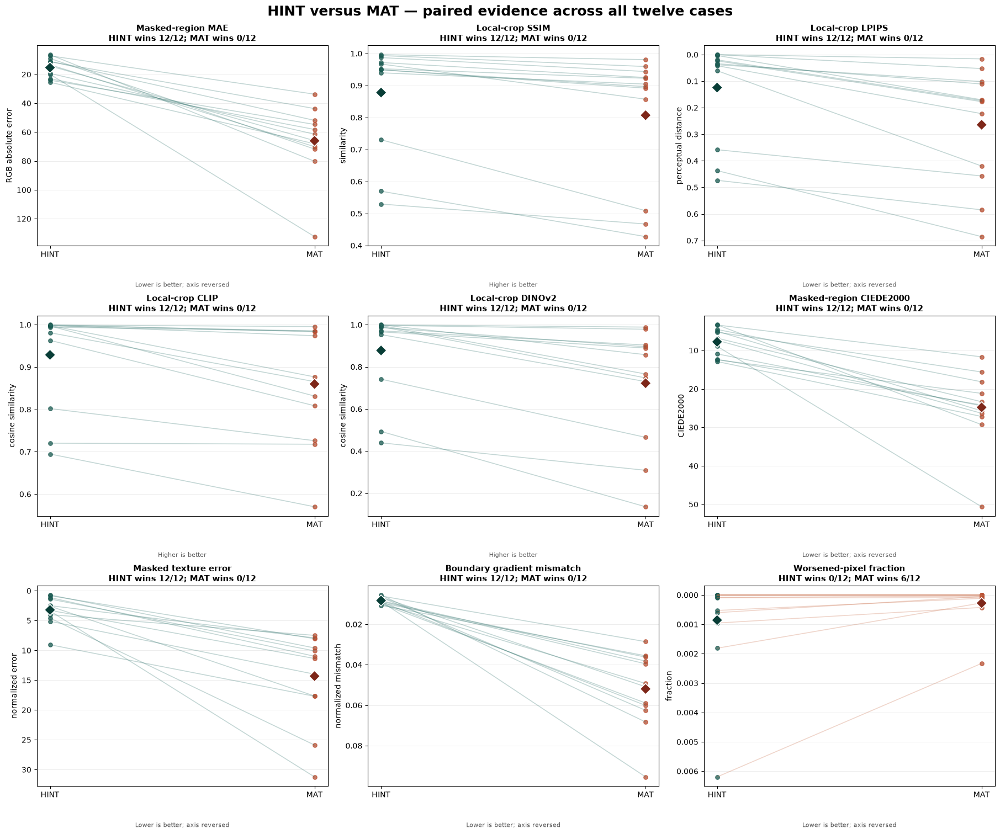

Metric figure: outputs\37_hint_mat_method_selection\figures\metric_comparison.png


In [41]:
METRIC_FIGURE_PATH = (
    OUTPUT_ROOT
    / CONFIG["output"]["metric_figure_path"]
)

fig, axes = plt.subplots(
    3,
    3,
    figsize=(18, 15),
    constrained_layout=True,
)

for axis, definition in zip(
    axes.flat,
    ANCHOR_DEFINITIONS,
):
    subset = PAIRED_ANCHOR_COMPARISONS.loc[
        PAIRED_ANCHOR_COMPARISONS[
            "anchor_id"
        ].eq(definition["anchor_id"])
    ]

    for row in subset.itertuples(index=False):
        hint_better = row.winner == "hint"

        axis.plot(
            [0, 1],
            [
                row.hint_value,
                row.mat_value,
            ],
            color=(
                "#2b6f68"
                if hint_better
                else "#c86b45"
            ),
            alpha=0.28,
            linewidth=1.2,
        )

    hint_values = subset["hint_value"]
    mat_values = subset["mat_value"]

    axis.scatter(
        np.zeros(len(subset)),
        hint_values,
        color="#19584f",
        s=28,
        alpha=0.75,
        label="HINT cases",
    )

    axis.scatter(
        np.ones(len(subset)),
        mat_values,
        color="#b84f32",
        s=28,
        alpha=0.75,
        label="MAT cases",
    )

    axis.scatter(
        [0, 1],
        [
            hint_values.mean(),
            mat_values.mean(),
        ],
        color=["#083d36", "#7e2719"],
        edgecolor="white",
        linewidth=1.2,
        marker="D",
        s=105,
        zorder=5,
    )

    if definition["direction"] == "lower_is_better":
        axis.invert_yaxis()
        direction_text = "Lower is better; axis reversed"
    else:
        direction_text = "Higher is better"

    win_row = ANCHOR_WIN_SUMMARY.loc[
        ANCHOR_WIN_SUMMARY[
            "anchor_id"
        ].eq(definition["anchor_id"])
    ].iloc[0]

    axis.set_title(
        f"{definition['label']}\n"
        f"HINT wins {int(win_row['hint_wins'])}/12; "
        f"MAT wins {int(win_row['mat_wins'])}/12",
        fontsize=11,
        fontweight="bold",
    )

    axis.set_xticks(
        [0, 1],
        ["HINT", "MAT"],
    )
    axis.set_ylabel(definition["unit"])
    axis.text(
        0.5,
        -0.18,
        direction_text,
        transform=axis.transAxes,
        ha="center",
        va="top",
        fontsize=8,
        color="#555555",
    )
    axis.grid(
        axis="y",
        alpha=0.22,
    )

fig.suptitle(
    "HINT versus MAT — paired evidence across all twelve cases",
    fontsize=18,
    fontweight="bold",
)

fig.savefig(
    METRIC_FIGURE_PATH,
    dpi=180,
    bbox_inches="tight",
)

plt.show()

print(
    "Metric figure:",
    METRIC_FIGURE_PATH.relative_to(
        PROJECT_ROOT
    ),
)

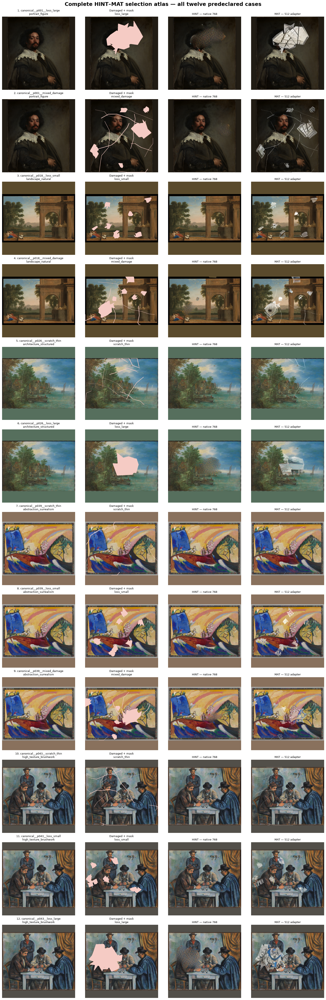

Complete atlas: outputs\37_hint_mat_method_selection\figures\selection_atlas.png
Cases shown: 12
Restorations shown: 24


In [42]:
ATLAS_FIGURE_PATH = (
    OUTPUT_ROOT
    / CONFIG["output"]["atlas_figure_path"]
)

atlas_rows = (
    SELECTION_SCOPE.sort_values(
        "selection_rank",
        kind="stable",
    )
)

fig, axes = plt.subplots(
    len(atlas_rows),
    4,
    figsize=(16, 48),
    constrained_layout=True,
)

for row_number, scope_row in enumerate(
    atlas_rows.itertuples(index=False)
):
    case_candidates = (
        N37_DIAGNOSTIC_WORKLIST.loc[
            N37_DIAGNOSTIC_WORKLIST[
                "case_id"
            ].eq(scope_row.case_id)
        ]
    )

    hint_candidate = (
        case_candidates.loc[
            case_candidates["model_id"].eq(
                HINT_ID
            )
        ]
        .iloc[0]
    )

    mat_candidate = (
        case_candidates.loc[
            case_candidates["model_id"].eq(
                MAT_ID
            )
        ]
        .iloc[0]
    )

    clean_path = Path(
        str(scope_row.clean_image_path)
    )
    damaged_path = Path(
        str(scope_row.input_image_path)
    )
    mask_path = Path(
        str(scope_row.mask_path)
    )

    if not clean_path.is_absolute():
        clean_path = PROJECT_ROOT / clean_path
    if not damaged_path.is_absolute():
        damaged_path = PROJECT_ROOT / damaged_path
    if not mask_path.is_absolute():
        mask_path = PROJECT_ROOT / mask_path

    with Image.open(clean_path) as image:
        clean_image = np.asarray(
            image.convert("RGB")
        )

    with Image.open(damaged_path) as image:
        damaged_image = np.asarray(
            image.convert("RGB")
        )

    with Image.open(mask_path) as image:
        active_mask = (
            np.asarray(
                image.convert("L")
            )
            >= 128
        )

    damaged_overlay = damaged_image.copy()
    overlay_colour = np.array(
        [220, 72, 45],
        dtype=np.float32,
    )

    damaged_overlay[
        active_mask
    ] = np.clip(
        0.72
        * damaged_overlay[
            active_mask
        ].astype(np.float32)
        + 0.28 * overlay_colour,
        0,
        255,
    ).astype(np.uint8)

    with Image.open(
        Path(str(hint_candidate["restored_path"]))
    ) as image:
        hint_image = np.asarray(
            image.convert("RGB")
        )

    with Image.open(
        Path(str(mat_candidate["restored_path"]))
    ) as image:
        mat_image = np.asarray(
            image.convert("RGB")
        )

    images = (
        clean_image,
        damaged_overlay,
        hint_image,
        mat_image,
    )

    titles = (
        (
            f"{scope_row.selection_rank}. "
            f"{scope_row.case_id}\n"
            f"{scope_row.category}"
        ),
        (
            f"Damaged + mask\n"
            f"{scope_row.damage_type}"
        ),
        "HINT — native 768",
        "MAT — 512 adapter",
    )

    for column, (image, title) in enumerate(
        zip(images, titles)
    ):
        axis = axes[row_number, column]
        axis.imshow(image)
        axis.set_title(
            title,
            fontsize=9,
        )
        axis.axis("off")

fig.suptitle(
    "Complete HINT–MAT selection atlas — all twelve predeclared cases",
    fontsize=18,
    fontweight="bold",
)

fig.savefig(
    ATLAS_FIGURE_PATH,
    dpi=160,
    bbox_inches="tight",
)

plt.show()

print(
    "Complete atlas:",
    ATLAS_FIGURE_PATH.relative_to(
        PROJECT_ROOT
    ),
)
print("Cases shown:", len(atlas_rows))
print("Restorations shown:", len(atlas_rows) * 2)

In [43]:
import base64
import html


REPORT_PATH = (
    OUTPUT_ROOT
    / CONFIG["output"]["report_path"]
)


def png_data_uri(path):
    encoded = base64.b64encode(
        Path(path).read_bytes()
    ).decode("ascii")

    return f"data:image/png;base64,{encoded}"


metric_figure_uri = png_data_uri(
    METRIC_FIGURE_PATH
)

atlas_figure_uri = png_data_uri(
    ATLAS_FIGURE_PATH
)

smoke_figure_uri = png_data_uri(
    OUTPUT_ROOT
    / CONFIG["output"]["smoke_figure_path"]
)

total_hint_wins = int(
    PAIRED_ANCHOR_COMPARISONS[
        "winner"
    ].eq("hint").sum()
)

total_mat_wins = int(
    PAIRED_ANCHOR_COMPARISONS[
        "winner"
    ].eq("mat").sum()
)

total_ties = int(
    PAIRED_ANCHOR_COMPARISONS[
        "winner"
    ].eq("tie").sum()
)

anchor_count = len(ANCHOR_DEFINITIONS)
comparison_count = len(
    PAIRED_ANCHOR_COMPARISONS
)

runtime_report = (
    EVALUATION_CANDIDATES.groupby(
        [
            "model_id",
            "model_label",
        ],
        as_index=False,
    )
    .agg(
        candidates=("candidate_id", "size"),
        mean_inference_seconds=(
            "inference_seconds",
            "mean",
        ),
        median_inference_seconds=(
            "inference_seconds",
            "median",
        ),
        maximum_gpu_memory_bytes=(
            "gpu_peak_memory_bytes",
            "max",
        ),
    )
)

runtime_report[
    "peak_gpu_memory_gib"
] = (
    runtime_report[
        "maximum_gpu_memory_bytes"
    ]
    / (1024 ** 3)
)

runtime_report = runtime_report.drop(
    columns=["maximum_gpu_memory_bytes"]
)

report_anchor_summary = (
    ANCHOR_SUMMARY.pivot(
        index=[
            "anchor_id",
            "anchor_label",
            "anchor_direction",
            "anchor_unit",
        ],
        columns="model_id",
        values="mean_value",
    )
    .reset_index()
    .rename(
        columns={
            HINT_ID: "HINT mean",
            MAT_ID: "MAT mean",
        }
    )
    .merge(
        ANCHOR_WIN_SUMMARY,
        on=[
            "anchor_id",
            "anchor_label",
        ],
        how="left",
        validate="one_to_one",
    )
)

report_anchor_summary = (
    report_anchor_summary[
        [
            "anchor_label",
            "anchor_direction",
            "anchor_unit",
            "HINT mean",
            "MAT mean",
            "hint_wins",
            "mat_wins",
            "ties",
        ]
    ]
)

anchor_table_html = (
    report_anchor_summary.to_html(
        index=False,
        border=0,
        classes="evidence-table",
        float_format=lambda value: f"{value:.4f}",
    )
)

runtime_table_html = runtime_report.to_html(
    index=False,
    border=0,
    classes="evidence-table",
    float_format=lambda value: f"{value:.3f}",
)

win_table_html = ANCHOR_WIN_SUMMARY.to_html(
    index=False,
    border=0,
    classes="evidence-table",
)

report_css = """
body {
    margin: 0;
    background: #eee8dc;
    color: #24231f;
    font-family: Georgia, "Times New Roman", serif;
}
main {
    max-width: 1180px;
    margin: 0 auto;
    padding: 42px;
    background: #f8f3e8;
}
h1, h2, h3 {
    color: #173f38;
}
h1 {
    margin-bottom: 4px;
    font-size: 38px;
}
.subtitle {
    color: #8b452c;
    font-style: italic;
    margin-bottom: 30px;
}
.callout {
    border-left: 6px solid #1d665b;
    background: #fffaf0;
    padding: 18px 22px;
    margin: 22px 0;
}
.warning {
    border-left-color: #b65032;
}
.grid {
    display: grid;
    grid-template-columns: repeat(3, 1fr);
    gap: 14px;
    margin: 20px 0;
}
.card {
    background: #fffaf0;
    border: 1px solid #cfc3ac;
    padding: 16px;
}
.card strong {
    display: block;
    color: #8b452c;
    font-size: 25px;
}
.evidence-table {
    width: 100%;
    border-collapse: collapse;
    margin: 16px 0 28px;
    font-family: Arial, sans-serif;
    font-size: 13px;
}
.evidence-table th {
    background: #16483f;
    color: white;
    padding: 9px;
}
.evidence-table td {
    border-bottom: 1px solid #d8cfbd;
    padding: 8px;
}
figure {
    margin: 28px 0;
}
figure img {
    display: block;
    width: 100%;
    border: 1px solid #b9ad98;
    background: white;
}
figcaption {
    margin-top: 8px;
    color: #625c50;
    font-style: italic;
}
li {
    margin-bottom: 8px;
}
footer {
    margin-top: 40px;
    border-top: 1px solid #b9ad98;
    padding-top: 15px;
    color: #625c50;
}
"""

report_html = f"""<!DOCTYPE html>
<html lang="en">
<head>
<meta charset="utf-8">
<meta name="viewport" content="width=device-width, initial-scale=1">
<title>HINT and MAT Method Selection</title>
<style>{report_css}</style>
</head>
<body>
<main>
<h1>HINT and MAT Method Selection</h1>
<p class="subtitle">
A controlled twelve-case pilot for choosing one additional learned
inpainting method for the planned expanded benchmark.
</p>

<section class="callout">
<h2>Provisional recommendation: HINT</h2>
<p>
HINT is the evidence-supported choice for the planned expanded run.
It produces substantially stronger reference, perceptual and feature
results and visibly cleaner thin-scratch repairs. The recommendation
remains provisional until the human-owned decision is written in
Batch 9.
</p>
</section>

<div class="grid">
<div class="card">
<strong>12</strong>
paired canonical cases
</div>
<div class="card">
<strong>{anchor_count}</strong>
separate evidence anchors
</div>
<div class="card">
<strong>{comparison_count}</strong>
within-case anchor comparisons
</div>
<div class="card">
<strong>{total_hint_wins}</strong>
HINT case-anchor wins
</div>
<div class="card">
<strong>{total_mat_wins}</strong>
MAT case-anchor wins
</div>
<div class="card">
<strong>{total_ties}</strong>
ties
</div>
</div>

<h2>What the evidence supports</h2>
<ul>
<li>
<strong>HINT is the stronger candidate for expansion.</strong>
Its advantage is visible across pixel, perceptual, feature, colour,
texture, seam and spatial evidence rather than depending on one score.
</li>
<li>
<strong>MAT completed technically but failed visually.</strong>
Its large-loss outputs frequently contain pale fragmented or
paper-like structures, while thin scratches often remain visible.
</li>
<li>
<strong>HINT is not a perfect restoration method.</strong>
Some large and mixed losses contain repeated geometric textures or
semantically weak completion because the checkpoint was trained on
photographic scenes rather than paintings.
</li>
<li>
<strong>No metric proves conservation suitability.</strong>
The evidence supports computational method selection for a controlled
benchmark, not approval of physical conservation treatment.
</li>
</ul>

<h2>Study design</h2>
<p>
The pilot contains twelve cases selected before metric computation.
It spans five broad visual categories and includes three cases from
each canonical damage family. Every case has one HINT output and one
MAT output. Painting is the independent unit; cases are repeated
observations nested within five paintings.
</p>

<figure>
<img src="{smoke_figure_uri}" alt="Paired smoke comparison">
<figcaption>
The initial smoke test already exposed the main distinction:
HINT removes thin scratches more cleanly, while MAT often retains
or replaces them with pale line artefacts.
</figcaption>
</figure>

<h2>Paired metric evidence</h2>
<p>
The plots retain each of the twelve paired comparisons. Lower-is-better
axes are reversed so upward placement consistently indicates better
performance. Diamond markers show model means; smaller points and
connecting lines preserve individual cases.
</p>

<figure>
<img src="{metric_figure_uri}" alt="Nine paired metric comparisons">
<figcaption>
Nine complementary anchors are shown separately. No combined quality,
trustworthiness or uncertainty score is constructed.
</figcaption>
</figure>

{anchor_table_html}

<h2>Anchor win counts</h2>
{win_table_html}

<h2>Runtime and technical feasibility</h2>
{runtime_table_html}

<p>
Both methods completed all twelve outputs, returned 768 × 768 RGB
images and preserved every outside-mask pixel. HINT ran natively at
768 pixels and required more GPU memory. MAT ran through the declared
512-pixel adapter and used its supported PyTorch fallback after its
optional Windows CUDA extensions could not compile.
</p>

<div class="callout warning">
<h3>Licensing boundary</h3>
<p>
HINT uses the permissive MIT software license. MAT is distributed
under CC-BY-NC-4.0 and remains suitable for this noncommercial thesis
pilot, but broader or commercial deployment would require a separate
license review.
</p>
</div>

<h2>Complete visual evidence</h2>
<p>
The atlas below shows every predeclared case. It is not a selection of
favourable examples. The damaged panel includes a coloured mask overlay
to make the repaired geometry visible.
</p>

<figure>
<img src="{atlas_figure_uri}" alt="Complete twelve-case HINT and MAT atlas">
<figcaption>
All twelve clean references, damaged inputs, HINT outputs and MAT
outputs. Visual review remains part of the final human decision.
</figcaption>
</figure>

<h2>Why HINT is preferred</h2>
<ul>
<li>
HINT restores thin scratches with much better continuity and far fewer
visible replacement lines.
</li>
<li>
HINT preserves reference-aligned structure more consistently according
to DINOv2 and local structural evidence.
</li>
<li>
HINT has substantially lower LPIPS distance, indicating closer
perceptual agreement with the reference.
</li>
<li>
HINT avoids MAT's most severe fragmented and paper-like large-loss
failures.
</li>
<li>
HINT's MIT license is simpler for later research software reuse.
</li>
</ul>

<h2>Remaining limitations</h2>
<ul>
<li>
This is a purposive twelve-case selection pilot, not a fourth
full-benchmark result.
</li>
<li>
The cases come from only five paintings and cannot establish
painting-domain generalization.
</li>
<li>
Both checkpoints were trained primarily on photographic scene data.
</li>
<li>
MAT's 512 adapter adds resampling that HINT avoided by running at 768.
</li>
<li>
Reference agreement does not establish historical authenticity,
expert acceptance or conservation safety.
</li>
</ul>

<footer>
Notebook 37 — HINT and MAT Method Selection.
Evidence families remain separate and the final selection is
human-owned.
</footer>
</main>
</body>
</html>
"""

REPORT_PATH.write_text(
    report_html,
    encoding="utf-8",
    newline="\n",
)

print(
    "Selection report:",
    REPORT_PATH.relative_to(PROJECT_ROOT),
)
print(
    "Report size MiB:",
    round(
        REPORT_PATH.stat().st_size
        / (1024 ** 2),
        3,
    ),
)
print("Embedded figures: 3")
print("Provisional recommendation: HINT")

Selection report: outputs\37_hint_mat_method_selection\reports\method_selection_report.html
Report size MiB: 16.914
Embedded figures: 3
Provisional recommendation: HINT


In [44]:
existing_validation = VALIDATION.to_dataframe()

VALIDATION = ValidationCollector()

for row in existing_validation.loc[
    ~existing_validation["validation_stage"].eq(
        "batch_8_analysis_report"
    )
].itertuples(index=False):
    VALIDATION.add(
        validation_stage=row.validation_stage,
        check_id=row.check_id,
        check_description=row.check_description,
        severity=row.severity,
        expected=row.expected,
        observed=row.observed,
        passed=bool(row.passed),
        details=row.details,
    )


def add_batch_8_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_8_analysis_report",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


add_batch_8_check(
    "paired_anchor_cardinality",
    (
        "Nine anchors each contain twelve paired "
        "case comparisons."
    ),
    {
        "anchors": 9,
        "comparisons": 108,
        "cases_per_anchor": 12,
    },
    {
        "anchors": (
            PAIRED_ANCHOR_COMPARISONS[
                "anchor_id"
            ].nunique()
        ),
        "comparisons": len(
            PAIRED_ANCHOR_COMPARISONS
        ),
        "minimum_cases": int(
            PAIRED_ANCHOR_COMPARISONS.groupby(
                "anchor_id"
            )["case_id"].nunique().min()
        ),
    },
    (
        len(PAIRED_ANCHOR_COMPARISONS) == 108
        and PAIRED_ANCHOR_COMPARISONS[
            "anchor_id"
        ].nunique() == 9
        and PAIRED_ANCHOR_COMPARISONS.groupby(
            "anchor_id"
        )["case_id"].nunique().eq(12).all()
    ),
)

add_batch_8_check(
    "scorecard_schema",
    (
        "The separate-criterion decision scorecard "
        "satisfies its declared schema."
    ),
    "schema passed",
    DECISION_SCORECARD_SCHEMA_RESULT.to_dict(),
    DECISION_SCORECARD_SCHEMA_RESULT.passed,
)

add_batch_8_check(
    "technical_hard_gates",
    (
        "Every technical hard gate passes for both "
        "methods before human selection."
    ),
    0,
    int(
        DECISION_SCORECARD.loc[
            DECISION_SCORECARD["hard_gate"]
        ]["gate_passed"]
        .eq(False)
        .sum()
    ),
    DECISION_SCORECARD.loc[
        DECISION_SCORECARD["hard_gate"]
    ]["gate_passed"].all(),
)

figure_audit_rows = []

for figure_path in (
    METRIC_FIGURE_PATH,
    ATLAS_FIGURE_PATH,
):
    try:
        with Image.open(figure_path) as image:
            image.verify()

        figure_audit_rows.append(
            {
                "path": str(
                    figure_path.relative_to(
                        PROJECT_ROOT
                    )
                ),
                "exists": True,
                "valid": True,
                "size_bytes": (
                    figure_path.stat().st_size
                ),
            }
        )
    except Exception as error:
        figure_audit_rows.append(
            {
                "path": str(figure_path),
                "exists": figure_path.is_file(),
                "valid": False,
                "size_bytes": 0,
                "issue": (
                    f"{type(error).__name__}: "
                    f"{error}"
                ),
            }
        )

FIGURE_AUDIT = pd.DataFrame(
    figure_audit_rows
)

add_batch_8_check(
    "canonical_figures",
    (
        "The metric comparison and complete atlas "
        "are valid non-empty PNG files."
    ),
    {
        "figures": 2,
        "valid": 2,
    },
    {
        "figures": len(FIGURE_AUDIT),
        "valid": int(
            FIGURE_AUDIT["valid"].sum()
        ),
    },
    (
        len(FIGURE_AUDIT) == 2
        and FIGURE_AUDIT["valid"].all()
        and FIGURE_AUDIT[
            "size_bytes"
        ].gt(0).all()
    ),
)

report_text = REPORT_PATH.read_text(
    encoding="utf-8"
)

report_required_phrases = [
    "Provisional recommendation: HINT",
    "Complete visual evidence",
    "Why HINT is preferred",
    "Remaining limitations",
    "data:image/png;base64,",
    "No combined quality",
]

missing_report_phrases = [
    phrase
    for phrase in report_required_phrases
    if phrase not in report_text
]

add_batch_8_check(
    "self_contained_report",
    (
        "The report contains the approved sections "
        "and embedded visual evidence."
    ),
    {
        "missing_phrases": [],
        "minimum_embedded_images": 3,
    },
    {
        "missing_phrases": (
            missing_report_phrases
        ),
        "embedded_images": report_text.count(
            "data:image/png;base64,"
        ),
        "size_bytes": REPORT_PATH.stat().st_size,
    },
    (
        not missing_report_phrases
        and report_text.count(
            "data:image/png;base64,"
        ) >= 3
        and REPORT_PATH.stat().st_size > 0
    ),
)

add_batch_8_check(
    "complete_visual_scope",
    (
        "The atlas represents all twelve cases and "
        "both restoration methods."
    ),
    {
        "cases": 12,
        "restorations": 24,
    },
    {
        "cases": len(atlas_rows),
        "restorations": len(atlas_rows) * 2,
    },
    (
        len(atlas_rows) == 12
        and len(atlas_rows) * 2 == 24
    ),
)

add_batch_8_check(
    "no_combined_score",
    (
        "Analysis retains anchor-level evidence "
        "without creating a combined score."
    ),
    False,
    any(
        "combined_score" in column.lower()
        for column in (
            list(PAIRED_ANCHOR_COMPARISONS.columns)
            + list(DECISION_SCORECARD.columns)
        )
    ),
    not any(
        "combined_score" in column.lower()
        for column in (
            list(PAIRED_ANCHOR_COMPARISONS.columns)
            + list(DECISION_SCORECARD.columns)
        )
    ),
)

DECISION_PATH = (
    OUTPUT_ROOT
    / CONFIG["output"]["decision_path"]
)

add_batch_8_check(
    "human_decision_not_premature",
    (
        "The final human-owned selection JSON has "
        "not been written before Batch 9."
    ),
    False,
    DECISION_PATH.exists(),
    not DECISION_PATH.exists(),
)

BATCH_1_8_CHECKS_PATH = (
    OUTPUT_ROOT
    / "work"
    / "batch_1_8_validation_checks.csv"
)

BATCH_1_8_CHECKS = VALIDATION.to_dataframe()

atomic_write_csv(
    BATCH_1_8_CHECKS,
    BATCH_1_8_CHECKS_PATH,
)

BATCH_8_CHECKS = (
    BATCH_1_8_CHECKS.loc[
        BATCH_1_8_CHECKS[
            "validation_stage"
        ].eq("batch_8_analysis_report")
    ]
    .reset_index(drop=True)
)

BATCH_8_FAILED = BATCH_8_CHECKS.loc[
    (~BATCH_8_CHECKS["passed"])
    & BATCH_8_CHECKS["severity"].isin(
        [
            "error",
            "blocking",
        ]
    )
]

BATCH_8_PASSED = BATCH_8_FAILED.empty

display(FIGURE_AUDIT)
display(BATCH_8_CHECKS)

print("Batch 8 checks:", len(BATCH_8_CHECKS))
print(
    "Batch 8 blocking/error failures:",
    len(BATCH_8_FAILED),
)
print(
    "HINT case-anchor wins:",
    total_hint_wins,
)
print(
    "MAT case-anchor wins:",
    total_mat_wins,
)
print("Complete atlas cases:", len(atlas_rows))
print(
    "Report:",
    REPORT_PATH.relative_to(PROJECT_ROOT),
)

if BATCH_8_PASSED:
    print(
        "BATCH 8 PASSED - paired analysis, complete "
        "atlas, and selection report are ready."
    )
    print(
        "Provisional recommendation: HINT. "
        "Batch 9 will record the human decision."
    )
else:
    print(
        "BATCH 8 FAILED - do not write the final "
        "selection decision."
    )
    display(BATCH_8_FAILED)

,path,exists,valid,size_bytes
0,outputs\37_hint_mat_method_selection\figures\m...,True,True,880306
1,outputs\37_hint_mat_method_selection\figures\s...,True,True,7287965


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_8_analysis_report,paired_anchor_cardinality,Nine anchors each contain twelve paired case c...,blocking,"{""anchors"": 9, ""cases_per_anchor"": 12, ""compar...","{""anchors"": 9, ""comparisons"": 108, ""minimum_ca...",True,
1,batch_8_analysis_report,scorecard_schema,The separate-criterion decision scorecard sati...,blocking,schema passed,"{""column_count"": 13, ""duplicate_primary_key_ro...",True,
2,batch_8_analysis_report,technical_hard_gates,Every technical hard gate passes for both meth...,blocking,0,0,True,
3,batch_8_analysis_report,canonical_figures,The metric comparison and complete atlas are v...,blocking,"{""figures"": 2, ""valid"": 2}","{""figures"": 2, ""valid"": 2}",True,
4,batch_8_analysis_report,self_contained_report,The report contains the approved sections and ...,blocking,"{""minimum_embedded_images"": 3, ""missing_phrase...","{""embedded_images"": 3, ""missing_phrases"": [], ...",True,
5,batch_8_analysis_report,complete_visual_scope,The atlas represents all twelve cases and both...,blocking,"{""cases"": 12, ""restorations"": 24}","{""cases"": 12, ""restorations"": 24}",True,
6,batch_8_analysis_report,no_combined_score,Analysis retains anchor-level evidence without...,blocking,False,False,True,
7,batch_8_analysis_report,human_decision_not_premature,The final human-owned selection JSON has not b...,blocking,False,False,True,


Batch 8 checks: 8
Batch 8 blocking/error failures: 0
HINT case-anchor wins: 96
MAT case-anchor wins: 6
Complete atlas cases: 12
Report: outputs\37_hint_mat_method_selection\reports\method_selection_report.html
BATCH 8 PASSED - paired analysis, complete atlas, and selection report are ready.
Provisional recommendation: HINT. Batch 9 will record the human decision.


## Batch 9 — Final human selection, canonical persistence, and completion gate

This batch:

- records the approved human-owned selection of HINT;
- persists and reloads every canonical table;
- changes the report recommendation from provisional to final;
- removes temporary working artifacts;
- writes the artifact and run manifests;
- performs an independent final verification.

The decision selects HINT for the planned expanded benchmark. It does not convert this twelve-case pilot into a fourth full-benchmark comparison.

In [45]:
import shutil

from restoration_eval.hint_mat_selection import (
    atomic_write_json,
)
from restoration_eval.manifests import (
    ARTIFACT_MANIFEST_SCHEMA_VERSION,
    MANIFESTS_MODULE_VERSION,
    RUN_MANIFEST_SCHEMA_VERSION,
    build_artifact_record,
    build_run_manifest,
    sha256_file,
    sha256_path,
    write_artifact_manifest,
    write_run_manifest,
)
from restoration_eval.validation import (
    VALIDATION_MODULE_VERSION,
)


if not BATCH_8_PASSED:
    raise RuntimeError(
        "Batch 8 did not pass. Do not finalize "
        "Notebook 37."
    )

NOTEBOOK_ID = "37"
NOTEBOOK_STEM = "37_hint_mat_method_selection"
EXPERIMENT_ID = "hint_mat_method_selection"
DATASET_SCOPE = "controlled_50_method_selection_pilot"

FINAL_PATHS = {
    key: (OUTPUT_ROOT / value).resolve()
    for key, value in CONFIG["output"].items()
    if key not in {
        "notebook_id",
        "notebook_stem",
        "output_root",
        "work_directory",
        "hint_restored_directory",
        "mat_restored_directory",
    }
}

FINAL_PATHS["hint_restored"] = (
    OUTPUT_ROOT
    / CONFIG["output"]["hint_restored_directory"]
).resolve()

FINAL_PATHS["mat_restored"] = (
    OUTPUT_ROOT
    / CONFIG["output"]["mat_restored_directory"]
).resolve()

FINAL_PATHS["diagnostic_maps"] = (
    OUTPUT_ROOT / "images" / "maps"
).resolve()


def portable_repository_path(value):
    path = Path(str(value))

    if not path.is_absolute():
        return path.as_posix()

    resolved = path.resolve()

    if (
        resolved == PROJECT_ROOT
        or PROJECT_ROOT in resolved.parents
    ):
        return resolved.relative_to(
            PROJECT_ROOT
        ).as_posix()

    return str(resolved)


SELECTION_SCOPE_CANONICAL = (
    SELECTION_SCOPE.copy()
    .sort_values("selection_rank")
    .reset_index(drop=True)
)

for column in (
    "input_image_path",
    "clean_image_path",
    "mask_path",
    "source_manifest_path",
):
    SELECTION_SCOPE_CANONICAL[column] = (
        SELECTION_SCOPE_CANONICAL[column]
        .map(portable_repository_path)
    )

CANDIDATES_CANONICAL = (
    pd.concat(
        [
            HINT_FULL_CANDIDATES,
            MAT_FULL_CANDIDATES,
        ],
        ignore_index=True,
    )
    .sort_values(
        [
            "selection_rank",
            "model_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

for column in (
    "input_image_path",
    "clean_image_path",
    "mask_path",
    "restored_path",
):
    CANDIDATES_CANONICAL[column] = (
        CANDIDATES_CANONICAL[column]
        .map(portable_repository_path)
    )

METRIC_VALUES_CANONICAL = (
    ALL_METRIC_VALUES.copy()
    .sort_values(
        [
            "candidate_id",
            "metric_family",
            "metric_name",
            "region_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

DECISION_SCORECARD_CANONICAL = (
    DECISION_SCORECARD.copy()
    .sort_values(
        [
            "criterion_family",
            "criterion_id",
            "model_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

parent_runtime_lookup = {
    HINT_ID: float(
        HINT_FULL_PROCESS.runtime_seconds
    ),
    MAT_ID: float(
        MAT_FULL_PROCESS.runtime_seconds
    ),
}

runtime_rows = []

for (
    model_id,
    model_label,
), group in CANDIDATES_CANONICAL.groupby(
    [
        "model_id",
        "model_label",
    ],
    sort=True,
):
    inference_values = pd.to_numeric(
        group["inference_seconds"],
        errors="coerce",
    )

    runtime_values = pd.to_numeric(
        group["runtime_seconds"],
        errors="coerce",
    )

    gpu_values = pd.to_numeric(
        group["gpu_peak_memory_bytes"],
        errors="coerce",
    )

    load_values = pd.to_numeric(
        group["model_load_seconds"],
        errors="coerce",
    )

    runtime_rows.append(
        {
            "model_id": str(model_id),
            "model_label": str(model_label),
            "candidate_count": int(len(group)),
            "completed_count": int(
                group["status"].eq("completed").sum()
            ),
            "inference_width": int(
                pd.to_numeric(
                    group["inference_width"],
                    errors="raise",
                ).iloc[0]
            ),
            "output_width": int(
                pd.to_numeric(
                    group["output_width"],
                    errors="raise",
                ).iloc[0]
            ),
            "model_load_seconds": float(
                load_values.max()
            ),
            "mean_inference_seconds": float(
                inference_values.mean()
            ),
            "median_inference_seconds": float(
                inference_values.median()
            ),
            "minimum_inference_seconds": float(
                inference_values.min()
            ),
            "maximum_inference_seconds": float(
                inference_values.max()
            ),
            "total_inference_seconds": float(
                inference_values.sum()
            ),
            "mean_candidate_runtime_seconds": float(
                runtime_values.mean()
            ),
            "parent_observed_runtime_seconds": (
                parent_runtime_lookup[str(model_id)]
            ),
            "peak_gpu_memory_bytes": int(
                gpu_values.max()
            ),
            "peak_gpu_memory_gib": float(
                gpu_values.max() / (1024 ** 3)
            ),
            "outside_mask_changed_pixels": int(
                pd.to_numeric(
                    group[
                        "outside_mask_changed_pixels"
                    ],
                    errors="coerce",
                ).fillna(0).sum()
            ),
            "technical_validation_passed": bool(
                group[
                    "technical_validation_passed"
                ]
                .astype(str)
                .str.casefold()
                .eq("true")
                .all()
            ),
            "adapter_policy": str(
                group["adapter_policy"].iloc[0]
            ),
            "license": str(
                group["license"].iloc[0]
            ),
            "status": (
                "completed"
                if group["status"]
                .eq("completed").all()
                else "partial"
            ),
        }
    )

RUNTIME_SUMMARY_CANONICAL = pd.DataFrame(
    runtime_rows
)

CANONICAL_SCHEMA_RESULTS = {
    "selection_scope": validate_dataframe(
        SELECTION_SCOPE_CANONICAL,
        get_schema("hint_mat_selection_scope"),
    ),
    "candidates": validate_dataframe(
        CANDIDATES_CANONICAL,
        get_schema("hint_mat_candidates"),
    ),
    "metric_values": validate_dataframe(
        METRIC_VALUES_CANONICAL,
        get_schema("hint_mat_metric_values"),
    ),
    "decision_scorecard": validate_dataframe(
        DECISION_SCORECARD_CANONICAL,
        get_schema("hint_mat_decision_scorecard"),
    ),
}

failed_schemas = {
    key: result.to_dict()
    for key, result in (
        CANONICAL_SCHEMA_RESULTS.items()
    )
    if not result.passed
}

if failed_schemas:
    raise ValueError(
        "Canonical schema validation failed: "
        f"{failed_schemas}"
    )

atomic_write_csv(
    SELECTION_SCOPE_CANONICAL,
    FINAL_PATHS["selection_scope_path"],
)

atomic_write_csv(
    CANDIDATES_CANONICAL,
    FINAL_PATHS["candidates_path"],
)

atomic_write_csv(
    METRIC_VALUES_CANONICAL,
    FINAL_PATHS["metric_values_path"],
)

atomic_write_csv(
    RUNTIME_SUMMARY_CANONICAL,
    FINAL_PATHS["runtime_summary_path"],
)

atomic_write_csv(
    DECISION_SCORECARD_CANONICAL,
    FINAL_PATHS["decision_scorecard_path"],
)

RELOADED_SELECTION_SCOPE = pd.read_csv(
    FINAL_PATHS["selection_scope_path"],
    keep_default_na=False,
)

RELOADED_CANDIDATES = pd.read_csv(
    FINAL_PATHS["candidates_path"],
    keep_default_na=False,
)

RELOADED_METRIC_VALUES = pd.read_csv(
    FINAL_PATHS["metric_values_path"],
    keep_default_na=False,
)

RELOADED_RUNTIME_SUMMARY = pd.read_csv(
    FINAL_PATHS["runtime_summary_path"],
    keep_default_na=False,
)

RELOADED_DECISION_SCORECARD = pd.read_csv(
    FINAL_PATHS["decision_scorecard_path"],
    keep_default_na=False,
)

print("Canonical tables persisted and reloaded.")
print(
    "Selection cases:",
    len(RELOADED_SELECTION_SCOPE),
)
print(
    "Candidates:",
    len(RELOADED_CANDIDATES),
)
print(
    "Metric rows:",
    len(RELOADED_METRIC_VALUES),
)
print(
    "Runtime rows:",
    len(RELOADED_RUNTIME_SUMMARY),
)
print(
    "Scorecard rows:",
    len(RELOADED_DECISION_SCORECARD),
)

display(RELOADED_RUNTIME_SUMMARY)

Canonical tables persisted and reloaded.
Selection cases: 12
Candidates: 24
Metric rows: 15552
Runtime rows: 2
Scorecard rows: 30


,model_id,model_label,candidate_count,completed_count,inference_width,output_width,model_load_seconds,mean_inference_seconds,median_inference_seconds,minimum_inference_seconds,...,total_inference_seconds,mean_candidate_runtime_seconds,parent_observed_runtime_seconds,peak_gpu_memory_bytes,peak_gpu_memory_gib,outside_mask_changed_pixels,technical_validation_passed,adapter_policy,license,status
0,hint_places2,HINT,12,12,768,768,6.011,8.258333,6.8570,6.352,...,99.100,8.854917,127.186,5432973312,5.059851,0,True,native_768_then_512_resize_adapter_if_required.v1,MIT,completed
1,mat_places_512_fulldata,MAT,12,12,512,768,14.183,10.001250,8.0205,7.653,...,120.015,10.624667,158.847,1324408832,1.233452,0,True,resize_768_to_512_then_restore_and_exact_compo...,CC-BY-NC-4.0,completed


In [46]:
DECISION_PATH = FINAL_PATHS["decision_path"]

FINAL_SELECTION_DECISION = {
    "schema_version": (
        CONFIG["schema_versions"][
            "selection_decision"
        ]
    ),
    "notebook_id": NOTEBOOK_ID,
    "notebook_stem": NOTEBOOK_STEM,
    "experiment_id": EXPERIMENT_ID,
    "decision_status": "selected",
    "selected_method": "hint",
    "selected_model_id": HINT_ID,
    "selected_model_label": "HINT",
    "rejected_model_id": MAT_ID,
    "rejected_model_label": "MAT",
    "decision_owner": "researcher",
    "decision_recorded_at_utc": utc_now_iso(),
    "pilot_scope": {
        "paintings": int(
            SELECTION_SCOPE_CANONICAL[
                "painting_id"
            ].nunique()
        ),
        "cases": int(
            len(SELECTION_SCOPE_CANONICAL)
        ),
        "candidates": int(
            len(CANDIDATES_CANONICAL)
        ),
        "damage_families": int(
            SELECTION_SCOPE_CANONICAL[
                "damage_type"
            ].nunique()
        ),
        "visual_categories": int(
            SELECTION_SCOPE_CANONICAL[
                "category"
            ].nunique()
        ),
    },
    "paired_evidence": {
        "separate_anchor_count": int(
            len(ANCHOR_DEFINITIONS)
        ),
        "paired_comparison_count": int(
            len(PAIRED_ANCHOR_COMPARISONS)
        ),
        "hint_case_anchor_wins": int(
            PAIRED_ANCHOR_COMPARISONS[
                "winner"
            ].eq("hint").sum()
        ),
        "mat_case_anchor_wins": int(
            PAIRED_ANCHOR_COMPARISONS[
                "winner"
            ].eq("mat").sum()
        ),
        "ties": int(
            PAIRED_ANCHOR_COMPARISONS[
                "winner"
            ].eq("tie").sum()
        ),
        "combined_score_constructed": False,
    },
    "human_visual_assessment": [
        (
            "HINT removed thin scratches more cleanly "
            "and retained stronger local continuity."
        ),
        (
            "MAT frequently retained thin lines or "
            "introduced pale fragmented structures."
        ),
        (
            "HINT remained imperfect on some large "
            "and mixed losses."
        ),
    ],
    "selection_rationale": [
        (
            "HINT won all twelve paired cases on "
            "eight of the nine selected anchors."
        ),
        (
            "Its advantage covered reference, "
            "perceptual, feature, colour, texture "
            "and boundary evidence."
        ),
        (
            "HINT completed all cases at native "
            "768 by 768 resolution."
        ),
        (
            "HINT's MIT software license is simpler "
            "for continued research reuse."
        ),
    ],
    "limitations": [
        *CONFIG["known_limitations"],
        (
            "Selection for expansion does not make "
            "HINT a conservation-approved method."
        ),
    ],
    "future_benchmark_role": (
        "Selected additional learned inpainting "
        "method for the planned 300-painting expansion."
    ),
}

atomic_write_json(
    DECISION_PATH,
    FINAL_SELECTION_DECISION,
)

REPORT_PATH = FINAL_PATHS["report_path"]

final_report_text = REPORT_PATH.read_text(
    encoding="utf-8"
)

final_report_text = final_report_text.replace(
    "Provisional recommendation: HINT",
    "Final human selection: HINT",
)

final_report_text = final_report_text.replace(
    (
        "The recommendation remains provisional "
        "until the human-owned decision is written "
        "in Batch 9."
    ),
    (
        "The human-owned decision is recorded in "
        "selection_decision.json. HINT is selected "
        "for the planned expanded benchmark."
    ),
)

final_report_text = final_report_text.replace(
    (
        "Evidence families remain separate and the "
        "final selection is\nhuman-owned."
    ),
    (
        "Evidence families remain separate. The "
        "human-owned final selection is HINT."
    ),
)

REPORT_PATH.write_text(
    final_report_text,
    encoding="utf-8",
    newline="\n",
)

with DECISION_PATH.open(
    "r",
    encoding="utf-8-sig",
) as handle:
    RELOADED_SELECTION_DECISION = json.load(
        handle
    )

reloaded_report_text = REPORT_PATH.read_text(
    encoding="utf-8"
)

if (
    RELOADED_SELECTION_DECISION[
        "selected_model_id"
    ] != HINT_ID
):
    raise ValueError(
        "The persisted human decision does not "
        "select HINT."
    )

if "Final human selection: HINT" not in (
    reloaded_report_text
):
    raise ValueError(
        "The report was not updated to the final "
        "HINT selection."
    )

if "Provisional recommendation: HINT" in (
    reloaded_report_text
):
    raise ValueError(
        "The report still contains the provisional "
        "recommendation heading."
    )

print("Final human selection recorded: HINT")
print(
    "Decision:",
    DECISION_PATH.relative_to(PROJECT_ROOT),
)
print(
    "Final report:",
    REPORT_PATH.relative_to(PROJECT_ROOT),
)
print(
    "HINT wins:",
    FINAL_SELECTION_DECISION[
        "paired_evidence"
    ]["hint_case_anchor_wins"],
)
print(
    "MAT wins:",
    FINAL_SELECTION_DECISION[
        "paired_evidence"
    ]["mat_case_anchor_wins"],
)
print(
    "Ties:",
    FINAL_SELECTION_DECISION[
        "paired_evidence"
    ]["ties"],
)

Final human selection recorded: HINT
Decision: outputs\37_hint_mat_method_selection\reports\selection_decision.json
Final report: outputs\37_hint_mat_method_selection\reports\method_selection_report.html
HINT wins: 96
MAT wins: 6
Ties: 6


In [47]:
ROADMAP_TRACEABILITY = pd.DataFrame(
    [
        {
            "responsibility_id": "n37_r01",
            "responsibility": (
                "Predeclared balanced paired pilot"
            ),
            "passed": (
                len(RELOADED_SELECTION_SCOPE) == 12
            ),
        },
        {
            "responsibility_id": "n37_r02",
            "responsibility": (
                "Official HINT and MAT checkpoints"
            ),
            "passed": bool(
                EXTERNAL_ASSET_AUDIT[
                    "ready"
                ].all()
            ),
        },
        {
            "responsibility_id": "n37_r03",
            "responsibility": (
                "Twenty-four technically valid outputs"
            ),
            "passed": (
                len(RELOADED_CANDIDATES) == 24
                and RELOADED_CANDIDATES[
                    "status"
                ].eq("completed").all()
            ),
        },
        {
            "responsibility_id": "n37_r04",
            "responsibility": (
                "Exact outside-mask preservation"
            ),
            "passed": (
                pd.to_numeric(
                    RELOADED_CANDIDATES[
                        "outside_mask_changed_pixels"
                    ],
                    errors="coerce",
                ).fillna(-1).eq(0).all()
            ),
        },
        {
            "responsibility_id": "n37_r05",
            "responsibility": (
                "Reference, perceptual, and feature evidence"
            ),
            "passed": bool(BATCH_6_PASSED),
        },
        {
            "responsibility_id": "n37_r06",
            "responsibility": (
                "Texture, colour, seam, semantic, "
                "and spatial diagnostics"
            ),
            "passed": bool(BATCH_7_PASSED),
        },
        {
            "responsibility_id": "n37_r07",
            "responsibility": (
                "Runtime and GPU-memory evidence"
            ),
            "passed": (
                len(RELOADED_RUNTIME_SUMMARY) == 2
            ),
        },
        {
            "responsibility_id": "n37_r08",
            "responsibility": (
                "Complete twelve-case visual atlas"
            ),
            "passed": (
                FINAL_PATHS[
                    "atlas_figure_path"
                ].is_file()
            ),
        },
        {
            "responsibility_id": "n37_r09",
            "responsibility": (
                "Self-contained selection report"
            ),
            "passed": (
                reloaded_report_text.count(
                    "data:image/png;base64,"
                ) >= 3
            ),
        },
        {
            "responsibility_id": "n37_r10",
            "responsibility": (
                "Human-owned final selection"
            ),
            "passed": (
                RELOADED_SELECTION_DECISION[
                    "selected_model_id"
                ] == HINT_ID
            ),
        },
        {
            "responsibility_id": "n37_r11",
            "responsibility": (
                "No combined quality or trustworthiness score"
            ),
            "passed": (
                not CONFIG["evaluation"][
                    "construct_combined_score"
                ]
            ),
        },
        {
            "responsibility_id": "n37_r12",
            "responsibility": (
                "Pilot remains separate from frozen benchmark"
            ),
            "passed": (
                RELOADED_SELECTION_DECISION[
                    "pilot_scope"
                ]["cases"] == 12
            ),
        },
    ]
)

WORK_DIRECTORY = (
    OUTPUT_ROOT
    / CONFIG["output"]["work_directory"]
)

if WORK_DIRECTORY.exists():
    shutil.rmtree(WORK_DIRECTORY)

repository_path_columns = (
    "input_image_path",
    "clean_image_path",
    "mask_path",
    "restored_path",
)

portable_paths_passed = all(
    not Path(str(value)).is_absolute()
    for column in repository_path_columns
    for value in RELOADED_CANDIDATES[
        column
    ].tolist()
)

existing_checks = VALIDATION.to_dataframe()

VALIDATION = ValidationCollector()

for row in existing_checks.loc[
    ~existing_checks[
        "validation_stage"
    ].eq("batch_9_finalization")
].itertuples(index=False):
    VALIDATION.add(
        validation_stage=row.validation_stage,
        check_id=row.check_id,
        check_description=row.check_description,
        severity=row.severity,
        expected=row.expected,
        observed=row.observed,
        passed=bool(row.passed),
        details=row.details,
    )


def add_final_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_9_finalization",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


add_final_check(
    "prior_batches",
    "Batches 1 through 8 retain no blocking failure.",
    0,
    len(
        BATCH_1_8_CHECKS.loc[
            (~BATCH_1_8_CHECKS["passed"])
            & BATCH_1_8_CHECKS[
                "severity"
            ].isin(["blocking", "error"])
        ]
    ),
    not (
        (~BATCH_1_8_CHECKS["passed"])
        & BATCH_1_8_CHECKS[
            "severity"
        ].isin(["blocking", "error"])
    ).any(),
)

add_final_check(
    "canonical_table_schemas",
    "All schema-controlled canonical tables pass.",
    {},
    failed_schemas,
    not failed_schemas,
)

add_final_check(
    "canonical_population",
    (
        "Canonical tables retain 12 cases, "
        "24 candidates and 2 runtime rows."
    ),
    {
        "cases": 12,
        "candidates": 24,
        "runtime_rows": 2,
    },
    {
        "cases": len(RELOADED_SELECTION_SCOPE),
        "candidates": len(RELOADED_CANDIDATES),
        "runtime_rows": len(
            RELOADED_RUNTIME_SUMMARY
        ),
    },
    (
        len(RELOADED_SELECTION_SCOPE) == 12
        and len(RELOADED_CANDIDATES) == 24
        and len(RELOADED_RUNTIME_SUMMARY) == 2
    ),
)

add_final_check(
    "complete_metric_evidence",
    (
        "The canonical metric table retains all "
        "Batch 7 evidence."
    ),
    len(ALL_METRIC_VALUES),
    len(RELOADED_METRIC_VALUES),
    (
        len(RELOADED_METRIC_VALUES)
        == len(ALL_METRIC_VALUES)
    ),
)

add_final_check(
    "portable_repository_paths",
    (
        "Repository-owned candidate paths are "
        "stored repository-relative."
    ),
    True,
    portable_paths_passed,
    portable_paths_passed,
)

add_final_check(
    "restoration_files",
    (
        "All 24 canonical restoration paths "
        "resolve to existing files."
    ),
    24,
    sum(
        (
            PROJECT_ROOT / path
        ).is_file()
        for path in RELOADED_CANDIDATES[
            "restored_path"
        ]
    ),
    all(
        (
            PROJECT_ROOT / path
        ).is_file()
        for path in RELOADED_CANDIDATES[
            "restored_path"
        ]
    ),
)

add_final_check(
    "human_selection",
    (
        "The final human-owned decision selects "
        "HINT."
    ),
    HINT_ID,
    RELOADED_SELECTION_DECISION[
        "selected_model_id"
    ],
    (
        RELOADED_SELECTION_DECISION[
            "selected_model_id"
        ] == HINT_ID
    ),
)

add_final_check(
    "final_report",
    (
        "The self-contained report states the "
        "final HINT selection."
    ),
    {
        "final_heading": True,
        "embedded_images": 3,
    },
    {
        "final_heading": (
            "Final human selection: HINT"
            in reloaded_report_text
        ),
        "embedded_images": (
            reloaded_report_text.count(
                "data:image/png;base64,"
            )
        ),
    },
    (
        "Final human selection: HINT"
        in reloaded_report_text
        and reloaded_report_text.count(
            "data:image/png;base64,"
        ) >= 3
    ),
)

add_final_check(
    "roadmap_traceability",
    (
        "Every Notebook 37 responsibility "
        "is satisfied."
    ),
    12,
    int(ROADMAP_TRACEABILITY["passed"].sum()),
    (
        len(ROADMAP_TRACEABILITY) == 12
        and ROADMAP_TRACEABILITY[
            "passed"
        ].all()
    ),
)

add_final_check(
    "temporary_cleanup",
    (
        "Temporary work artifacts are absent "
        "from the final output tree."
    ),
    False,
    WORK_DIRECTORY.exists(),
    not WORK_DIRECTORY.exists(),
)

FINAL_VALIDATION = VALIDATION.to_dataframe()

FINAL_VALIDATION_SCHEMA = validate_dataframe(
    FINAL_VALIDATION,
    get_schema("validation_checks"),
)

if not FINAL_VALIDATION_SCHEMA.passed:
    raise ValueError(
        "Final validation-table schema failed: "
        f"{FINAL_VALIDATION_SCHEMA.to_dict()}"
    )

FINAL_BLOCKING_FAILURES = FINAL_VALIDATION.loc[
    (~FINAL_VALIDATION["passed"])
    & FINAL_VALIDATION["severity"].isin(
        ["blocking", "error"]
    )
]

if not FINAL_BLOCKING_FAILURES.empty:
    display(FINAL_BLOCKING_FAILURES)
    raise RuntimeError(
        "Notebook 37 final validation failed."
    )

atomic_write_csv(
    FINAL_VALIDATION,
    FINAL_PATHS["validation_path"],
)

display(ROADMAP_TRACEABILITY)
display(
    FINAL_VALIDATION.loc[
        FINAL_VALIDATION[
            "validation_stage"
        ].eq("batch_9_finalization")
    ]
)

print("Final validation rows:", len(FINAL_VALIDATION))
print("Blocking failures:", len(FINAL_BLOCKING_FAILURES))
print("Roadmap responsibilities passed: 12/12")
print("Temporary work directory removed.")

,responsibility_id,responsibility,passed
0,n37_r01,Predeclared balanced paired pilot,True
1,n37_r02,Official HINT and MAT checkpoints,True
2,n37_r03,Twenty-four technically valid outputs,True
3,n37_r04,Exact outside-mask preservation,True
4,n37_r05,"Reference, perceptual, and feature evidence",True
5,n37_r06,"Texture, colour, seam, semantic, and spatial d...",True
6,n37_r07,Runtime and GPU-memory evidence,True
7,n37_r08,Complete twelve-case visual atlas,True
8,n37_r09,Self-contained selection report,True
9,n37_r10,Human-owned final selection,True


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
84,batch_9_finalization,prior_batches,Batches 1 through 8 retain no blocking failure.,blocking,0,0,True,
85,batch_9_finalization,canonical_table_schemas,All schema-controlled canonical tables pass.,blocking,{},{},True,
86,batch_9_finalization,canonical_population,"Canonical tables retain 12 cases, 24 candidate...",blocking,"{""candidates"": 24, ""cases"": 12, ""runtime_rows""...","{""candidates"": 24, ""cases"": 12, ""runtime_rows""...",True,
87,batch_9_finalization,complete_metric_evidence,The canonical metric table retains all Batch 7...,blocking,15552,15552,True,
88,batch_9_finalization,portable_repository_paths,Repository-owned candidate paths are stored re...,blocking,True,True,True,
89,batch_9_finalization,restoration_files,All 24 canonical restoration paths resolve to ...,blocking,24,24,True,
90,batch_9_finalization,human_selection,The final human-owned decision selects HINT.,blocking,hint_places2,hint_places2,True,
91,batch_9_finalization,final_report,The self-contained report states the final HIN...,blocking,"{""embedded_images"": 3, ""final_heading"": true}","{""embedded_images"": 3, ""final_heading"": true}",True,
92,batch_9_finalization,roadmap_traceability,Every Notebook 37 responsibility is satisfied.,blocking,12,12,True,
93,batch_9_finalization,temporary_cleanup,Temporary work artifacts are absent from the f...,blocking,False,False,True,


Final validation rows: 94
Blocking failures: 0
Roadmap responsibilities passed: 12/12
Temporary work directory removed.


In [48]:
ARTIFACT_SPECS = [
    (
        "selection_scope",
        FINAL_PATHS["selection_scope_path"],
        "table",
        "predeclared_selection_scope",
        "hint_mat_selection_scope.v1",
        len(RELOADED_SELECTION_SCOPE),
    ),
    (
        "candidates",
        FINAL_PATHS["candidates_path"],
        "table",
        "complete_candidate_catalog",
        "hint_mat_candidates.v1",
        len(RELOADED_CANDIDATES),
    ),
    (
        "metric_values",
        FINAL_PATHS["metric_values_path"],
        "table",
        "complete_metric_evidence",
        "hint_mat_metric_values.v1",
        len(RELOADED_METRIC_VALUES),
    ),
    (
        "runtime_summary",
        FINAL_PATHS["runtime_summary_path"],
        "table",
        "model_runtime_summary",
        "hint_mat_runtime_summary.v1",
        len(RELOADED_RUNTIME_SUMMARY),
    ),
    (
        "decision_scorecard",
        FINAL_PATHS["decision_scorecard_path"],
        "table",
        "separate_criterion_scorecard",
        "hint_mat_decision_scorecard.v1",
        len(RELOADED_DECISION_SCORECARD),
    ),
    (
        "hint_restorations",
        FINAL_PATHS["hint_restored"],
        "image_collection",
        "complete_hint_restorations",
        "image_collection.v1",
        12,
    ),
    (
        "mat_restorations",
        FINAL_PATHS["mat_restored"],
        "image_collection",
        "complete_mat_restorations",
        "image_collection.v1",
        12,
    ),
    (
        "diagnostic_maps",
        FINAL_PATHS["diagnostic_maps"],
        "image_collection",
        "complete_diagnostic_maps",
        "diagnostic_map_collection.v1",
        None,
    ),
    (
        "smoke_figure",
        FINAL_PATHS["smoke_figure_path"],
        "figure",
        "paired_smoke_comparison",
        "png.v1",
        None,
    ),
    (
        "metric_figure",
        FINAL_PATHS["metric_figure_path"],
        "figure",
        "paired_metric_comparison",
        "png.v1",
        None,
    ),
    (
        "selection_atlas",
        FINAL_PATHS["atlas_figure_path"],
        "figure",
        "complete_selection_atlas",
        "png.v1",
        None,
    ),
    (
        "selection_report",
        FINAL_PATHS["report_path"],
        "report",
        "self_contained_selection_report",
        "self_contained_html.v1",
        None,
    ),
    (
        "selection_decision",
        FINAL_PATHS["decision_path"],
        "metadata",
        "human_owned_selection_decision",
        "hint_mat_selection_decision.v1",
        None,
    ),
    (
        "validation_checks",
        FINAL_PATHS["validation_path"],
        "table",
        "consolidated_validation",
        "validation_checks.v1",
        len(FINAL_VALIDATION),
    ),
]

ARTIFACT_RECORDS = [
    build_artifact_record(
        artifact_key=(
            f"hint_mat_selection.{artifact_key}"
        ),
        producer_notebook=NOTEBOOK_STEM,
        path=path,
        artifact_type=artifact_type,
        artifact_role=artifact_role,
        schema_version=schema_version,
        dataset_scope=DATASET_SCOPE,
        experiment_id=EXPERIMENT_ID,
        validation_status="passed",
        row_count=row_count,
        project_root=PROJECT_ROOT,
    )
    for (
        artifact_key,
        path,
        artifact_type,
        artifact_role,
        schema_version,
        row_count,
    ) in ARTIFACT_SPECS
]

write_artifact_manifest(
    FINAL_PATHS["artifacts_path"],
    ARTIFACT_RECORDS,
)

RELOADED_ARTIFACTS = pd.read_csv(
    FINAL_PATHS["artifacts_path"],
    keep_default_na=False,
)

ARTIFACT_SCHEMA_RESULT = validate_dataframe(
    RELOADED_ARTIFACTS,
    get_schema("artifact_manifest"),
)

if not ARTIFACT_SCHEMA_RESULT.passed:
    raise ValueError(
        "Artifact manifest schema failed: "
        f"{ARTIFACT_SCHEMA_RESULT.to_dict()}"
    )

configuration_files = [
    CONFIG_PATH,
    PROJECT_ROOT / "requirements_n37.txt",
    INPUT_PATHS["metrics_config_path"],
    INPUT_PATHS["evidence_coverage_path"],
]

CONFIGURATION_CHECKSUMS = {
    path.relative_to(PROJECT_ROOT).as_posix():
        sha256_file(path)
    for path in configuration_files
}

manifest_input_paths = {
    path.resolve()
    for path in INPUT_PATHS.values()
}

manifest_input_paths.update(
    Path(path).resolve()
    for path in CANDIDATES_CANONICAL[
        "checkpoint_path"
    ].unique()
)

MANIFEST_INPUTS = []

for number, path in enumerate(
    sorted(
        manifest_input_paths,
        key=lambda item: str(item),
    ),
    start=1,
):
    MANIFEST_INPUTS.append(
        {
            "input_key": f"input_{number:03d}",
            "relative_path": (
                portable_repository_path(path)
            ),
            "checksum": sha256_file(path),
        }
    )

MANIFEST_OUTPUTS = [
    {
        "artifact_key": str(
            row.artifact_key
        ),
        "relative_path": str(
            row.relative_path
        ),
        "artifact_type": str(
            row.artifact_type
        ),
        "checksum": str(row.checksum),
    }
    for row in RELOADED_ARTIFACTS.itertuples(
        index=False
    )
]

MANIFEST_OUTPUTS.append(
    {
        "artifact_key": (
            "hint_mat_selection.artifact_manifest"
        ),
        "relative_path": (
            FINAL_PATHS["artifacts_path"]
            .relative_to(PROJECT_ROOT)
            .as_posix()
        ),
        "artifact_type": "table",
        "checksum": sha256_file(
            FINAL_PATHS["artifacts_path"]
        ),
    }
)

MANIFEST_OUTPUTS.append(
    {
        "artifact_key": (
            "hint_mat_selection.run_manifest"
        ),
        "relative_path": (
            FINAL_PATHS["run_manifest_path"]
            .relative_to(PROJECT_ROOT)
            .as_posix()
        ),
        "artifact_type": "metadata",
    }
)

RUN_COMPLETED_AT_UTC = utc_now_iso()

FINAL_RUN_MANIFEST = build_run_manifest(
    notebook_id=NOTEBOOK_ID,
    notebook_name=NOTEBOOK_STEM,
    origin=(
        "Explicit post-pipeline scientific extension; "
        "Notebooks 01-36 remain frozen"
    ),
    run_status="completed",
    started_at_utc=RUN_STARTED_AT_UTC,
    completed_at_utc=RUN_COMPLETED_AT_UTC,
    inventory_run_id=inventory_run[
        "inventory_run_id"
    ],
    dataset_versions={
        "dataset_id": "painting_restoration_controlled_50",
        "dataset_scope": DATASET_SCOPE,
        "selection_scope_schema": (
            "hint_mat_selection_scope.v1"
        ),
    },
    configuration_paths=sorted(
        CONFIGURATION_CHECKSUMS
    ),
    configuration_checksums_by_path=(
        CONFIGURATION_CHECKSUMS
    ),
    helper_versions={
        "hint_mat_selection": HELPER_VERSION,
        "hint_worker": str(
            HINT_FULL_CANDIDATES[
                "generator_version"
            ].iloc[0]
        ),
        "mat_worker": str(
            MAT_FULL_CANDIDATES[
                "generator_version"
            ].iloc[0]
        ),
        "schemas": SCHEMAS_MODULE_VERSION,
        "manifests": MANIFESTS_MODULE_VERSION,
        "validation": VALIDATION_MODULE_VERSION,
    },
    inputs=MANIFEST_INPUTS,
    outputs=MANIFEST_OUTPUTS,
    expected_counts={
        "selection_cases": 12,
        "restoration_candidates": 24,
        "models": 2,
        "paired_anchor_comparisons": 108,
        "decision_scorecard_rows": 30,
        "roadmap_responsibilities": 12,
    },
    observed_counts={
        "selection_cases": len(
            RELOADED_SELECTION_SCOPE
        ),
        "restoration_candidates": len(
            RELOADED_CANDIDATES
        ),
        "models": (
            RELOADED_CANDIDATES[
                "model_id"
            ].nunique()
        ),
        "metric_rows": len(
            RELOADED_METRIC_VALUES
        ),
        "paired_anchor_comparisons": len(
            PAIRED_ANCHOR_COMPARISONS
        ),
        "decision_scorecard_rows": len(
            RELOADED_DECISION_SCORECARD
        ),
        "artifact_records": len(
            RELOADED_ARTIFACTS
        ),
        "validation_rows": len(
            FINAL_VALIDATION
        ),
        "roadmap_responsibilities": len(
            ROADMAP_TRACEABILITY
        ),
    },
    validation_summary=VALIDATION.summary(),
    known_limitations=(
        FINAL_SELECTION_DECISION[
            "limitations"
        ]
    ),
    project_root=PROJECT_ROOT,
    package_names=(
        "pandas",
        "numpy",
        "Pillow",
        "torch",
        "torchvision",
        "lpips",
        "open_clip_torch",
    ),
    hardware={
        "device": "cuda",
        "gpu_name": GPU_NAME,
        "gpu_memory_bytes": GPU_MEMORY_BYTES,
        "hint_inference_resolution": int(
            HINT_FULL_RESULT[
                "actual_inference_size"
            ]
        ),
        "mat_inference_resolution": 512,
        "output_resolution": 768,
    },
)

FINAL_RUN_MANIFEST.update(
    {
        "validation_status": "passed",
        "refactor_status": "refactored",
        "completion_gate_passed": True,
        "selected_method": "hint",
        "selected_model_id": HINT_ID,
        "selected_method_role": (
            "additional learned method for the "
            "planned expanded benchmark"
        ),
        "pilot_is_full_benchmark": False,
        "combined_score_constructed": False,
        "artifact_manifest_checksum": (
            sha256_file(
                FINAL_PATHS["artifacts_path"]
            )
        ),
    }
)

write_run_manifest(
    FINAL_PATHS["run_manifest_path"],
    FINAL_RUN_MANIFEST,
)

print("Artifact and run manifests persisted.")
print(
    "Artifact records:",
    len(RELOADED_ARTIFACTS),
)
print(
    "Run ID:",
    FINAL_RUN_MANIFEST["run_id"],
)
print(
    "Selected method:",
    FINAL_RUN_MANIFEST[
        "selected_method"
    ].upper(),
)
print(
    "Completion gate:",
    FINAL_RUN_MANIFEST[
        "completion_gate_passed"
    ],
)

Artifact and run manifests persisted.
Artifact records: 14
Run ID: run_6583cb070ead425b91e0bf738f1822ea
Selected method: HINT
Completion gate: True


In [49]:
FINAL_CHECKS_RELOADED = pd.read_csv(
    FINAL_PATHS["validation_path"],
    keep_default_na=False,
)

FINAL_ARTIFACTS_RELOADED = pd.read_csv(
    FINAL_PATHS["artifacts_path"],
    keep_default_na=False,
)

with FINAL_PATHS["run_manifest_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    FINAL_MANIFEST_RELOADED = json.load(handle)

with FINAL_PATHS["decision_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    FINAL_DECISION_RELOADED = json.load(handle)

passed_values = (
    FINAL_CHECKS_RELOADED["passed"]
    .astype(str)
    .str.strip()
    .str.casefold()
    .eq("true")
)

blocking_failure_count = int(
    (
        ~passed_values
        & FINAL_CHECKS_RELOADED[
            "severity"
        ].isin(["blocking", "error"])
    ).sum()
)

warning_failure_count = int(
    (
        ~passed_values
        & FINAL_CHECKS_RELOADED[
            "severity"
        ].eq("warning")
    ).sum()
)

artifact_checksum_failures = [
    str(row.artifact_key)
    for row in (
        FINAL_ARTIFACTS_RELOADED
        .itertuples(index=False)
    )
    if sha256_path(
        PROJECT_ROOT / row.relative_path
    ) != str(row.checksum)
]

manifest_output_checksum_failures = [
    str(record["artifact_key"])
    for record in (
        FINAL_MANIFEST_RELOADED["outputs"]
    )
    if (
        "checksum" in record
        and sha256_path(
            PROJECT_ROOT
            / record["relative_path"]
        ) != str(record["checksum"])
    )
]

FINAL_ASSERTIONS = {
    "selection scope schema": (
        validate_dataframe(
            pd.read_csv(
                FINAL_PATHS[
                    "selection_scope_path"
                ],
                keep_default_na=False,
            ),
            get_schema(
                "hint_mat_selection_scope"
            ),
        ).passed
    ),
    "candidate schema": (
        validate_dataframe(
            pd.read_csv(
                FINAL_PATHS[
                    "candidates_path"
                ],
                keep_default_na=False,
            ),
            get_schema("hint_mat_candidates"),
        ).passed
    ),
    "metric schema": (
        validate_dataframe(
            pd.read_csv(
                FINAL_PATHS[
                    "metric_values_path"
                ],
                keep_default_na=False,
            ),
            get_schema(
                "hint_mat_metric_values"
            ),
        ).passed
    ),
    "scorecard schema": (
        validate_dataframe(
            pd.read_csv(
                FINAL_PATHS[
                    "decision_scorecard_path"
                ],
                keep_default_na=False,
            ),
            get_schema(
                "hint_mat_decision_scorecard"
            ),
        ).passed
    ),
    "artifact schema": (
        validate_dataframe(
            FINAL_ARTIFACTS_RELOADED,
            get_schema("artifact_manifest"),
        ).passed
    ),
    "blocking failures": (
        blocking_failure_count == 0
    ),
    "warning failures": (
        warning_failure_count == 0
    ),
    "artifact checksums": (
        not artifact_checksum_failures
    ),
    "manifest output checksums": (
        not manifest_output_checksum_failures
    ),
    "completed run": (
        FINAL_MANIFEST_RELOADED[
            "run_status"
        ] == "completed"
    ),
    "completion gate": (
        FINAL_MANIFEST_RELOADED[
            "completion_gate_passed"
        ] is True
    ),
    "final selection": (
        FINAL_DECISION_RELOADED[
            "selected_model_id"
        ] == HINT_ID
    ),
    "report finalized": (
        "Final human selection: HINT"
        in FINAL_PATHS[
            "report_path"
        ].read_text(encoding="utf-8")
    ),
    "work cleanup": (
        not WORK_DIRECTORY.exists()
    ),
    "complete HINT collection": (
        len(
            list(
                FINAL_PATHS[
                    "hint_restored"
                ].glob("*.png")
            )
        ) == 12
    ),
    "complete MAT collection": (
        len(
            list(
                FINAL_PATHS[
                    "mat_restored"
                ].glob("*.png")
            )
        ) == 12
    ),
}

FINAL_FAILURES = [
    name
    for name, passed in (
        FINAL_ASSERTIONS.items()
    )
    if not passed
]

if FINAL_FAILURES:
    FINAL_MANIFEST_RELOADED.update(
        {
            "run_status": "partial",
            "validation_status": "failed",
            "completion_gate_passed": False,
            "final_reload_failures": (
                FINAL_FAILURES
            ),
        }
    )

    write_run_manifest(
        FINAL_PATHS["run_manifest_path"],
        FINAL_MANIFEST_RELOADED,
    )

    raise RuntimeError(
        "Final verification failed: "
        + ", ".join(FINAL_FAILURES)
    )

BATCH_9_PASSED = True
NOTEBOOK_37_COMPLETION_GATE_PASSED = True

display(
    pd.DataFrame(
        [
            {
                "verification": name,
                "passed": passed,
            }
            for name, passed in (
                FINAL_ASSERTIONS.items()
            )
        ]
    )
)

print("NOTEBOOK 37 COMPLETION GATE: PASSED")
print("Final selection: HINT")
print("Selection cases: 12")
print("Restoration candidates: 24")
print(
    "Metric rows:",
    len(RELOADED_METRIC_VALUES),
)
print(
    "Validation rows:",
    len(FINAL_CHECKS_RELOADED),
)
print(
    "Artifact records:",
    len(FINAL_ARTIFACTS_RELOADED),
)
print("Blocking failures:", blocking_failure_count)
print("Warning failures:", warning_failure_count)
print("Temporary work artifacts: 0")
print(
    "This remains a method-selection pilot, "
    "not a fourth full-benchmark result."
)
print(
    "Update the opening status fields to "
    "Finished / Finished / Yes and save."
)

,verification,passed
0,selection scope schema,True
1,candidate schema,True
2,metric schema,True
3,scorecard schema,True
4,artifact schema,True
5,blocking failures,True
6,warning failures,True
7,artifact checksums,True
8,manifest output checksums,True
9,completed run,True


NOTEBOOK 37 COMPLETION GATE: PASSED
Final selection: HINT
Selection cases: 12
Restoration candidates: 24
Metric rows: 15552
Validation rows: 94
Artifact records: 14
Blocking failures: 0
Warning failures: 0
Temporary work artifacts: 0
This remains a method-selection pilot, not a fourth full-benchmark result.
Update the opening status fields to Finished / Finished / Yes and save.
